[5.151930384345649, 5.336116982707395, 6.209331189522418, 6.634866856392279, 6.659481453635285, 7.068201014623816, 7.08985720785641, 7.358698536213971, 7.494654831073829, 8.075524999633096, 8.450317679225526, 8.983438067138913, 9.762435662154829, 9.82581607353709, 10.886052335054533, 14.620227313072323, 15.408768633490443, 17.61747247390686, 17.909189427848773, 18.21513663177333, 21.330072286649646, 21.681264238548714, 22.12956985778387, 22.27432885439677, 22.64984730746593, 22.7790047952023, 25.682656009378118, 36.55720562226707, 39.90667976160186]


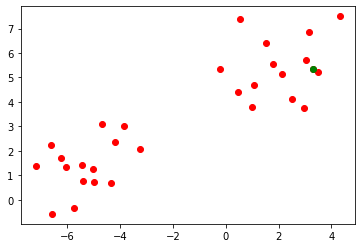

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import syft as sy
import numpy as np
from Dataset import load_dataset, getImage
from utils import averageModels
import random
import math
import matplotlib.pyplot as plt
from no_cluster import get_cluster
import copy

In [2]:
#random.seed(15)
P=2 #signal power threshold
#stream = BitStream()
key=[]
for i in range (10000): #generating a random password to activate training (Pilot signal)
    temp=random.randint(0,1)
    key.append(temp)

key1=[0]*len(key)
for i in range (len(key)):   #bpsk modulation
    if(key[i]==1):
        #print("yay")
        key1[i]=-math.sqrt(P)
    else:
        key1[i]=math.sqrt(P)

#print(key)
        
key_np=np.array(key1)

In [3]:
class Arguments():
    def __init__(self):
        self.images = 10000
        self.clients = 30
        self.rounds = 200
        self.epochs = 2
        self.local_batches = 64
        self.lr = 0.01
        self.C = 0.9 #fraction of clients used in the round
        self.drop_rate = 0.1 #fraction of devices in the selected set to be dropped for various reasons
        self.torch_seed = 0 #same weights and parameters whenever the program is run
        self.log_interval = 64
        self.iid = 'iid'
        self.split_size = int(self.images / self.clients)
        self.samples = self.split_size / self.images 
        self.use_cuda = False
        self.save_model = True
        self.csi_low=0
        self.csi_high=1
 
args = Arguments()

In [4]:
#checking if gpu is available
use_cuda = False
#print(use_cuda)
device = torch.device("cuda:0" if use_cuda else "cpu")
kwargs = {'num_workers': 1, 'pin_memory': True} if use_cuda else {}

hook = sy.TorchHook(torch)
clients = []

#generating virtual clients
for i in range(int(args.clients)):
    clients.append({'hook': sy.VirtualWorker(hook, id="client{}".format(i+1))})
    
global_train, global_test, train_group, test_group = load_dataset(args.clients, args.iid) #load data

In [5]:
for inx, client in enumerate(clients):  #return actual image set for each client
    trainset_ind_list = list(train_group[inx]) 
    client['trainset'] = getImage(global_train, trainset_ind_list, args.local_batches)
    client['testset'] = getImage(global_test, list(test_group[inx]), args.local_batches)
    client['samples'] = len(trainset_ind_list) / args.images #useful while taking weighted average

#load dataset for global model (to compare accuracies)
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
global_test_dataset = datasets.FashionMNIST('./', train=True, download=True, transform=transform)
global_test_dataset = torch.utils.data.random_split(global_test_dataset, [10000, len(global_test_dataset)-10000])[0]
global_test_loader = DataLoader(global_test_dataset, batch_size=args.local_batches, shuffle=True)
trainloader = torch.utils.data.DataLoader(global_train, batch_size=4,
                                          shuffle=True, num_workers=2)

torch.Size([1, 28, 28])


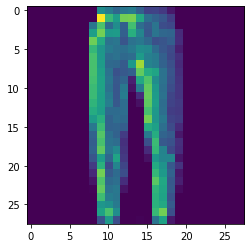

In [6]:
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


# get some random training images
dataiter = iter(trainloader)
images, labels = dataiter.next()

# show images
imshow(images[0])
print(np.shape(images[0]))

In [7]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Linear(784, 512)
        self.conv2 = nn.Linear(512, 10)

    def forward(self, x):
        x = x.view(-1, 784)
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        return F.log_softmax(x, dim=1)
        

In [8]:
def ClientUpdate(args, device, client,key_np,key,snr,csi,mu):
    gc=False
    client['model'].train()
    #simulating a wireless channel
    poptim=max((1/mu-1/csi),0)
    #print(mu,csi)
    print("Power Allocated=",poptim)
    print("CSI=",csi)
    
    snr__=10**(snr/10)
    
    absh=csi*poptim/snr__
    x=random.uniform(0,absh)
    #print(x)
    y=math.sqrt(absh*absh-x*x)
    #x=x*100
    #y=y*100
    #x=random.random()
    #y=random.random()
    #snr=10*math.log(poptim/(std*std),10)
    std=math.sqrt(poptim/snr__*absh*absh) #channel noise
    
    #print(x,y)
    h=complex(x,y)
    #std=math.sqrt(abs(h)/csi)
    #snr=poptim/(std*std)
    #print(std)
    print("SNR=",snr)
    #print("csi",abs(h)/(std*std))
    
    
    if(poptim!=0):
        data=client['model'].conv1.weight
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        data=data*math.sqrt(poptim) #transmitted signal
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data

    
    #print(client['model'].conv1.weight.size)
    client['model'].send(client['hook'])
    print("Client:",client['hook'].id)
    
    key_np_received=h*key_np+(np.random.randn(len(key_np))*std*2)
    #print(key_np_received)
    key_np_received=(key_np_received/(h)).real
    
    for o in range (len(key_np_received)):  #demodulation bpsk
        if(key_np_received[o]>=0):
            key_np_received[o]=0
        else:
            key_np_received[o]=1
    
    key_np_received=key_np_received.tolist()
    key_np_received = [int(item) for item in key_np_received]
    #key_np=key_np.tolist()
    
    
    if(sum(np.bitwise_xor(key,key_np_received))/len(key)==0 and poptim>0): #...............................................checking if channel is good enough for transmission by checking BER..................................#
        gc=True #considering the client model for training
        for epoch in range(1, args.epochs + 1):
            for batch_idx, (data, target) in enumerate(client['trainset']): 
                data,target=data,target
                data = data.send(client['hook'])
                target = target.send(client['hook'])
                
                #train model on client
                data, target = data.to(device), target.to(device) #send data to cpu/gpu (data is stored locally)
                output = client['model'](data)
                loss = F.nll_loss(output, target)
                loss.backward()
                client['optim'].step()
                
                if batch_idx % args.log_interval == 0:
                    loss = loss.get() 
                    print('Model {} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                        client['hook'].id,
                        epoch, batch_idx * args.local_batches, len(client['trainset']) * args.local_batches, 
                        100. * batch_idx / len(client['trainset']), loss))
    else:
        print("Poor Channel, client not taken for averaging in this round")
            
                    
    client['model'].get() 
    #CHANGE
    if(poptim!=0):
        data=client['model'].conv1.weight
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        data=data*math.sqrt(poptim) #transmitted signal
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
    #CHANGE ENDS
    print()
    return gc

In [9]:
def test(args, model, device, test_loader, name):
    model.eval()    #no need to train the model while testing
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            if(use_cuda):
                data,target=data.cuda(),target.cuda()
                #model.cuda()
            else:
                data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(1, keepdim=True) # get the index of the max log-probability 
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss for {} model: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        name, test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return(100. * correct / len(test_loader.dataset))


In [10]:
torch.manual_seed(args.torch_seed)
#global_model = Net() #redundant code as we don't use it for training: assigns a CNN to the global model

for client in clients: #give the model and optimizer to every client
    torch.manual_seed(args.torch_seed)
    client['model'] = Net().to(device)
    #client['model'] = torch.quantization.quantize_dynamic(
    #client['model'],  # the original model
    #{torch.nn.Linear},  # a set of layers to dynamically quantize
    #dtype=torch.fp)  # the target dtype for quantized weights
    client['optim'] = optim.SGD(client['model'].parameters(), lr=args.lr)
    

accuracy=[]
rc=1

[3.404789905045086, 4.5296012076772785, 4.644858008883832, 4.988821639600507, 5.159259245317989, 5.481605188045396, 5.763716831196649, 5.793773047542457, 5.808528005279032, 6.445983530041328, 7.027128190861585, 7.179421131547728, 7.5725046557150355, 7.593315553337266, 8.858041469455715, 13.12832021207836, 13.376246860649108, 13.545407086100507, 14.92795654834405, 15.719034446696819, 15.73789526637954, 15.814617278939222, 16.727271644180114, 19.824374113130002, 20.183965356389123, 20.470751680587888, 21.514122884478798, 23.620161747980674, 30.23824665820562]


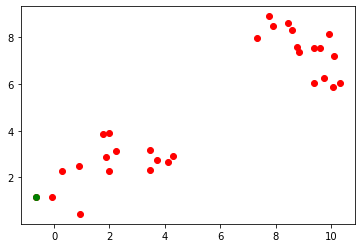

Power Allocated= 3.2478371452081154
CSI= 0.9918603607554372
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9909063897892283
CSI= 0.790428110284292
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.758748579055613
CSI= 0.6678710595501768
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 10.683827


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 5.230212

Power Allocated= 2.0700649138638116
CSI= 0.4574610057400239
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0236594453464702
CSI= 0.811435306857616
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 3.667111
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 1.379747

Power Allocated= 2.9388099913768406
CSI= 0.7591667925906083
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 7.638936
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 1.324704

Power Allocated= 2.958549726763197
CSI= 0.7707165595052428
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.029885837108053037
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.956503301334382
CSI= 0.769502888802

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 1.4480265600433522
CSI= 0.3561231973385731
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 10.309594
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 3.439664

Power Allocated= 3.2289383600268406
CSI= 0.9736100827033063
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10879407598090385
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02537820848097072
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.137671218675107
CSI= 0.8941565733333308
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8566191322840595
CSI= 0.4167666125789439
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocat

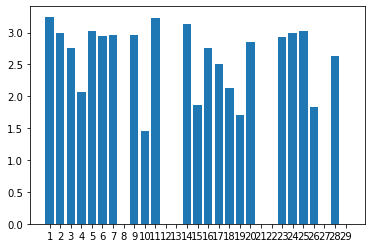

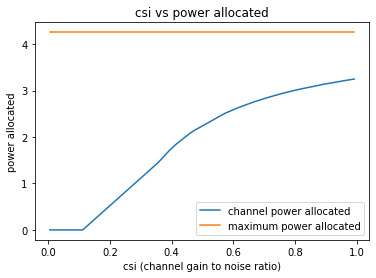

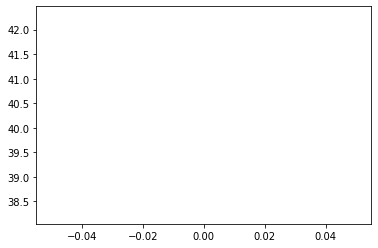

1
Power Allocated= 0
CSI= 0.0926761003144907
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7436370938994323
CSI= 0.6629430673630204
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1395582207250614
CSI= 0.898873148782519
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.371668493690017
CSI= 0.34717475613976323
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4062094678552133
CSI= 0.35138852094062056
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0730838826057942
CSI= 0.4589306690124969
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.995213278665177
CSI= 0.7956405444525
SNR=

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5825125984422304
CSI= 0.2725130042928352
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 45.588436
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 18.044289

Power Allocated= 3.213469695755882
CSI= 0.9628414874812292
SNR= 5.808528005279032


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4907413260496623
CSI= 0.5677557032867597
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1748173121393407
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2340680493834797
CSI= 0.49554156280501105
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0473431387527867
CSI= 0.8300690098669778
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 8.919844
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 2.166424

Power Allocated= 2.857827678499353
CSI= 0.717239423195565
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7301784562049694
CSI= 0.39652897662628206
SNR= 8.858041469455715


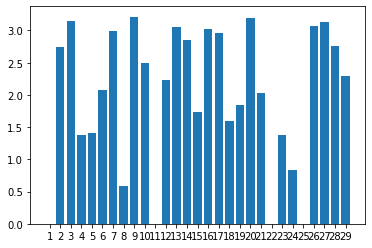

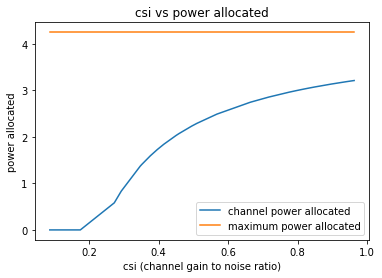

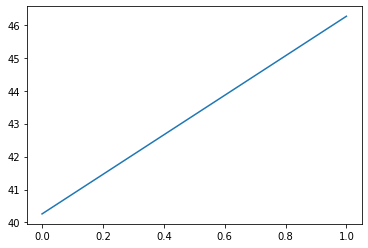

2
Power Allocated= 0
CSI= 0.07985822449968438
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6620748367159415
CSI= 0.5178716298865494
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08498230233069903
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5809439838684396
CSI= 0.9880336121925534
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 2.682160
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 1.156971


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 3.130541296402264
CSI= 0.6837541365593558
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09719501194710078
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14607236544226931
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0306521980687688
CSI= 0.2807093894987561
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2211409795548667
CSI= 0.7289084929108667
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1184191895999636
CSI= 0.6781334002914314
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.514917103512232
CSI= 0.9275248784427413
SNR= 7.02712819086

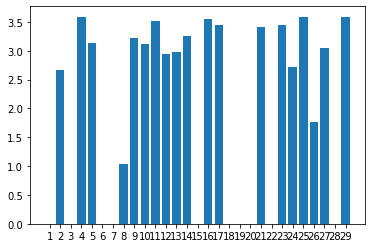

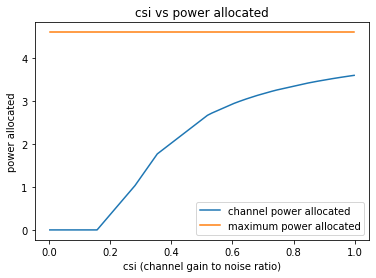

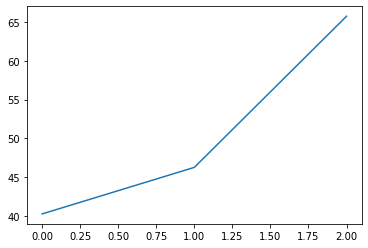

3
Power Allocated= 0.04793830671327637
CSI= 0.1991227758605303
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 48.716881
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 21.166382

Power Allocated= 0
CSI= 0.054806455475093
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_


Power Allocated= 0
CSI= 0.03545991597399023
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04217925495064023
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02191959740329097
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4132648343502074
CSI= 0.6036093339646792
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 7.417280
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 4.856438

Power Allocated= 3.9330949337750947
CSI= 0.8796075898099646
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 7.734293
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 3.515228

Power Allocated= 3.6836999620451287
CSI= 0.7213625060558594
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averagin

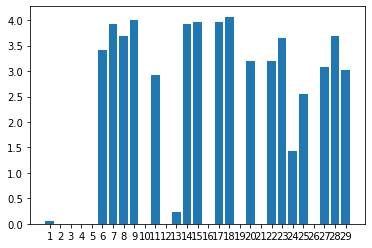

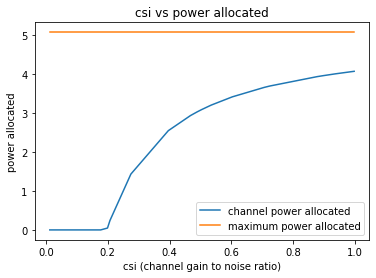

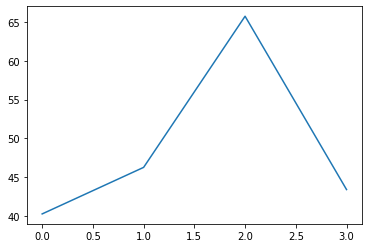

4
Power Allocated= 3.292485125882476
CSI= 0.8143973600581502
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 2.189646
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 4.826301

Power Allocated= 2.1371464487467815
CSI= 0.4195967639525132
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.4647655147543452
CSI= 0.947309301641277
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 8.166644
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 3.112698

Power Allocated= 2.911859247818528
CSI= 0.6216865284171587
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2972258013139184
CSI= 0.817553766371252
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4810458264546984
CSI= 0.962148020547276
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.954153916738426
CSI= 0.6384745959746956
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.003917258037150928
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allo

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 6.867606

Power Allocated= 0
CSI= 0.1499070018904387
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.2742539837163358
CSI= 0.2355084047270961
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.651282350702398
CSI= 0.5350155379132441
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17734397637994526
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8262626372270754
CSI= 0.5902754569657549
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1796142742962903
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.506143134500

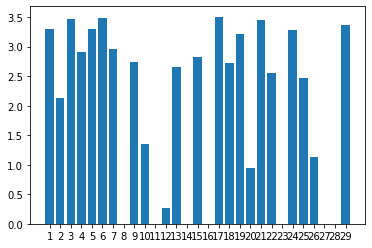

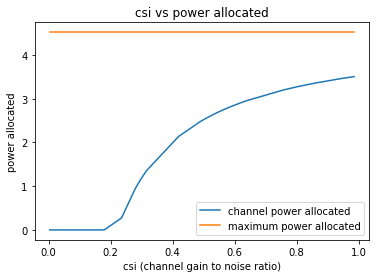

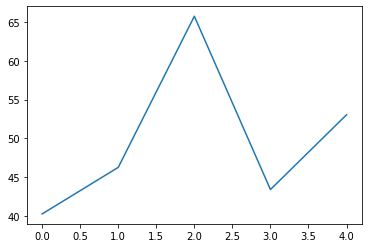

5
Power Allocated= 0
CSI= 0.14503088456833968
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.217906214152735
CSI= 0.47075301375322864
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7649264699322047
CSI= 0.6340205564166402
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2434207844472724
CSI= 0.9101320899199303
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.780464680830089
CSI= 0.2807649833660534
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 22.355927


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 17.066010

Power Allocated= 1.486682680216291
CSI= 0.3502038533723002
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0536451926821986
CSI= 0.7760858735504222
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.002025158939582
CSI= 0.7461922344171747
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18058494542254133
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0796488924774486
CSI= 0.7920707354951537
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.924952077250702
CSI= 0.7056115709528225
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Powe

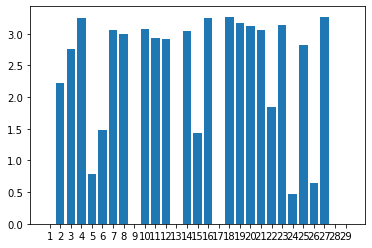

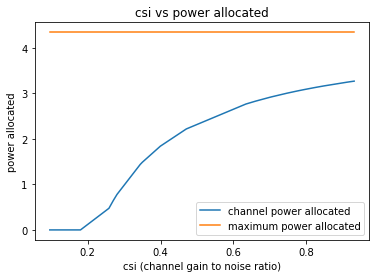

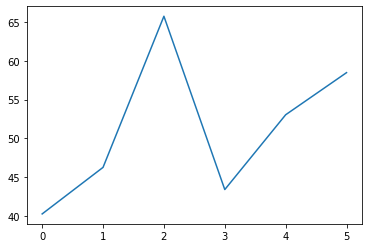

6
Power Allocated= 2.4424727171121194
CSI= 0.5775344641223971
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 2.169420
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 1.759509

Power Allocated= 2.7821168440031436
CSI= 0.7184660204971514
SNR= 4.5296012076772785
Client: client2


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Poor Channel, client not taken for averaging in this round

Power Allocated= 2.85258373203569
CSI= 0.756780344692575
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1629543641256221
CSI= 0.3321137284731237
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 8.310883
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 1.789679

Power Allocated= 2.830326879856849
CSI= 0.7442446244408252
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9108494581800475
CSI= 0.7916893782271534
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.586020048426228
CSI= 0.6297423266650882
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 4.109083
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 1.216758

Power Allocated= 1.935821588559484
CSI= 

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9480883998566645
CSI= 0.8157387217660318
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4247531458839955
CSI= 0.3637398019459449
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 11.089972
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 3.817110

Power Allocated= 2.3746926285540657
CSI= 0.555778333876827
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7963683886413384
CSI= 0.7258986789536855
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 2.032096
Model client17 Train Epoch: 2 [0/384 (0%)]	Loss: 1.267370

Power Allocated= 2.788087936391803
CSI= 0.7215615389717615
SNR= 13.545407086100507
Client: client18
Model client18 Train Epoch: 1 [0/384 (0%)]	Loss: 6.213252
Model clie

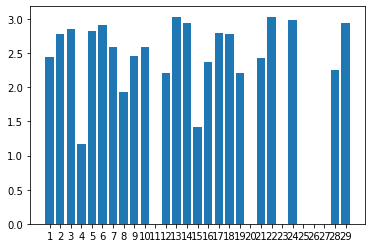

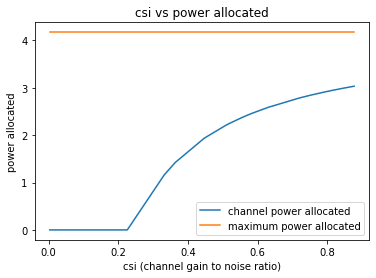

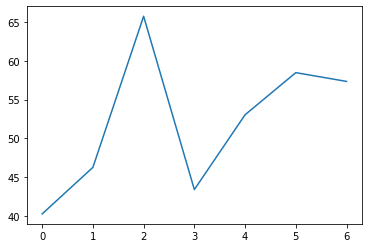

7
Power Allocated= 2.8598040267211857
CSI= 0.7236949886968402
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.134647777768099
CSI= 0.9033800271709214
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1498338524389684
CSI= 0.9159456998772769
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1818771978470517
CSI= 0.9436415456836271
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 7.818688


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 3.011646

Power Allocated= 0
CSI= 0.05103663003916836
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18915200742976046
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.533793285579903
CSI= 0.5855457984991723
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.826759732328615
CSI= 0.706792753671865
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.162921830280791
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8625637027585396
CSI= 0.42033798161184976
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2380039912723992
CSI

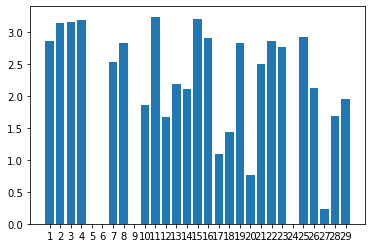

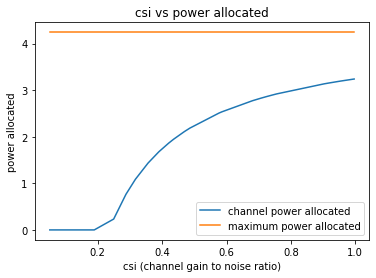

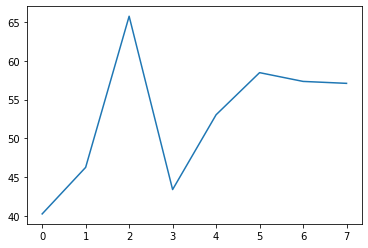

8
Power Allocated= 0.9049771347974169
CSI= 0.29834794657176344
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0395376455499816
CSI= 0.8215370093938292
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1911778727464838
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4202338512210066
CSI= 0.5445038189229067
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.248069726157774
CSI= 0.9913764766444801
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3122795345238223
CSI= 0.5142740022650635
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 0.8654110957803987
CSI= 0.29486720245731257
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.22176225132024696
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0588334077865755
CSI= 0.8347699350009321
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.115440395484165
CSI= 0.8761724213910763
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0434862003058063
CSI= 0.8242106530329992
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.256753482023706
CSI= 0.9999852207058469
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.944208859930254
CSI= 0.7618702809003607


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0.3879073625683147
CSI= 0.2584740124067918
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 29.036879
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 11.165365

Power Allocated= 0
CSI= 0.127219255072202
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.563542027987635
CSI= 0.5905885345895009
SNR= 13.545407086100507
Client: client18
Model client18 Train Epoch: 1 [0/384 (0%)]	Loss: 6.209761
Model client18 Train Epoch: 2 [0/384 (0%)]	Loss: 1.886916

Power Allocated= 0
CSI= 0.01819784189289886
SNR= 14.92795654834405
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.009718803997525
CSI= 0.8018928150401085
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7507554600198665
CSI= 0.6640049798999633
SNR= 15.73789526637954
Client: client21
Poor Channel, cl

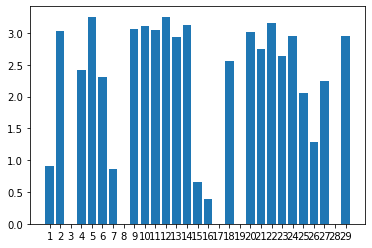

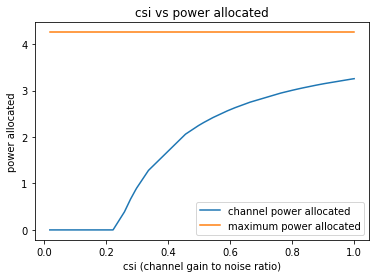

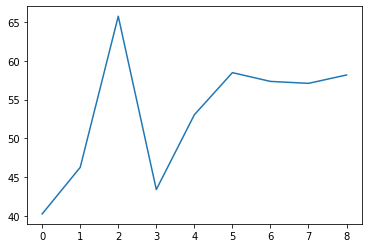

9
Power Allocated= 3.206548577967632
CSI= 0.5076217552591582
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1040453390614593
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07850485372184934
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6789823461814692
CSI= 0.4003944746846936
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.274401036747049
CSI= 0.5257296640770538
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5076101201760848
CSI= 0.3746849103768156
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0910496857012838
SNR= 5.763716831196649


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.026811602570027904
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6505187408992006
CSI= 0.6553077510491642
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.792893863484765
CSI= 0.7227389490866128
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.1107347686111995
CSI= 0.9382759485158041
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.995000993161392
CSI= 0.8463685980047219
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6161583654792877
CSI= 0.28087039938563474
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averag

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client18 Train Epoch: 2 [0/384 (0%)]	Loss: 1.342456

Power Allocated= 3.5203302773817713
CSI= 0.6037958115051537
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 1.780757
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 1.070121

Power Allocated= 0
CSI= 0.008835184553047104
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.091743670807988
CSI= 0.9218496114126448
SNR= 15.73789526637954
Client: client21
Model client21 Train Epoch: 1 [0/384 (0%)]	Loss: 1.860134
Model client21 Train Epoch: 2 [0/384 (0%)]	Loss: 1.329067

Power Allocated= 2.710939092258564
CSI= 0.4055840460781992
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 [0/384 (0%)]	Loss: 1.791427
Model client23 Train Epoch: 2 [0/384 (0%)]	Loss: 1.212492

Power Allocated= 3.89433043023287
CSI= 0.7799162954962088
SNR= 16.727271644180114
Client: client24
Poor Channel, client not taken for averaging i

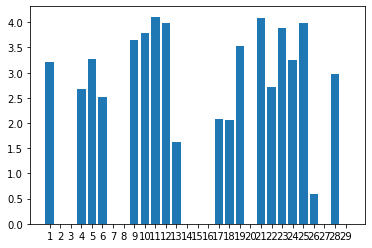

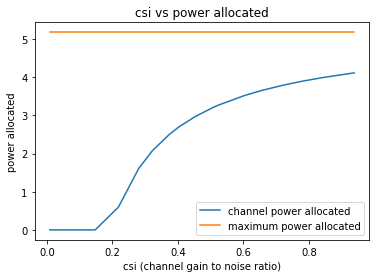

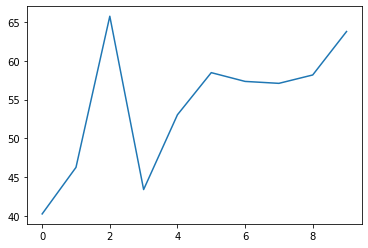

10
Power Allocated= 2.0974442790044394
CSI= 0.3653978344391946
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6737988343565577
CSI= 0.8617803146180452
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04089674868109916
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2275778181056216
CSI= 0.2772687158814876
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 13.047264


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 3.435302

Power Allocated= 3.451372239162773
CSI= 0.7231624643495511
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09854872845060303
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5833103143676266
CSI= 0.4442712657802287
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4874204690866195
CSI= 0.7425189890082925
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.451783190368541
CSI= 0.7233774409030097
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.173945122518591
CSI= 0.27320596057279056
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 24.125507
Model 

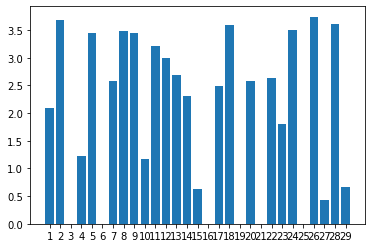

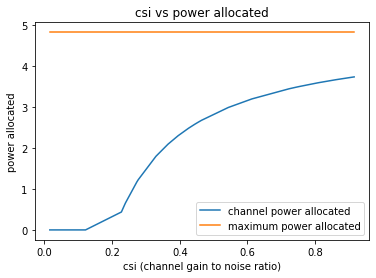

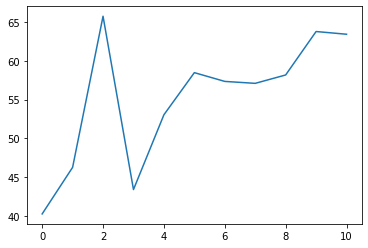

11
Power Allocated= 3.67567371116316
CSI= 0.9923309566930574
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1529700345035936
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09508602468589433
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.310833419945077
CSI= 0.7285610333842032
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18113924763026845
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.508024956937916
CSI= 0.850790804651849
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03881957909087397
SNR= 5.763716831196649
Client: client7
Poor Channel,

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 3.484136339721098
CSI= 0.8338435875811079
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.004713889129690507
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5879696850931158
CSI= 0.9128815766939782
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.571948731375876
CSI= 0.8997229189287592
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19412423979474003
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8819345437133337
CSI= 0.35695577668191136
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0993264433663853
SNR= 7.593315553337266
Client

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0.7787973776628765
CSI= 0.2561078753863816
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 15.237306
Model client17 Train Epoch: 2 [0/384 (0%)]	Loss: 3.110530

Power Allocated= 2.853410227871966
CSI= 0.5464505373939854
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1245278596528028
CSI= 0.6414885969405303
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 1.831303
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.845403

Power Allocated= 0
CSI= 0.20370808556821662
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.103377529866912
CSI= 0.632901581083389
SNR= 15.73789526637954
Client: client21
Model client21 Train Epoch: 1 [0/384 (0%)]	Loss: 1.744979
Model client21 Train Epoch: 2 [0/384 (0%)]	Loss: 0.933264

Power Allocated= 3.57792487650042
CSI= 0.90

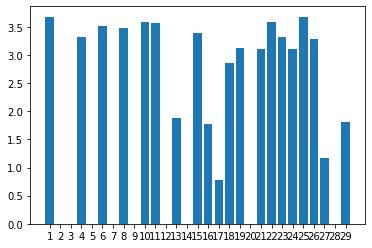

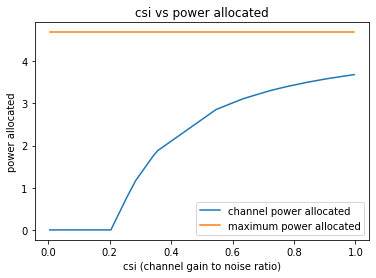

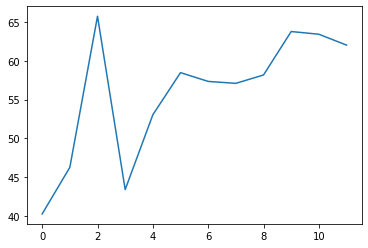

12
Power Allocated= 3.7984947376979146
CSI= 0.994071556226702
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5426320392136783
CSI= 0.7925019813260743
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4207956245637408
CSI= 0.419522405858327
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1877931130302396
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17028010271153748
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5319653358921883
CSI= 0.44004532083189607
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5387175244211777
CSI= 0.7900510370200318
SNR= 5.763716831

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.499392286362975
CSI= 0.43382701017668535
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5925811595396695
CSI= 0.8251659930016699
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 4.331036
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 1.740052

Power Allocated= 3.0999256157178587
CSI= 0.5866709801890403
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2319282325890994
CSI= 0.38872234005641204
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 5.355266
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 1.519051

Power Allocated= 0
CSI= 0.19579189678177567
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6251643634

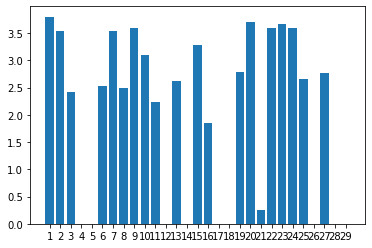

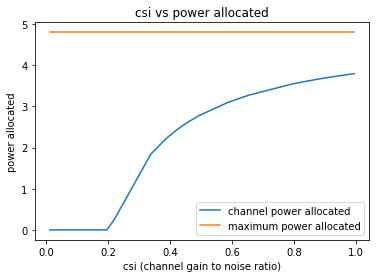

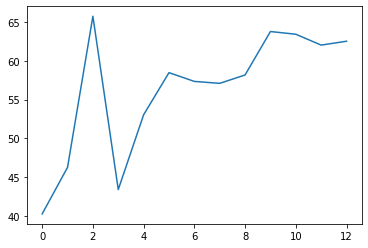

13
Power Allocated= 0
CSI= 0.2127750908927396
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1263871146984853
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03491645352278727
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2086664749855625
CSI= 0.46246089805586155
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7468093110864795
CSI= 0.6156869116097262
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5262813775584987
CSI= 0.5420847276398506
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03507546083346724
SNR= 5.763716831196649
Client: client7


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9682397950011223
CSI= 0.7128743976075712
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8642801126345656
CSI= 0.6636883257420555
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 1.798630
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 1.984520


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.3610993609213233
CSI= 0.9901851941211788
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 2.133319
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 1.728849

Power Allocated= 3.246708050914945
CSI= 0.8894396290094424
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.152678766472143
CSI= 0.8207938700465427
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2640559420335125
CSI= 0.9033786732627735
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2480441960452975
CSI= 0.8904979149235581
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16552681984695194
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round


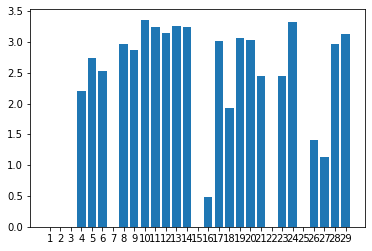

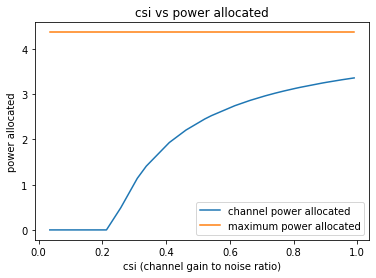

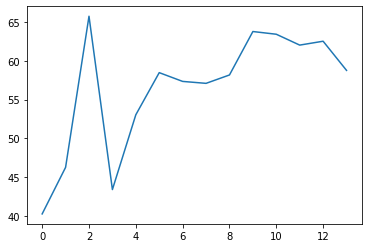

14
Power Allocated= 0
CSI= 0.18413076551345375
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.429000324413578
CSI= 0.2719839594769634
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7132709808192965
CSI= 0.7181757876584117
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 3.997897
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 1.522009


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 0
CSI= 0.09970845480325663
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.451899666051184
CSI= 0.604672399134745
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2640726479325903
CSI= 0.3519125458442829
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.074646477357657
CSI= 0.492358289462006
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.9783999931852936
CSI= 0.8870849579011892
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17082277129255719
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1361432876145514
CSI= 0.2519180759827221
SNR= 6.44598353004132

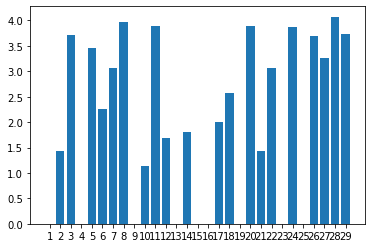

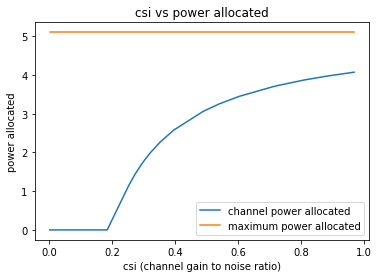

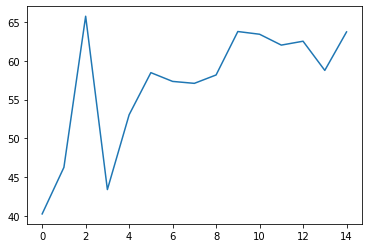

15
Power Allocated= 0.9607958649818555
CSI= 0.2539796543634486
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7134163839793985
CSI= 0.4577281762315297
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.142564432476993
CSI= 0.26627225073334837
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.368383354491796
CSI= 0.6537076670833607
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 6.775469


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 1.304721

Power Allocated= 3.6489773546274895
CSI= 0.8005496460961407
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 3.325538
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 3.972751

Power Allocated= 0
CSI= 0.17011524164324754
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1585766045578203
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.382586516518762
CSI= 0.6598340386828223
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.235211707210289
CSI= 0.6013563899898144
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7764277946935065
CSI= 0.4713220943162406
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch:

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 2.066534

Power Allocated= 2.6373840270352167
CSI= 0.4423340010571821
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 5.131783
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 2.175835

Power Allocated= 0
CSI= 0.18329364060907738
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4585248125836996
CSI= 0.6946401449910491
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8272044937151182
CSI= 0.3256358840801441
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.596281499501993
CSI= 0.7681449533494658
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 4.011051
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 1.981786

Power Allocated= 1.8464181667008068
CSI= 0.

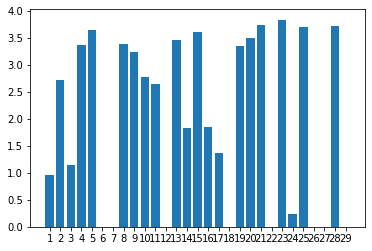

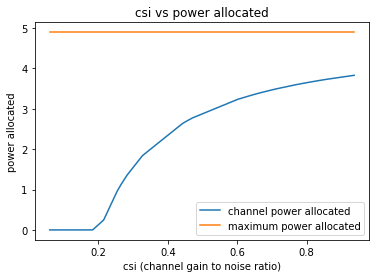

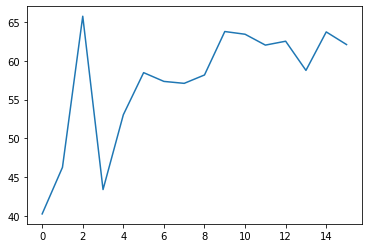

16
Power Allocated= 1.2749882160215935
CSI= 0.341517777176621
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 1.502024
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 1.382326

Power Allocated= 2.4282941970843517
CSI= 0.5634439969800784
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.8676091884099044
CSI= 0.7487920364873385
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09519460652545753
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.682296942753799
CSI= 0.6575501571796901
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.407431


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 2.717175

Power Allocated= 2.9188811251661813
CSI= 0.7786874177999056
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0015583007332280463
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1853896502837205
CSI= 0.331377781746936
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.113792856178878
CSI= 0.4786290637787728
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.196203503759234
CSI= 0.9931571738475624
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9323330634800993
CSI= 0.44038111380418654
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Po

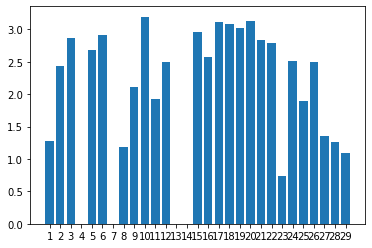

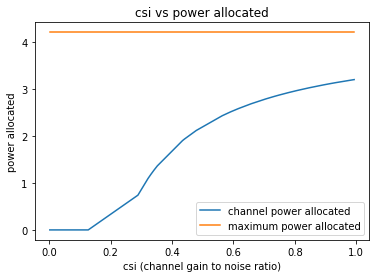

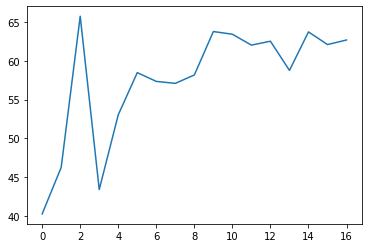

17
Power Allocated= 3.4208813940122376
CSI= 0.8674177102849132
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.461933701036659
CSI= 0.8994465505735116
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 1.481204
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 1.182587


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.6713656506248173
CSI= 0.5256620725646644
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.299705899480756
CSI= 0.7849154299646989
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6937298267575125
CSI= 0.5319152680177757
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15235287964243682
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0557676172979176
CSI= 0.6587785028621665
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7988048851967822
CSI= 0.360370279532223
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.5890555679055973
CSI= 0.5038613577467793
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 1.406044
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 1.334350

Power Allocated= 2.547819246532884
CSI= 0.49360552382720657
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.697043985497153
CSI= 0.5328546116407237
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.513922
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 1.362867

Power Allocated= 0
CSI= 0.046807733908453164
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8403838922887212
CSI= 0.36585214901441887
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 1.256712
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 1.468217

Power Allocated= 2.5037612266430314
CSI= 0.48

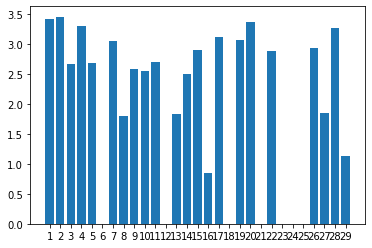

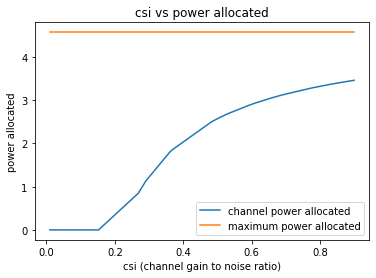

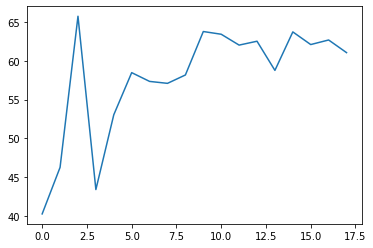

18
Power Allocated= 3.095823133660004
CSI= 0.7558065896990642
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.627381404145798
CSI= 0.5581816316641539
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8974797482760777
CSI= 0.6572749960798363
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1988136006192476
CSI= 0.3105494248166497
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5548024833710627
CSI= 0.25879177350260607
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.264674


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 1.607143

Power Allocated= 1.2041261625083597
CSI= 0.31106261998303286
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.665002442011187
CSI= 0.5701545186705881
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9148601807045709
CSI= 0.3993526068196869
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 2.146033
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 1.862663

Power Allocated= 2.7941909488345713
CSI= 0.6154899120425
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0176046595629
CSI= 0.7136188436682478
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5038721068001752
CSI= 0.5221820750719682
SNR= 7.027128190861585
Client: client

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 0.709246

Power Allocated= 3.365459245894941
CSI= 0.9492586134129442
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09389303679935035
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0426376213059934
CSI= 0.29618437580217927
SNR= 13.545407086100507
Client: client18
Model client18 Train Epoch: 1 [0/384 (0%)]	Loss: 5.227938
Model client18 Train Epoch: 2 [0/384 (0%)]	Loss: 2.632073

Power Allocated= 0
CSI= 0.15203102341248698
SNR= 14.92795654834405
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13285815159049663
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1293352988606165
CSI= 0.7754476832943918
SNR= 15.73789526637954
Client: client21
Model client21 Train Epoch: 1

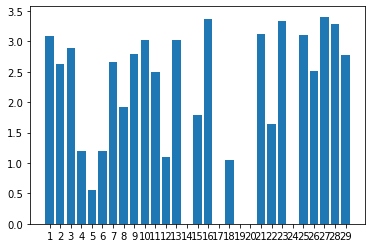

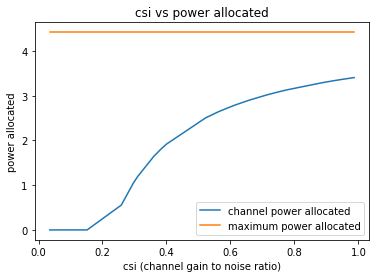

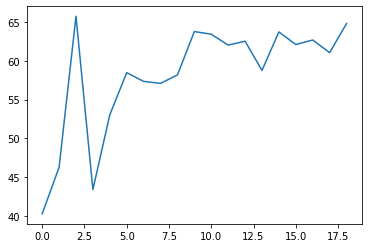

19
Power Allocated= 0
CSI= 0.04435354221385357
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3040336142703763
CSI= 0.9504565083980888
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.677659841700647
CSI= 0.595770115118193
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7599465752371346
CSI= 0.6264827929711102
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1905851995749757
CSI= 0.8579460833414986
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.809831301129473
CSI= 0.6466931986337683
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.438690


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 1.751547

Power Allocated= 3.18131526530044
CSI= 0.8511765875851793
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 3.390002
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 1.037517

Power Allocated= 2.1751748140908487
CSI= 0.45850846921010235
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.05675468527199268
CSI= 0.23259032763370346
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 9.384716
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 3.416837

Power Allocated= 3.172619710057172
CSI= 0.8449229301956577
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0934934236482694
CSI= 0.3064977975002867
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 2.168498
Model client11 Train Epoch: 2 [0/384 

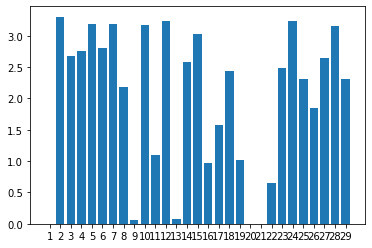

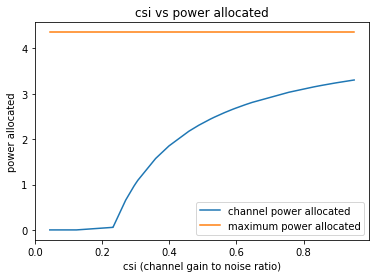

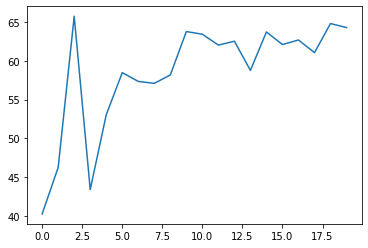

20
Power Allocated= 2.1290180821790945
CSI= 0.3864042804011072
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.70447388902902
CSI= 0.9876472557281006
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2563718132949915
CSI= 0.2889664529806846
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5392226033042604
CSI= 0.45918773215140773
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10861716165282576
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.708504055740754
CSI= 0.9915941804390084
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 1.9887991924329778
CSI= 0.36654446885273095
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.728414429920159
CSI= 0.33460855977505755
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6933607915815023
CSI= 0.9769247058114203
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19632683165431764
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.555073980756858
CSI= 0.8606539678018401
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.036992


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.702833

Power Allocated= 3.69180916045977
CSI= 0.9754460984956773
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2648104961637876
CSI= 0.4078019634339477
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18702782251925387
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.055607589433559035
CSI= 0.21452904189119282
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 66.239418
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 40.068928

Power Allocated= 0
CSI= 0.018773123132850067
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1283768336265534
CSI= 0.27865986796931785
SNR= 13.376246860649108
Client: client17
Poor Chan

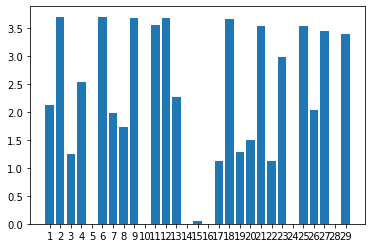

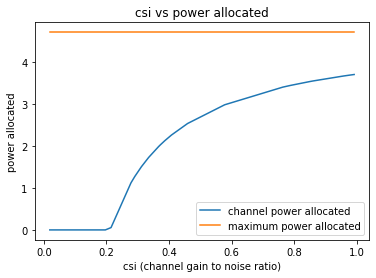

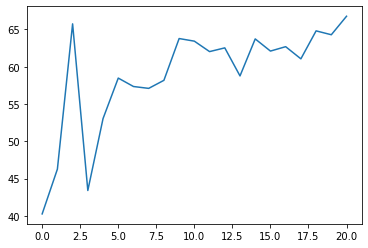

21
Power Allocated= 0
CSI= 0.1982386393862715
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.358359626852913
CSI= 0.7115615085001911
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.055394032196348
CSI= 0.5853685446408717
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20682916209415592
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8507442986549076
CSI= 0.3432916268396796
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.011716631725413928
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06624132696452589
SNR= 5.763716831196649


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2680011881051074
CSI= 0.6685750812126784
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.415802245579248
CSI= 0.42590938540231704
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.65323119234317
CSI= 0.4738239916295711
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 1.182198
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 1.142363


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0
CSI= 0.12642999972105018
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7194654027665743
CSI= 0.9576213212576291
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.740592828785414
CSI= 0.33078335932386826
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.740956519749364
CSI= 0.4943732922415762
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06450836923723213
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.364957901736413
CSI= 0.7149181050742575
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5998572434149496
CSI= 0.8592081956980988
SNR= 13.3762

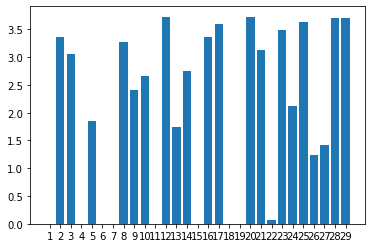

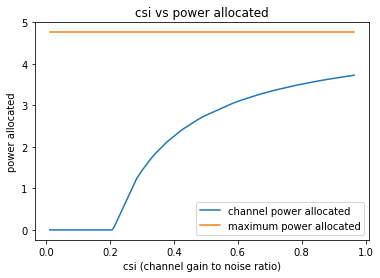

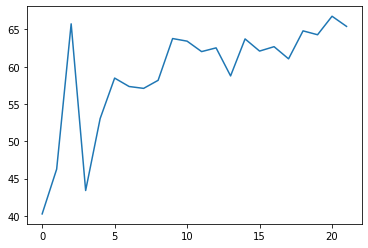

22
Power Allocated= 0.4800246474018257
CSI= 0.23537415109965265
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14643797418751658
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.303680907723155
CSI= 0.7018043115923011
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 1.480128
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 1.053477


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 3.0782614027843778
CSI= 0.6059437757217871
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 1.637152
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 1.971510

Power Allocated= 3.1376905245303095
CSI= 0.6285793626094826
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3853012808278855
CSI= 0.23024083228068826
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 30.793957
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 10.485627

Power Allocated= 1.591141563133026
CSI= 0.3187314009264596
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0690614747295033
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.017729037643522183
SNR= 5.808528005279032
Client: client9
Poor Channel, client not 

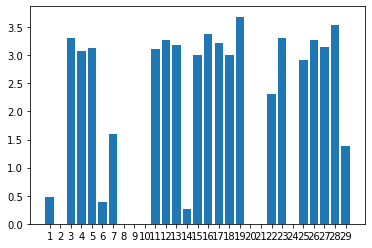

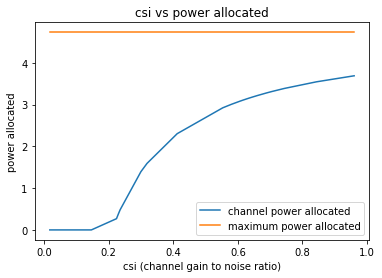

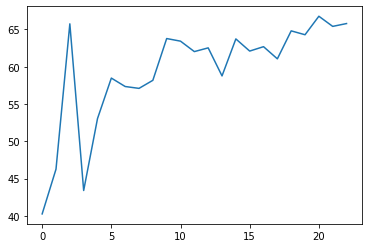

23
Power Allocated= 2.5442194104925413
CSI= 0.44889677736542277
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02365231355827213
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3856451855363368
CSI= 0.7213665195381286
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9838710181969628
CSI= 0.2639893209937193
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 2.022026
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 1.268788


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 3.116129842166611
CSI= 0.6039474514807519
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 2.637196
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 1.396403

Power Allocated= 3.593573707632813
CSI= 0.8486591794275374
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9520689145860977
CSI= 0.2617914727432704
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.617628623683698
CSI= 0.8663451171196747
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0843605913810177
CSI= 0.27118331932673134
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.030159600460261
CSI= 0.3647314287061142
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 1.3

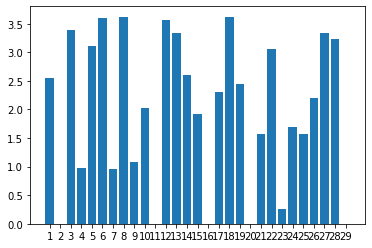

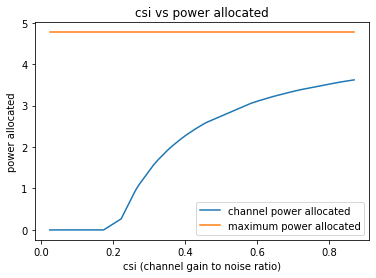

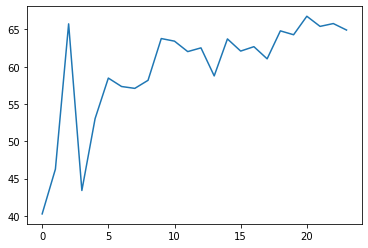

24
Power Allocated= 3.3378550824726867
CSI= 0.8468133731203348
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.68491416037414
CSI= 0.5453042406153328
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 1.040465
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 1.015408


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.611808802598947
CSI= 0.5243992422753151
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.828406
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.703029

Power Allocated= 2.687653225857514
CSI= 0.5461199384751008
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19653038964383795
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5126551200686307
CSI= 0.9939392524929591
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.930710
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 1.885853


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 3.1576628750346143
CSI= 0.7347053004085674
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15351746517301346
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08261173218281359
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.169448324133282
CSI= 0.7411225560539195
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19865593568574746
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9605771201454747
CSI= 0.6417761471857649
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9791755359534093
CSI= 0.6495289373392276
SNR= 7.5725046557150355
Client:

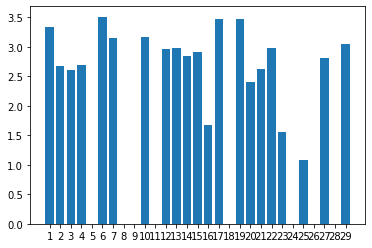

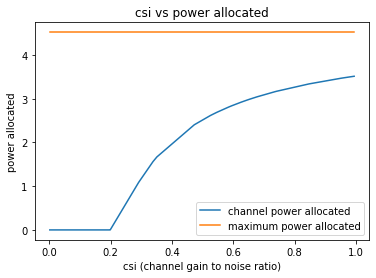

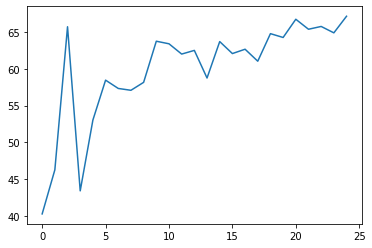

25
Power Allocated= 2.917281121777785
CSI= 0.8911514915271255
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0397802594946328
CSI= 0.3333728350787939
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.859585591261051
CSI= 0.8475731307576373
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09771675615339104
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4685152941035255
CSI= 0.6365739116194585
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2766329581068314
CSI= 0.5672819582137917
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.813449039283717
CSI= 0.8156768213001545
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6827574742309777
CSI= 0.7371003866538791
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5728063732236617
CSI= 0.6818406146747367
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7988301785877594
CSI= 0.8060650869325215
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5042124661983234
CSI= 0.6513757003898822
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.651056


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 1.176452

Power Allocated= 0
CSI= 0.09365200007683339
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9165357376135783
CSI= 0.4710561773362696
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 6.541657
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 2.328242

Power Allocated= 2.2151629011528056
CSI= 0.5481669097814686
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0097223728342217
CSI= 0.49268306208698787
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 1.224112
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 2.122937

Power Allocated= 0
CSI= 0.24263263903308774
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9914678817550096
CSI= 0.95423771343480

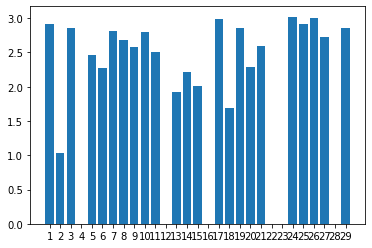

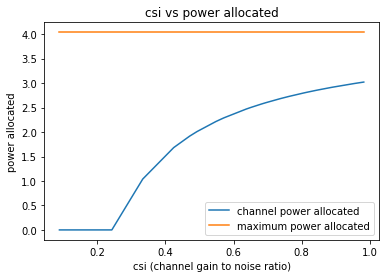

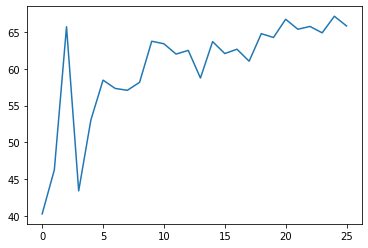

26
Power Allocated= 2.2583405893398587
CSI= 0.43818124108739265
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14642065765402634
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1813274615000109
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1083364526838815
CSI= 0.698243656716714
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.216335318619131
CSI= 0.7551923517929574
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.279040912572869
CSI= 0.7927320054486229
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.9642800216794214
CSI= 0.6344287010563168
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.37120906929934
CSI= 0.8552182236862187
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1401519033548926
CSI= 0.7141075097840162
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02225328058385334
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6250808660791183
CSI= 0.5220785981255164
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.021194632441398298
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19473076579290438
SNR= 7.5725046557150355
Client:

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0
CSI= 0.10918372494667405
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.028639159456123386
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3856725387830604
CSI= 0.8659292688234587
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1351362003872154
SNR= 14.92795654834405
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3992130646379097
CSI= 0.8762028680634338
SNR= 15.719034446696819
Client: client20
Model client20 Train Epoch: 1 [0/384 (0%)]	Loss: 1.205842
Model client20 Train Epoch: 2 [0/384 (0%)]	Loss: 1.243222

Power Allocated= 3.477748646482742
CSI= 0.9409527453612354
SNR= 15.73789526637954
Client: client21
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.090088591

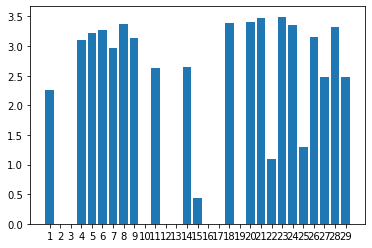

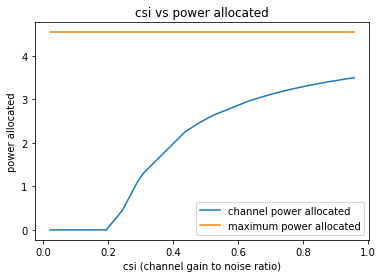

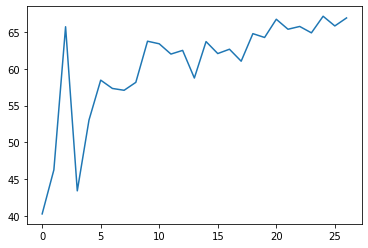

27
Power Allocated= 3.1741396612249524
CSI= 0.6974811119661797
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5022161117977513
CSI= 0.9044419700024078
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.490712963075254
CSI= 0.8951291089714762
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 1.183183
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 1.106983


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.6053653188959944
CSI= 0.9975013354850506
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.31832260565114
CSI= 0.7754657304022028
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.016054
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.979936

Power Allocated= 0
CSI= 0.20135463474065107
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2705370703270615
CSI= 0.2996404459631907
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04637048408292965
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8119025736892986
CSI= 0.35765792687806763
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5123

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.11354669114058957
CSI= 0.22250289472939355
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 1.943748
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 1.083501

Power Allocated= 2.31441637896767
CSI= 0.4360235956587356
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16271421773424322
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4736378359697
CSI= 0.8816535256384109
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 1.344535
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 1.090360

Power Allocated= 2.2181488040930257
CSI= 0.41845881447973043
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.606123

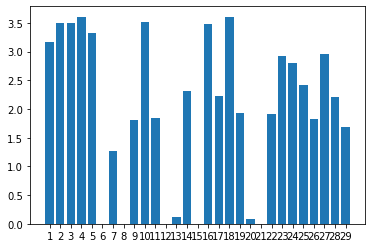

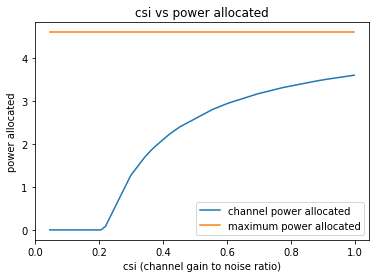

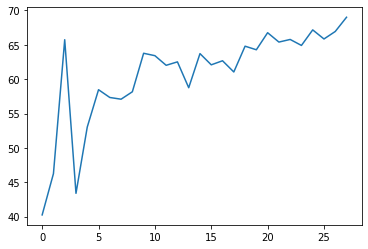

28
Power Allocated= 4.106311331204566
CSI= 0.7728931692750095
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18400591600625416
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.054955920537795
CSI= 0.7433864897685215
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05583788903498377
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11488141932349749
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10830093127612672
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1587526479157949
SNR= 5.763716831196649
Client: client7
Poor Channel, client not t

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 3.083771979312493
CSI= 0.4317082407065447
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6305817721859133
CSI= 0.26528228701618894
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8558157464297658
CSI= 0.6475277084046877
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.272741731565092
CSI= 0.8869891767299215
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8693572425027067
CSI= 0.22071186826114475
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.1655159895276475
CSI= 0.8099558380391264
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6909083850163866
CSI=

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0
CSI= 0.050966377872953106
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7996571454971386
CSI= 0.6248070678808363
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.301660683578346
CSI= 0.9103401269254869
SNR= 14.92795654834405
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11688531969933758
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.286943841208494
CSI= 0.8983052333415077
SNR= 15.73789526637954
Client: client21
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.049916190734637045
SNR= 15.814617278939222
Client: client23
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5456790419918796
CSI= 0.2594388953683191
SNR= 16.727271644180114

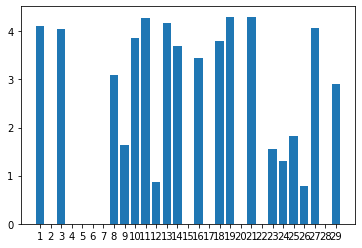

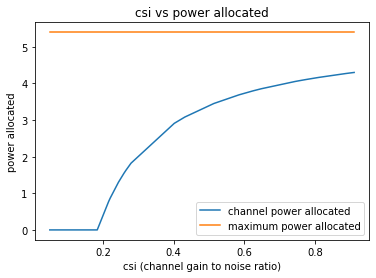

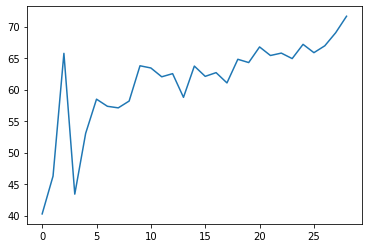

29
Power Allocated= 0
CSI= 0.15678127540913456
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.603695514417288
CSI= 0.7133930078771167
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9990666899338687
CSI= 0.49840989337587394
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8326073857782124
CSI= 0.8526312034439018
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9049484175995501
CSI= 0.47607735321155065
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9175572991953826
CSI= 0.9192104896157677
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6193174877783543
CSI= 0.72143309589384

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0499694913471522
CSI= 0.5113839390568287
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9002931650342605
CSI= 0.4750245750948313
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03513965270346453
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.383272798549484
CSI= 0.6164564491890864
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3295066291816182
CSI= 0.3737003478319444
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.701174494156702
CSI= 0.7667107006679585
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averagin

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.9159052549084175
CSI= 0.9178167147784052
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.846036645688646
CSI= 0.8625070873034464
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5221965906033068
CSI= 0.40269794448579155
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 1.406577
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.723590

Power Allocated= 1.8841340354629486
CSI= 0.47140606980647215
SNR= 15.719034446696819
Client: client20
Model client20 Train Epoch: 1 [0/384 (0%)]	Loss: 1.388559
Model client20 Train Epoch: 2 [0/384 (0%)]	Loss: 1.473384

Power Allocated= 2.8208408625772545
CSI= 0.8441621426642559
SNR= 15.73789526637954
Client: client21
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.594389982729912
CSI= 0.7086883791928213
SNR= 15.81461727893922

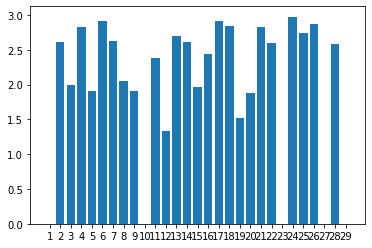

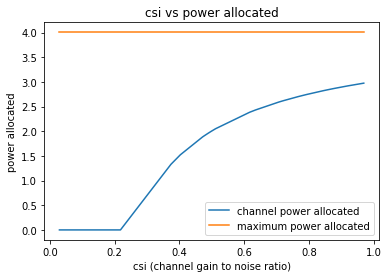

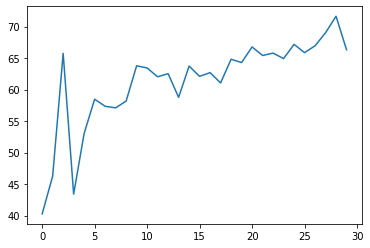

30
Power Allocated= 0
CSI= 0.08047131055569468
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.248102460053965
CSI= 0.6663616512881657
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11373374279422788
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3942084423446404
CSI= 0.42470408233867163
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5492594251987883
CSI= 0.833660104757776
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.842381


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.848089

Power Allocated= 3.2644131556507743
CSI= 0.6736838006362924
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.381281474667028
CSI= 0.7312573704233425
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 1.438182
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 1.198230

Power Allocated= 0
CSI= 0.044726732782737755
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.890550530398327
CSI= 0.5381440459451253
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 2.028870
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.840180

Power Allocated= 0
CSI= 0.17779496080512835
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6232890431320168
CSI= 0.3199488065877889
SNR= 7.02

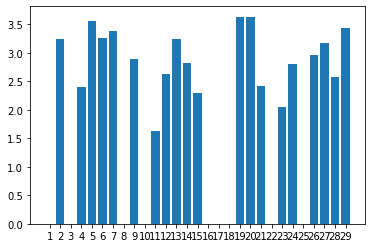

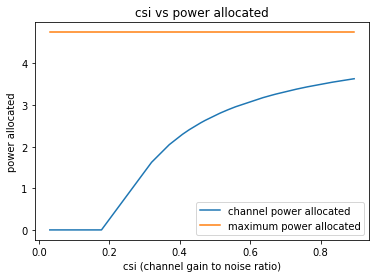

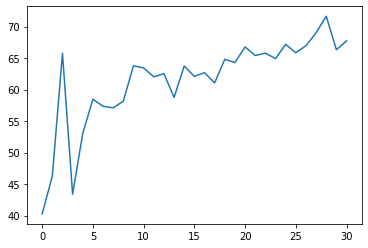

31
Power Allocated= 3.176593000579409
CSI= 0.9504850381181278
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15737290835862872
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0010266183798439688
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.783350428399352
CSI= 0.4089415918153839
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9891373254433997
CSI= 0.8067443244778189
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09197371788916953
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.48619862217297
CSI= 0.5738917827601686
SNR= 5.763716831196649
Client: c

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)


Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9496811274820787
CSI= 0.7818569849308633
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 1.257764
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 1.470364

Power Allocated= 2.2535113215029323
CSI= 0.5062839728955293
SNR= 5.808528005279032


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 4.084098
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.725128

Power Allocated= 1.089748774213069
CSI= 0.31857902122398973
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11503096262915646
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9634475530455653
CSI= 0.44145435395474464
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.82350372672657
CSI= 0.7116507315317979
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.580849545055818
CSI= 0.6068558187553523
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9728490761143318
CSI= 0.44329417696873685
SNR= 8.858041469455715
Cl

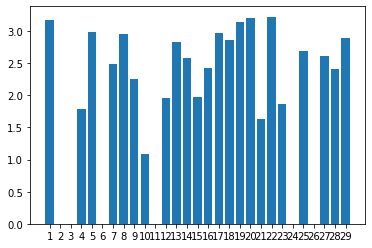

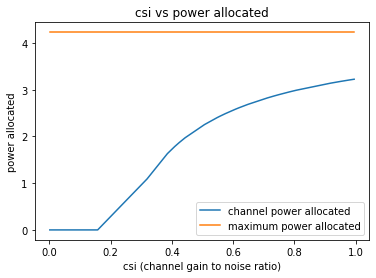

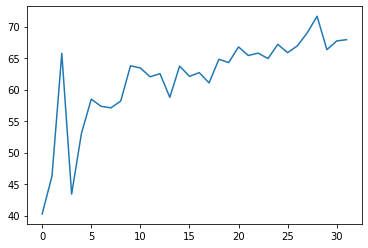

32
Power Allocated= 0.7227063579302957
CSI= 0.3061433958673615
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.651589657168449
CSI= 0.7476300932610599
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 1.003617
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.871837


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 1.8488479403047462
CSI= 0.4672238775161124
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.895174
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 1.101292

Power Allocated= 2.823775852446894
CSI= 0.8580938745836758
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.438647229888535
CSI= 0.6449522910628275
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.571345870489738
CSI= 0.7053162862529987
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4355466241582526
CSI= 0.6436651263804153
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0745612001845126
CSI= 0.5223054967676607
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this 

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.804838588955971
CSI= 0.8443728580257933
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 3.070050
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.604094

Power Allocated= 0.9779116581248295
CSI= 0.3320893426845485
SNR= 15.719034446696819
Client: client20
Model client20 Train Epoch: 1 [0/384 (0%)]	Loss: 0.878254
Model client20 Train Epoch: 2 [0/384 (0%)]	Loss: 0.763939

Power Allocated= 1.539839628590769
CSI= 0.4082782690067085
SNR= 15.73789526637954
Client: client21
Model client21 Train Epoch: 1 [0/384 (0%)]	Loss: 0.915253
Model client21 Train Epoch: 2 [0/384 (0%)]	Loss: 0.807207

Power Allocated= 2.3826915285181682
CSI= 0.622487490776624
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 [0/384 (0%)]	Loss: 3.053755
Model client23 Train Epoch: 2 [0/384 (0%)]	Loss: 0.851872

Power Allocated= 2.9802948087221544
CSI= 0.9912230130248808
SNR= 16.727271644180114
Client: client24
Model client24 Train Epoch: 1 [

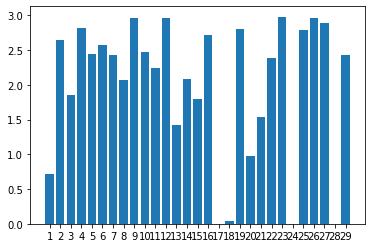

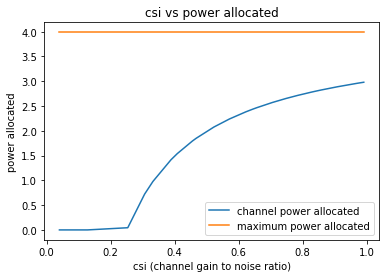

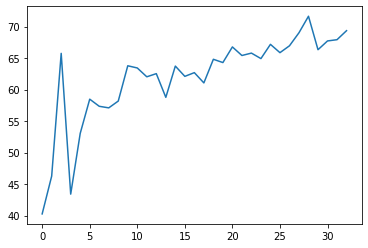

33
Power Allocated= 0
CSI= 0.1153762799439586
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9479058410953534
CSI= 0.45652056106592065
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.662175963859697
CSI= 0.40384268913776156
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.882951399419243
CSI= 0.796535843479716
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.13503114359008
CSI= 0.33296080118768223
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.647220


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 1.198628

Power Allocated= 0
CSI= 0.14855039945706183
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0805254829447435
CSI= 0.9453027046929413
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.246938528145708
CSI= 0.5286951525083029
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.479320411570643
CSI= 0.6027483131772234
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.899773
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.861052

Power Allocated= 2.7202092511206493
CSI= 0.7051298882452794
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4542453414344125
CSI= 0.3725584832379032
SNR= 7.027128190861585
Client: client11
Poor Chan

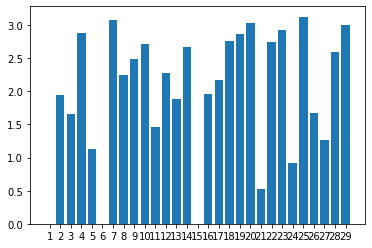

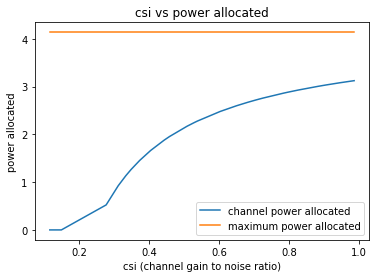

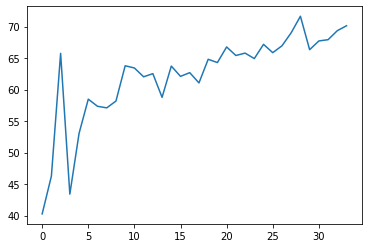

34
Power Allocated= 2.8859586121858936
CSI= 0.6375988040366527
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0503406016844545
CSI= 0.712249503493422
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0483069909173475
CSI= 0.71121934618175
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.756316
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.634927


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.184887704048516
CSI= 0.7877394465719819
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3725246682851187
CSI= 0.9243696331393694
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15969691105907557
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9320908921901463
CSI= 0.6569214160458754
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.206786499723096
CSI= 0.8015669128206248
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8783893911679987
CSI= 0.388205751308336
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4519129203938954
CSI= 0.9975758268795557
SNR=

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08263481900562852
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3554479506415626
CSI= 0.47644116733387176
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1700911832887204
CSI= 0.7786634981759325
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.877953
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.842767

Power Allocated= 3.2982349120998
CSI= 0.864971038565247
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 0.959210
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 5.505641

Power Allocated= 1.340967257899632
CSI= 0.32119476987147466
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.12547278

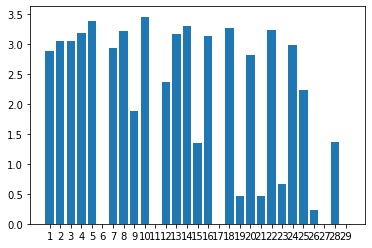

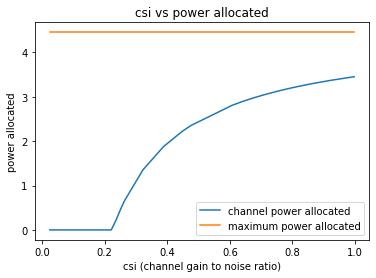

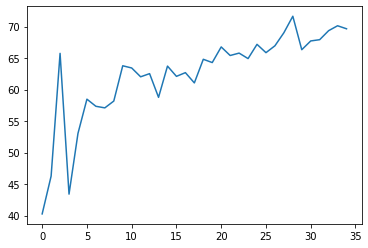

35
Power Allocated= 3.189574514194022
CSI= 0.7750070753687379
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5812434681916914
CSI= 0.5266922783328342
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 1.773873
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.978830


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.6851686631268343
CSI= 0.5571910189788223
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9043346987818692
CSI= 0.6346987457887905
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2427701187698466
CSI= 0.8083321610620781
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.559882
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 1.088032

Power Allocated= 0
CSI= 0.1567793961162789
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.23567272534179473
CSI= 0.23561496482331734
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03826701027013013
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CS

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 0.522888

Power Allocated= 3.317281968168645
CSI= 0.8601385870600051
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4781614734348363
CSI= 0.9982791250142136
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6002376818783017
CSI= 0.34726470993190595
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 1.140439
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.652724

Power Allocated= 3.1163478158481306
CSI= 0.7333865043452734
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12931860399457273
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.054864852189123
CSI= 0.7017443090411171
SNR= 13.12832021207836
Client: client16


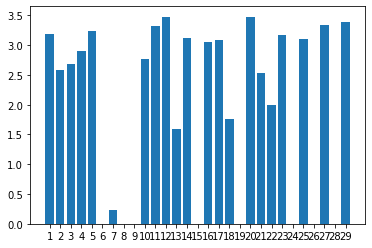

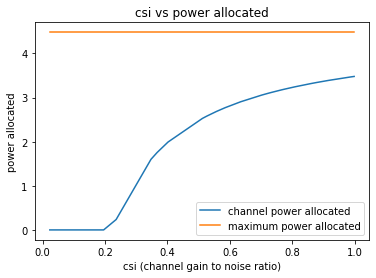

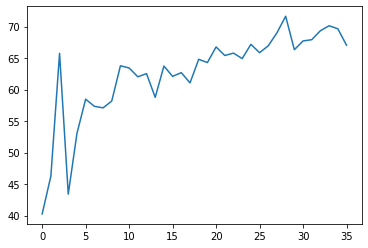

36
Power Allocated= 3.0139573482253317
CSI= 0.8964237825505569
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 2.059134
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.840210

Power Allocated= 0
CSI= 0.040933757060023
SNR= 4.5296012076772785
Client: client2


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Poor Channel, client not taken for averaging in this round

Power Allocated= 2.845596874080605
CSI= 0.7788742617961426
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.468204121947925
CSI= 0.6019393156947471
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.21125274681882
CSI= 0.5213089165500233
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19091182271969465
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5461864662722
CSI= 0.631586384136438
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0903577348932725
CSI= 0.32904008181029876
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 19.624069
Model clien

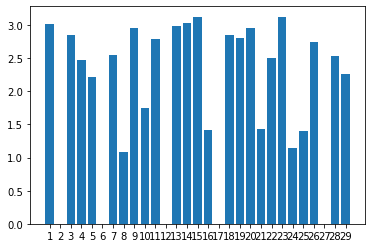

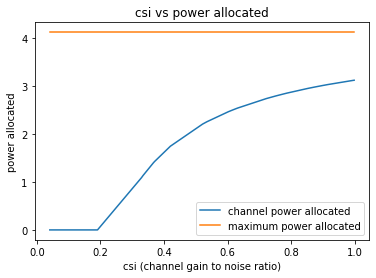

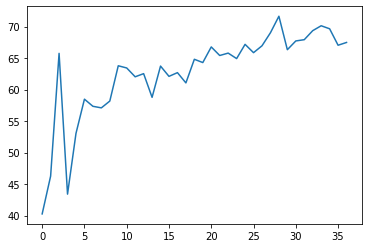

37
Power Allocated= 2.7261219671840973
CSI= 0.6221286018263342
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7108941896142036
CSI= 0.2760438783945086
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 13.785056
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 3.318250


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.132883668853302
CSI= 0.8329009156461932
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3296931862187114
CSI= 0.9962010000563504
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 1.180722
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 2.058182

Power Allocated= 3.111119366773291
CSI= 0.8180713219244703
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2550611473688003
CSI= 0.9272605576046119
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.278103
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 1.250885

Power Allocated= 2.211462334924291
CSI= 0.4712436878787034
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1236639969683817
CSI= 0.8265537489416074
SNR= 5.793773047542457
Client: client

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client23 Train Epoch: 2 [0/384 (0%)]	Loss: 0.900864

Power Allocated= 2.8251736369461993
CSI= 0.6629835558186833
SNR= 16.727271644180114
Client: client24
Model client24 Train Epoch: 1 [0/384 (0%)]	Loss: 1.143425
Model client24 Train Epoch: 2 [0/384 (0%)]	Loss: 0.523818

Power Allocated= 0
CSI= 0.21375235313441376
SNR= 19.824374113130002
Client: client25
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.408626176696624
CSI= 0.34189431023198225
SNR= 20.183965356389123
Client: client26
Model client26 Train Epoch: 1 [0/384 (0%)]	Loss: 1.665506
Model client26 Train Epoch: 2 [0/384 (0%)]	Loss: 0.279453

Power Allocated= 0
CSI= 0.03494408026748508
SNR= 20.470751680587888
Client: client27
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3006583650464387
CSI= 0.9681963863597249
SNR= 21.514122884478798
Client: client28
Model client28 Train Epoch: 1 [0/384 (0%)]	Loss: 1.667284
Model client28 Train Epoch: 2 [0/384 (0%)]	Loss: 0.55013

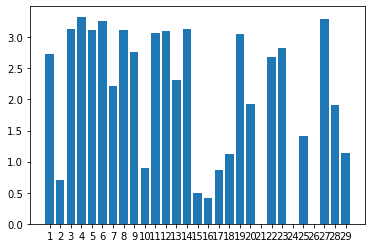

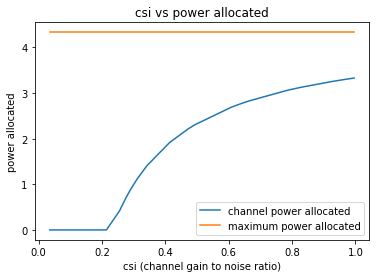

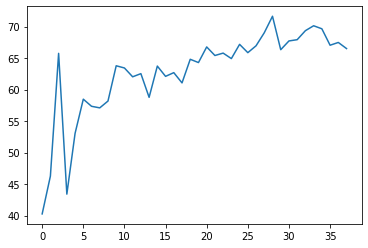

38
Power Allocated= 1.3515059037018755
CSI= 0.3134162273763569
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.303935410768897
CSI= 0.8076136960516378
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.92690321500581
CSI= 0.6190999972302296
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.955605986731083
CSI= 0.6303003627563759
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5644651930820492
CSI= 0.5056414493081132
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8124143244909723
CSI= 0.26811543102214286
SNR= 5.481605188045396
Client: client6


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.900703
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.734105

Power Allocated= 2.5687298445756417
CSI= 0.5067341630343255
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 1.428236
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.711812

Power Allocated= 0.12440835655913407
CSI= 0.22635994078001442
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 53.391396
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 9.690848

Power Allocated= 3.521083710807014
CSI= 0.9793672279503791
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0374854532069403
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7920959051123893
CSI= 0.5714105286746292
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this 

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.760482

Power Allocated= 0.4515186210336237
CSI= 0.24446097022695867
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 5.697851
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 2.818947

Power Allocated= 1.8224417931236743
CSI= 0.367686345884188
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.166081914895373
CSI= 0.7267076141184026
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15848623366593206
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0565951276025505
CSI= 0.6731486233523906
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 0.800821
Model client17 Train Epoch: 2 [0/384 (0%)]	Loss: 0.873429

Power Allocated= 3.365954827270185
CSI= 0.

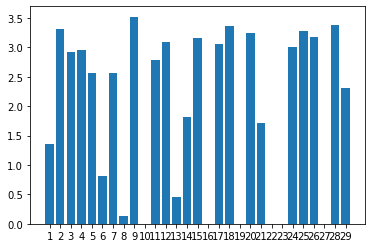

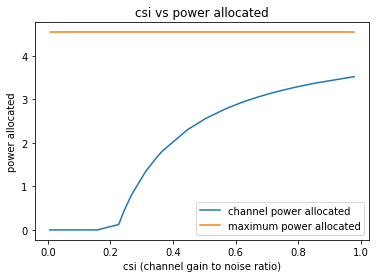

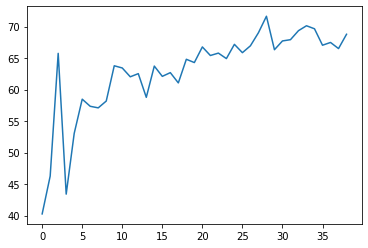

39
Power Allocated= 1.3039460873262785
CSI= 0.3037217688451047
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.741829
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 1.687506

Power Allocated= 0.04074780221510199
CSI= 0.21950594032254378
SNR= 4.5296012076772785


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 152.279846
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 52.038857

Power Allocated= 2.981303651027082
CSI= 0.6191453933425555
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 1.123044
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.484621

Power Allocated= 3.439717538259718
CSI= 0.864516718204743
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0083540936190376
CSI= 0.6296915665088187
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.519731756599458
CSI= 0.9287625980050385
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.360434548112666
CSI= 0.8090623921592314
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.42

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.8054383388715216
CSI= 0.5583489040912527
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.389986298266986
CSI= 0.8288802641889959
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 1.085655
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 2.050066

Power Allocated= 0.46957820365556024
CSI= 0.24231527608149495
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.241495958751039
CSI= 0.42463977219055926
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05879397033231504
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3311185302714263
CSI= 0.7903172620401498
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this r

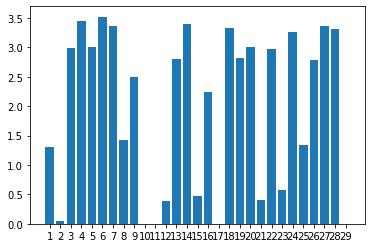

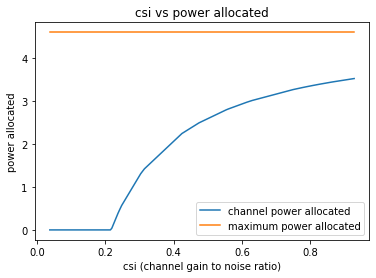

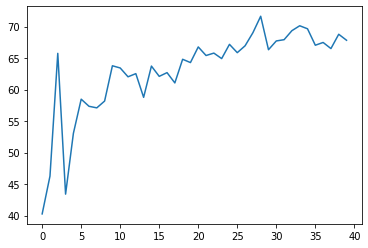

40
Power Allocated= 2.045519895351589
CSI= 0.43107771306210196
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.462743405699216
CSI= 0.525612069549103
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2244765428895077
CSI= 0.8765696238002576
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19608574549072189
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.030616745712168436
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.08354120418019
CSI= 0.7801857585295584
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 0
CSI= 0.10481336057057056
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3117486496427677
CSI= 0.2466980340066771
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1699167433395488
CSI= 0.8365607200639258
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04186567380747075
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.49521784197541
CSI= 0.5347395146129166
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.250884603855205
CSI= 0.8973417427816258
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0647473426941666
SNR= 7.5725046557150355
Client: cl

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1484361610693727
CSI= 0.4510902926017052
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 1.056170
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 0.534863

Power Allocated= 3.2140556427768527
CSI= 0.8686349523180197
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.336953244496587
CSI= 0.9724467034632601
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.846044355195037
CSI= 0.6582226006783168
SNR= 14.92795654834405
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.601866587261304
CSI= 0.5670796702826727
SNR= 15.719034446696819
Client: client20
Model client20 Train Epoch: 1 [0/384 (0%)]	Loss: 0.896303
Model client20 Train Epoch: 2 [0/384 (0%)]	Loss: 0.589276

Power All

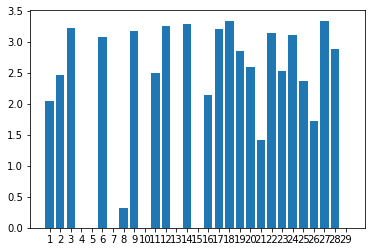

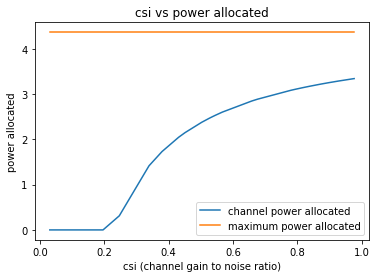

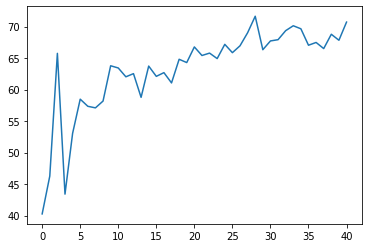

41
Power Allocated= 0
CSI= 0.09903909520932397
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.446518050468693
CSI= 0.4461746230562671
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2524589534587798
CSI= 0.6967019359873985
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5495409966079707
CSI= 0.8785400846090973
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0236152157010654
CSI= 0.37535032787588873
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.468810966208257
CSI= 0.8203566442264547
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.049071


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 1.006976

Power Allocated= 3.5967227810058207
CSI= 0.9165313051802497
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.48891318937560246
CSI= 0.23815875856960533
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 9.848855
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 3.135580

Power Allocated= 0
CSI= 0.07362122451971576
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0023946608834864
CSI= 0.5933315492649022
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.24187392301910737
CSI= 0.22492537214355846
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.161207
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 1.212952

Power Allocated= 2.9087776432904646
CSI= 0.56

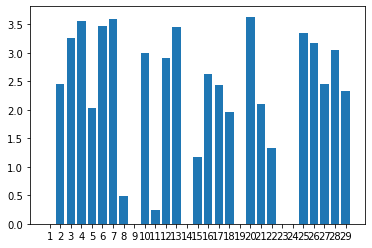

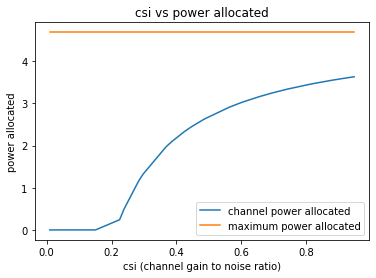

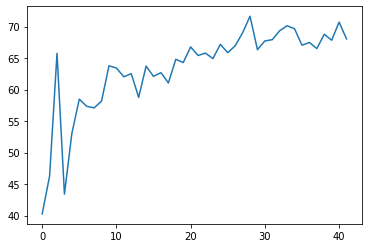

42
Power Allocated= 0
CSI= 0.18576618311367687
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09427627256843885
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.664037154977763
CSI= 0.5541279261830747
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.831868
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.539557


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 0
CSI= 0.11917310979876783
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.364733739468906
CSI= 0.905845633402704
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4426589584485146
CSI= 0.9746440192139048
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.871896242524697
CSI= 0.6262609966385034
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3506038026439606
CSI= 0.3207111280785948
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 7.382336
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 2.057735

Power Allocated= 3.420407105122593
CSI= 0.9539549908406096
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.975845
Model client9

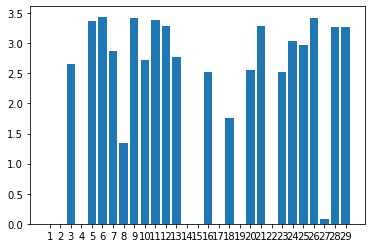

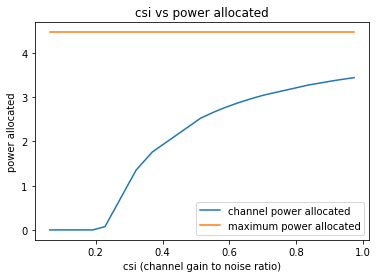

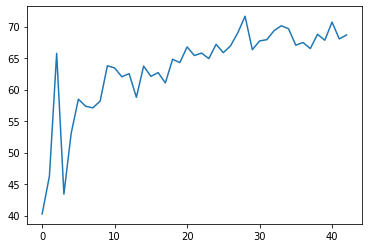

43
Power Allocated= 2.9189958841764216
CSI= 0.7364864507861526
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5171590784832643
CSI= 0.3623667574587981
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8495074040839357
CSI= 0.7006300782173442
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0165027551772488
CSI= 0.7934673138091725
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.783178


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.743382

Power Allocated= 0
CSI= 0.03872905697188489
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.969605293614538
CSI= 0.7650004219278275
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.973224
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.655573

Power Allocated= 2.864064754555522
CSI= 0.7078496617300596
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8526881129262862
CSI= 0.2920470334025592
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 1.440395
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.619236

Power Allocated= 1.348077317964429
CSI= 0.3414464658949651
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.09799441979416823
CSI= 0.239303166676

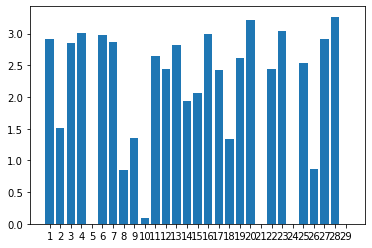

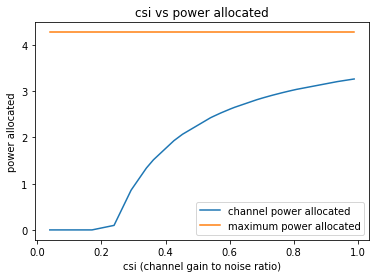

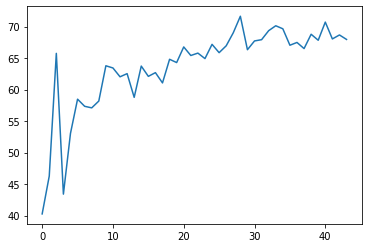

44
Power Allocated= 3.339018171649199
CSI= 0.9177007852412348
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9623229819280184
CSI= 0.6819538065262071
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5927899355866884
CSI= 0.5446895951090933
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.851528
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.525228


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_


Power Allocated= 0
CSI= 0.07850311221210737
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.246778583565063
CSI= 0.8460813974028023
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3636462233379363
CSI= 0.9389215217898133
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.540073
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.658121

Power Allocated= 0
CSI= 0.06795522317528657
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1984027277900102
CSI= 0.8128130318186648
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.737185015836542
CSI= 0.5911867253487753
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 

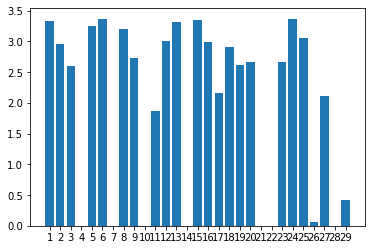

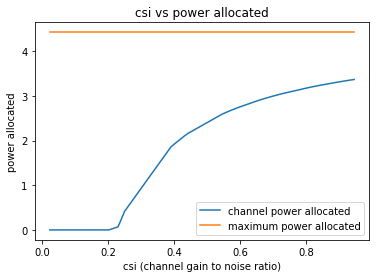

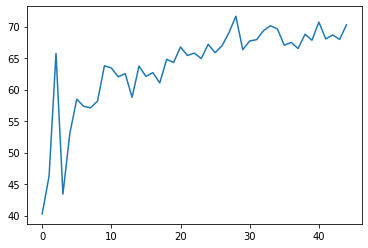

45
Power Allocated= 2.761623466152083
CSI= 0.8278895008565792
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8926110353668237
CSI= 0.9285886572504447
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9444997125440575
CSI= 0.49382364424349146
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.633317828222956
CSI= 0.7483930299532837
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6429255381557382
CSI= 0.4298138497168329
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5064783619790254
CSI= 0.6835102878909142
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.870410464007916
CSI= 0.9

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.684764
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.804361

Power Allocated= 1.1194142848429145
CSI= 0.3508649008150262
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.340694033610226
CSI= 0.6139413439909708
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.21254179118738759
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8886383455741207
CSI= 0.9251756890551972
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1554262190497147
CSI= 0.5512412012411353
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0947465184458256
CSI= 0.53339944271093
SNR= 14.92795654834405


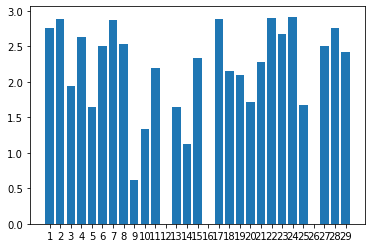

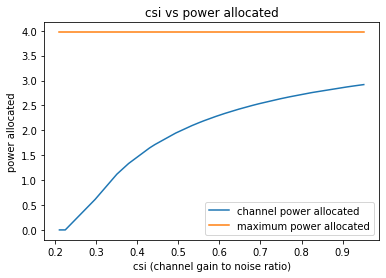

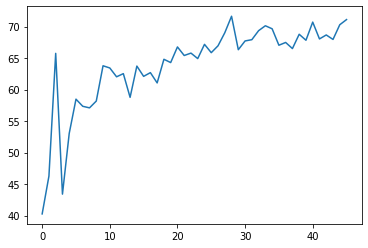

46
Power Allocated= 2.7155635864054477
CSI= 0.608970880617468
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4142973299439845
CSI= 0.33974535891944047
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07692361777878864
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3395771065269546
CSI= 0.9822207027251265
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3203634725981437
CSI= 0.4908421719511268
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1567494714829705
CSI= 0.8326888616059435
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 3.087853365307229
CSI= 0.7875101744821782
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 3.168082
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 1.352860

Power Allocated= 0
CSI= 0.1941778261295114
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11277405344000702
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8332052618685468
CSI= 0.3961222849300112
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 1.122801
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 7.373049

Power Allocated= 2.9816979535425436
CSI= 0.7267546038321471
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.943192
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.561715

Power Allocated= 0
CSI= 0.0909971211553916
SNR= 7.179421131547728
C

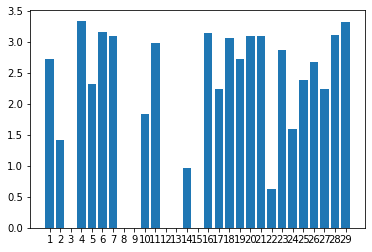

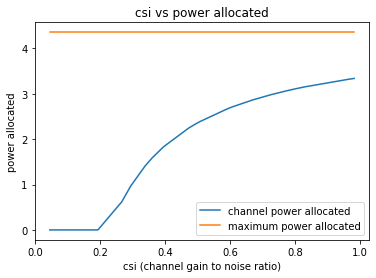

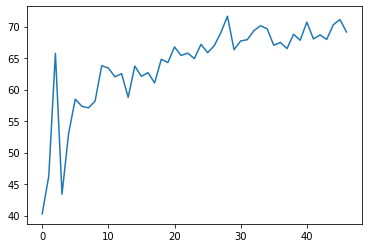

47
Power Allocated= 3.437950865195475
CSI= 0.7069467951515681
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1024789399656845
CSI= 0.26666627327458403
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5984832232594943
CSI= 0.7974473717346791
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.758652
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.536518


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 1.7150514328483317
CSI= 0.31873190200561263
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2940415422209472
CSI= 0.39086273465041255
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 2.876831
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.990524

Power Allocated= 0.7666157532308295
CSI= 0.24474599376971695
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 8.696723
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 1.961107

Power Allocated= 3.6171322743355376
CSI= 0.8094857497724973
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1746877197669843
CSI= 0.5960197494954457
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.350749117019618
CSI= 0.665896289016758
SNR= 5.808528005279032
Client: cl

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 1.067643
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.830182

Power Allocated= 2.729827855480081
CSI= 0.4711077581714249
SNR= 15.719034446696819
Client: client20
Model client20 Train Epoch: 1 [0/384 (0%)]	Loss: 2.687190
Model client20 Train Epoch: 2 [0/384 (0%)]	Loss: 0.763473

Power Allocated= 0
CSI= 0.09963044705213697
SNR= 15.73789526637954
Client: client21
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5407869006480217
CSI= 0.30195994001247417
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 [0/384 (0%)]	Loss: 1.024897
Model client23 Train Epoch: 2 [0/384 (0%)]	Loss: 0.637216

Power Allocated= 1.4611061243133658
CSI= 0.29486536076618697
SNR= 16.727271644180114
Client: client24
Model client24 Train Epoch: 1 [0/384 (0%)]	Loss: 6.565300
Model client24 Train Epoch: 2 [0/384 (0%)]	Loss: 0.809810

Power Allocated= 0
CSI= 0.019669151472666346
SNR= 19.82437411313000

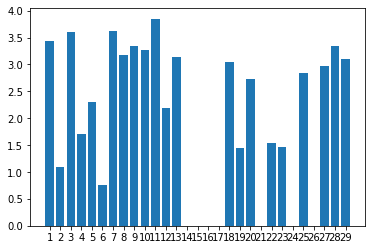

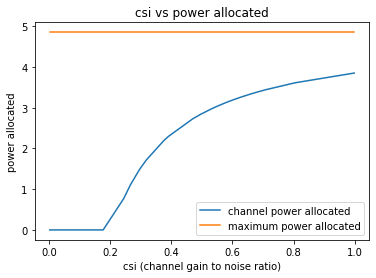

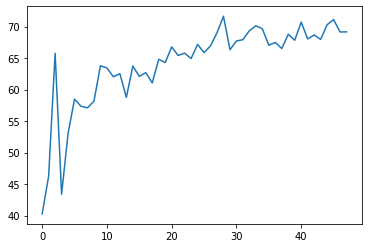

48
Power Allocated= 2.6413694812418838
CSI= 0.5887438409991678
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2652492751167768
CSI= 0.32524008347402555
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8396662673655086
CSI= 0.6665623350453074
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3293844181297843
CSI= 0.4973845945965695
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2000520427906523
CSI= 0.31848665258177433
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0249033621712735
CSI= 0.7604576107324678
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5123569258647733
CSI=

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 1.640335

Power Allocated= 3.072500865821157
CSI= 0.7890167701415747
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09731021819131025
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.295863110430707
CSI= 0.24727760097203266
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 2.964870
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 1.085439

Power Allocated= 2.8641952735965246
CSI= 0.677641855047386
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19251729918251503
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.715108460082093
CSI= 0.6154631711439966
SNR= 13.12832021207836
Client: client16
Model client16 Tra

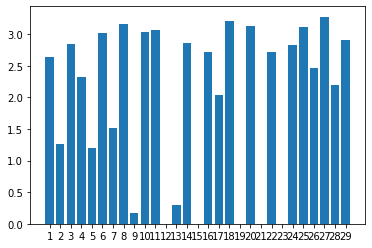

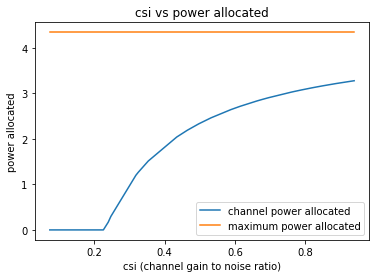

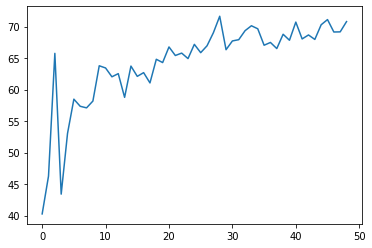

49
Power Allocated= 0
CSI= 0.07678792943274815
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1892749076734126
CSI= 0.6077623783002675
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4511041706411607
CSI= 0.7227780282834647
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6010399698096567
CSI= 0.810625789305676
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08085757894115708
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18847725997399167
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.892991861890276
CSI= 0.33994377300169454
SNR= 5.763716831196649
Client: 

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.963662
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.984235

Power Allocated= 2.339918684296279
CSI= 0.40084399766436696
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.816907
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.911439

Power Allocated= 0.9226600568171675
CSI= 0.2556240650116087
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14995886025870564
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6399748813869564
CSI= 0.4556473082684567
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.986406
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 1.130886

Power Allocated= 3.6266076031289063
CSI= 0.8277822240020108
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in thi

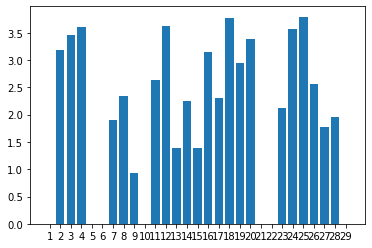

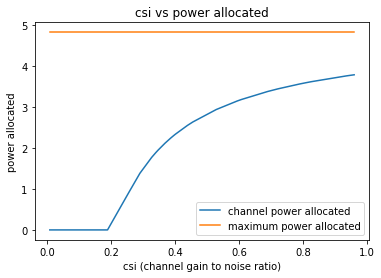

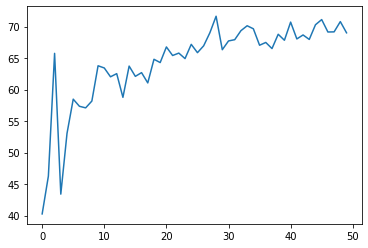

50
Power Allocated= 0
CSI= 0.14085384650078314
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2992684106744425
CSI= 0.41012653964219636
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2448211260526496
CSI= 0.28630988036719796
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2492318988890934
CSI= 0.6719037667329927
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3585546833106035
CSI= 0.7251707416745002
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16029173383892403
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20348938668479
SNR= 5.763716831196649
Client: 

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.233612907181146
CSI= 0.39937260769282235
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6821234691502163
CSI= 0.24658377901235673
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 8.755478
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 3.951074


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0.9111052049366504
CSI= 0.26133985896362655
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.002091641968957
CSI= 0.5762198801916684
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.036809
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.465485

Power Allocated= 2.4689511446984826
CSI= 0.4408026068920964
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.041980571177758885
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.508347212881427
CSI= 0.813541855729597
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.71110018130509
CSI= 0.9742409828862648
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round



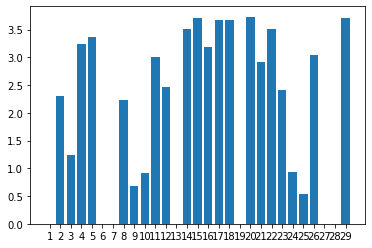

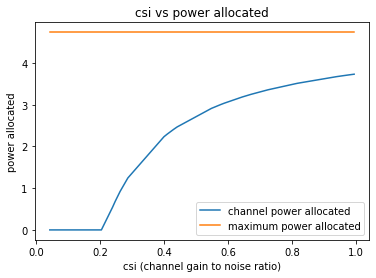

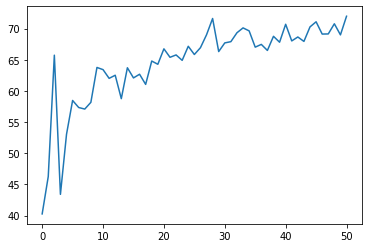

51
Power Allocated= 0.6960036916034964
CSI= 0.25183921814886656
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 7.872273
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 2.510422

Power Allocated= 3.184352079596784
CSI= 0.6745639965642511
SNR= 4.5296012076772785
Client: client2


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6036618653453036
CSI= 0.9406194033894525
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.341224590220704
CSI= 0.7543944281456874
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0336702581174486
CSI= 0.2752454541286389
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.774304
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.589880

Power Allocated= 2.978949324884806
CSI= 0.5924725920368471
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.557963817894851
CSI= 0.4741972003316649
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.0899479265127967
CSI= 0.21849120866538907
SNR= 5.793773047542457
Client: c

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.712829827760258
CSI= 0.5117808662956269
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 0.910610
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 0.537919

Power Allocated= 1.3239327326613015
CSI= 0.2991451882777272
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 0.864581
Model client17 Train Epoch: 2 [0/384 (0%)]	Loss: 0.613540

Power Allocated= 2.918110357449403
CSI= 0.5718596696441198
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1747261936567748
CSI= 0.6702121242028265
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 0.872734
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.594543

Power Allocated= 0
CSI= 0.17602711042669827
SNR= 15.719034446696819
Client: client20
Poor Channel, client not ta

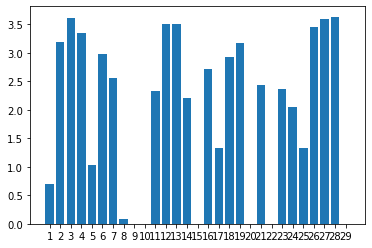

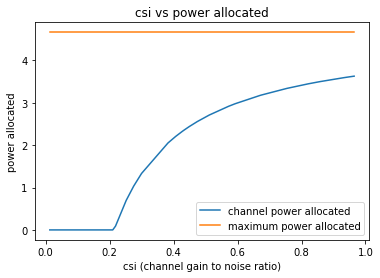

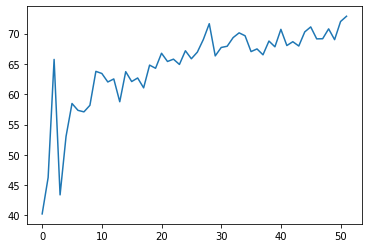

52
Power Allocated= 2.749418083894187
CSI= 0.5378363534951761
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 1.463123
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.786528

Power Allocated= 2.8455334342016503
CSI= 0.5671550537342751
SNR= 4.5296012076772785
Client: client2


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 0.905112
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 4.249039

Power Allocated= 0.9641347828155538
CSI= 0.27437966829218075
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5475154065431305
CSI= 0.9423256279332071
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.948903336192141
CSI= 0.6024762878651287
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.871525
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.639244

Power Allocated= 0
CSI= 0.03890096560907119
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 0
CSI= 0.05721373082868486
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3743813488087144
CSI= 0.4475597890133223
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 1.175887
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 1.430688

Power Allocated= 3.3101184263641406
CSI= 0.7700593108119093
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.412376531369695
CSI= 0.2383027222442432
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 9.226876
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 2.599885

Power Allocated= 3.0935478387917947
CSI= 0.6599911383923497
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.178325
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.566187

Power Allocated= 1.3636860065627667
CSI= 0.3081632

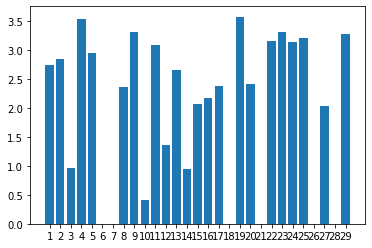

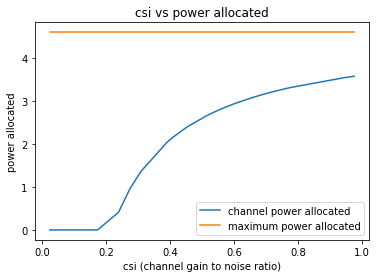

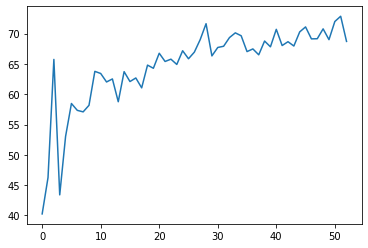

53
Power Allocated= 3.3158215784937832
CSI= 0.7279450306384909
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.790250
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 1.133246

Power Allocated= 3.4006443957423738
CSI= 0.7758509964978213
SNR= 4.5296012076772785


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4026388147996087
CSI= 0.30423684513641847
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 5.502972
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 1.673172

Power Allocated= 0
CSI= 0.04563166033536403
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6333037325951816
CSI= 0.9467474029525046
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.891229
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.878810

Power Allocated= 3.5178443625926903
CSI= 0.8534554543755904
SNR= 5.481605188045396


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.073964
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 1.677060

Power Allocated= 3.4935866988364936
CSI= 0.8361448844266857
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.433426255395026
CSI= 0.7960988459589097
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1356162687710043
CSI= 0.39155258040187035
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6114723859894684
CSI= 0.4812135915269764
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2311372307499302
CSI= 0.289149844532518
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.837497
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.595292

Power Allocated=

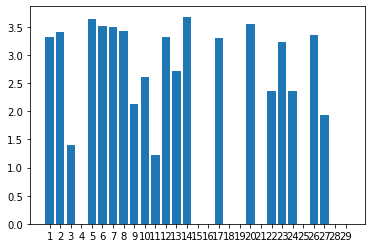

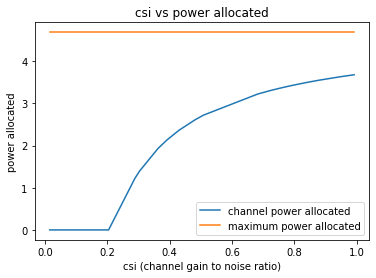

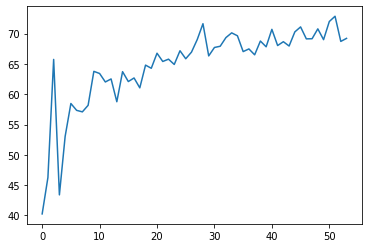

54
Power Allocated= 2.838805358655145
CSI= 0.7345037384002318
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3287896168123616
CSI= 0.5343366892831766
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1629439872228726
CSI= 0.9640181851401959
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8407409824878798
CSI= 0.42381360596239404
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2584644991527147
CSI= 0.5149849501844594
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0527165273162726
CSI= 0.8714199856611117
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.119801
Model client6 Train Epoch: 2 [0/384 (0%)]	Los

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 1.626646
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.870077

Power Allocated= 3.2002459054158727
CSI= 0.9999770887360522
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15607034030255196
SNR= 5.808528005279032
Client: client9


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9556549033081527
CSI= 0.8034620124639498
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.002592331819086
CSI= 0.8349500154693131
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9505110471269851
CSI= 0.30771524241207304
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8403575284099016
CSI= 0.7353420831488152
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 1.281117
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 1.166237

Power Allocated= 0
CSI= 0.015091811036463842
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.85704124822586
CSI= 0.426761793535814
SNR= 8.858041469455715
Client: client15


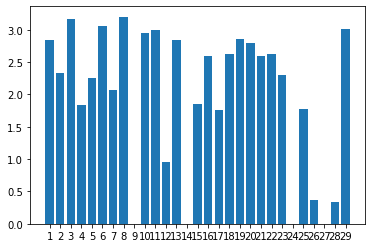

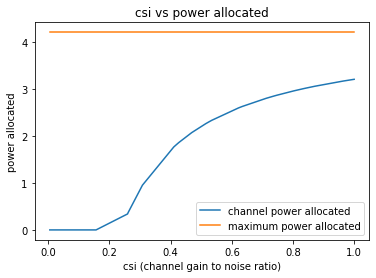

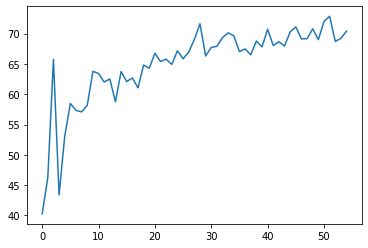

55
Power Allocated= 2.4684147589215284
CSI= 0.5014348214357757
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10870746502588158
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3484119944209034
CSI= 0.897440579162818
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.886158658748892
CSI= 0.6343031510715151
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.811054
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.964238


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 3.2053729766333934
CSI= 0.7953431582029079
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.332320
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.972715

Power Allocated= 3.227037408536866
CSI= 0.8092877178424026
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2341093580765454
CSI= 0.8139461284319697
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1660116028832683
CSI= 0.30333544995648776
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 1.068866
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 1.768139

Power Allocated= 0
CSI= 0.12095766506920835
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4232501728763016
CSI= 0.9620548973476762
SNR= 6.445983530041328
Client: client10
Poor Chann

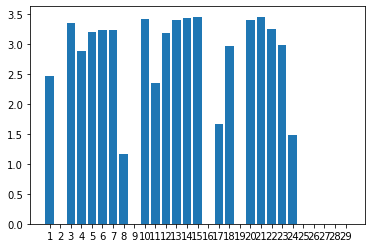

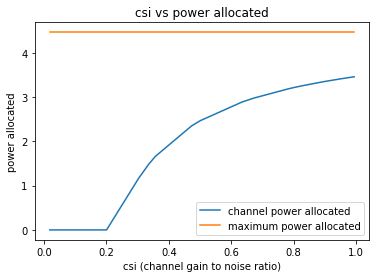

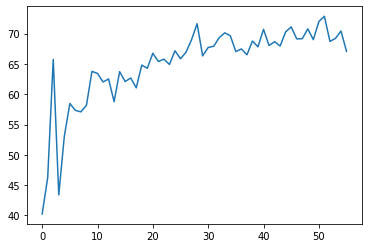

56
Power Allocated= 2.347844793760526
CSI= 0.39865890148976946
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 5.511762
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 1.676407

Power Allocated= 0
CSI= 0.10656916829983887
SNR= 4.5296012076772785
Client: client2


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07897176821447072
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1480998069004813
CSI= 0.5854269496072858
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06497722199033307
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9210604894328602
CSI= 0.5167439597512111
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.694495800884714
CSI= 0.8607636801945322
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 2.278786
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 1.413754

Power Allocated= 0
CSI= 0.19571758962417152
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for avera

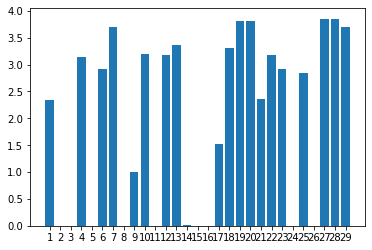

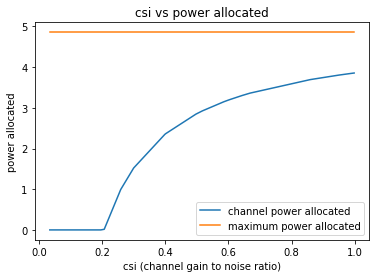

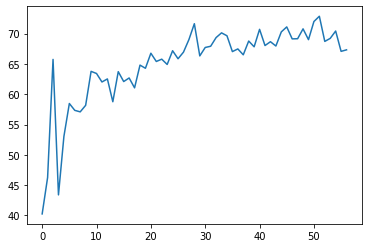

57
Power Allocated= 2.717416988319627
CSI= 0.5512584157997608
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4559884698852117
CSI= 0.9298348647611309
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 1.824285
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 2.539116


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0.2735518944377615
CSI= 0.23485775986335744
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 16.398306
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 3.243229

Power Allocated= 0
CSI= 0.2010218810571507
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.165250883179199
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3636446861417975
CSI= 0.31567613949841766
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18841464434940347
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.041975780227307524
SNR= 5.793773047542457
Client: client8


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Poor Channel, client not taken for averaging in this round

Power Allocated= 3.421716401494413
CSI= 0.9011185905590151
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.030037987017885515
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.281237958056532
CSI= 0.7998654352433049
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.064000
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.800402

Power Allocated= 2.9645311596857185
CSI= 0.6381958596480081
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.060658125314548
CSI= 0.679906658761537
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 1.199479
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.907414

Power Allocated= 3.470915508778416
CSI= 0.942

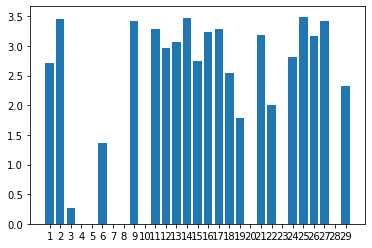

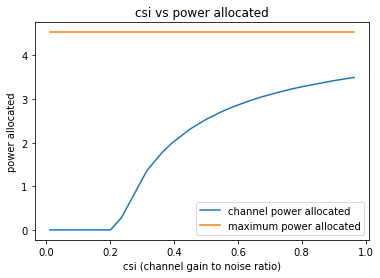

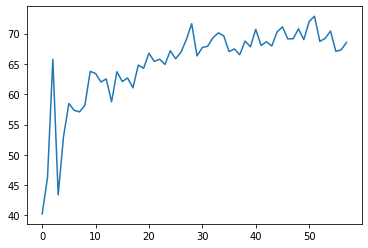

58
Power Allocated= 3.2031238908929245
CSI= 0.8429525734868354
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11724820512155365
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8029953802236305
CSI= 0.3866325848487696
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7372432061285816
CSI= 0.6052583468239086
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.34202187238670856
CSI= 0.24707168296839355
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2594679886815383
CSI= 0.8849853065926007
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 3.301033551218157
CSI= 0.918782645449199
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9348180993291777
CSI= 0.6874684761815789
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 2.031643
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.886210


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.5616579588562205
CSI= 0.5471141037515754
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.229835582262804
CSI= 0.8623702972578735
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04271853262240477
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8624293859545702
CSI= 0.3957260218842904
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9517963948301826
CSI= 0.6955874022060329
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8815884178245943
CSI= 0.6631995328459394
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.04249741835363796
CSI= 0.230047262812

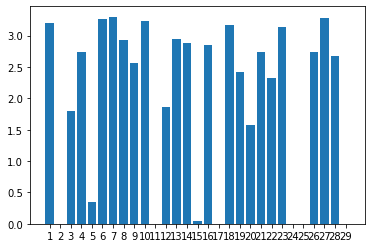

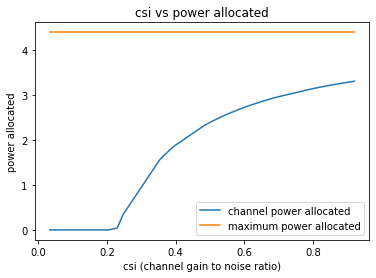

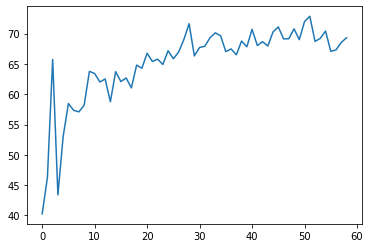

59
Power Allocated= 3.075207420314883
CSI= 0.9037967181304741
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.819126930585588
CSI= 0.7339320341255052
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1761234709472594
CSI= 0.4986219473463235
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4494261047779
CSI= 0.5772922738708117
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.208141744558759
CSI= 0.2516667149637277
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 15.484054


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 3.121973

Power Allocated= 0
CSI= 0.14256153607389888
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12782594188384522
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.132449947017566
CSI= 0.9531062492037303
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.554468940479079
CSI= 0.6145594132542125
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 1.108916
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 1.209332

Power Allocated= 2.6397336939035316
CSI= 0.6485432459089635
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.106030743178923
CSI= 0.9296962119815206
SNR= 7.027128190861585
Client: client11
Poor Channel, client not t

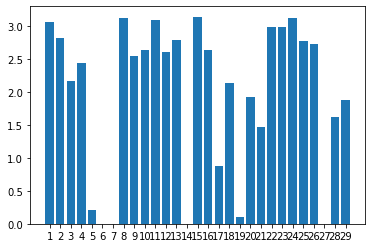

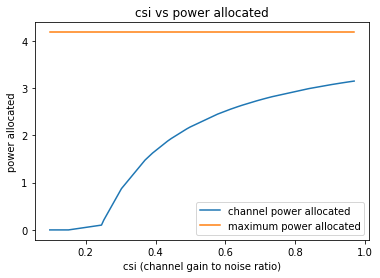

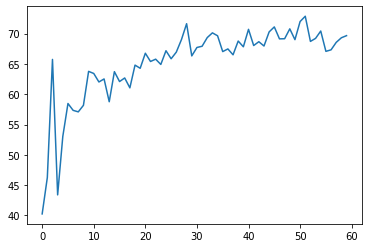

60
Power Allocated= 0.8652066773546174
CSI= 0.2873584261035973
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1918829987704562
CSI= 0.8670784399798855
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.040378173486755
CSI= 0.766399206804074
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2950706126519274
CSI= 0.48777856622495686
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.855066122654355
CSI= 0.6710891119698709
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.236273962849623
CSI= 0.9017886905759482
SNR= 5.481605188045396
Client: client6


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.666673
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.874841

Power Allocated= 3.1137091130253878
CSI= 0.8120362738251642
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2401247142607157
CSI= 0.4750466363245245
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12201586364472727
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12730835368023818
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.592306102020102
CSI= 0.36325658323290133
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7463210179251702
CSI= 0.2778657550055329
SNR= 7.179421131547728
Client: client12
Poor Channel, client

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 0
CSI= 0.1339963583535697
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.080995489630478
CSI= 0.7910230249394008
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2071719338662765
CSI= 0.8787274717194206
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.278170268066122
CSI= 0.93719752595043
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 1.350714
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.336833

Power Allocated= 2.7073136852541984
CSI= 0.6105499954214391
SNR= 15.719034446696819
Client: client20
Model client20 Train Epoch: 1 [0/384 (0%)]	Loss: 0.649319
Model client20 Train Epoch: 2 [0/384 (0%)]	Loss: 0.565586

Power Allocated= 3.2656653407819567
CSI= 0.9263411898648015
SNR= 15.73789526637954
Client: client21
Poo

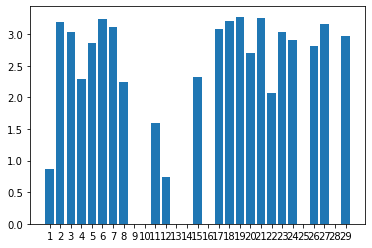

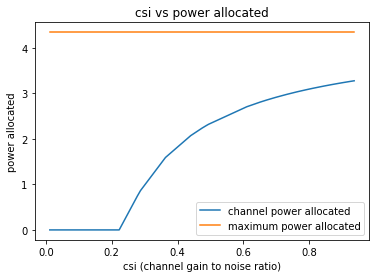

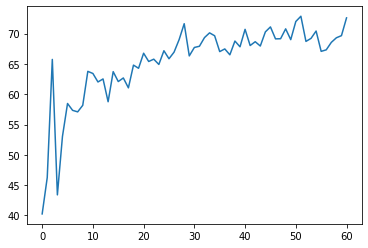

61
Power Allocated= 2.9720469574215187
CSI= 0.7428784517626359
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1540408100043615
CSI= 0.8590169522148444
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7747899830150575
CSI= 0.3931787872753836
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.915088468281536
CSI= 0.7127209243520102
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0267830871889916
CSI= 0.7743659454375776
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9691862560402793
CSI= 0.7413030690154129
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1632068029753104
CSI= 0.

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.770800

Power Allocated= 2.66958523441356
CSI= 0.606583754860119
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6164908537538016
CSI= 0.370141247945304
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2826291150054883
CSI= 0.9656861996792453
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 1.045353
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 2.144255

Power Allocated= 3.2724589292637205
CSI= 0.9562942350692599
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1979506087843087
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9675085283589127
CSI= 0.7403822521440475
SNR= 13.545407086100507
Client: client18
Po

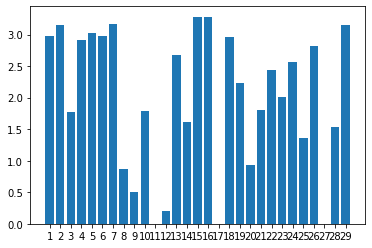

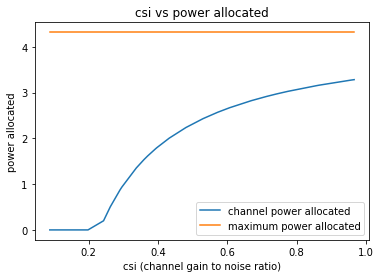

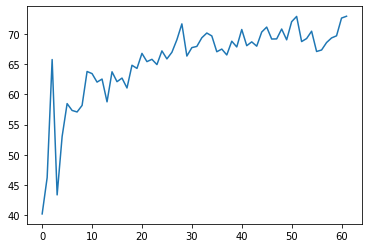

62
Power Allocated= 3.247532951892895
CSI= 0.9830685087741431
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9650219295765012
CSI= 0.7693881230825834
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1506785643446644
CSI= 0.8976036294884785
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1459686286385793
CSI= 0.8938248460652648
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.748759


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.741360

Power Allocated= 0
CSI= 0.019859691537412516
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15431920179179714
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12316115507124681
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06619092543235361
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1270045788171883
CSI= 0.8789265670887041
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 1.6104274265159564
CSI= 0.3767431014040248
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.53559465978205
CSI= 0.578315015714434
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.762190
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.381784

Power Allocated= 2.418619157968718
CSI= 0.541671639352039
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.690988512985069
CSI= 0.6354178572735459
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.048117755062561884
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0189138068176136
CSI= 0.8026698409795946
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 0.961481
Mode

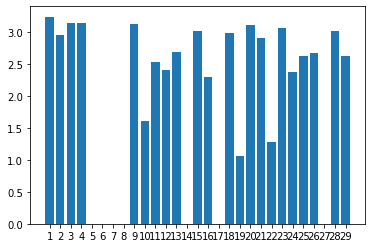

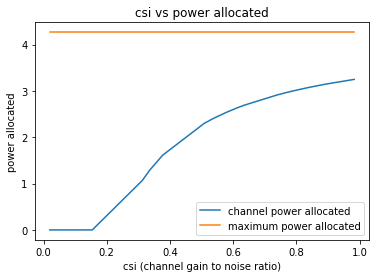

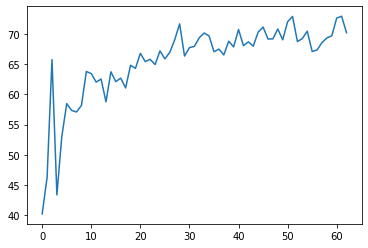

63
Power Allocated= 2.178709047322597
CSI= 0.5871030381705067
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2535084926908797
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10705242457742026
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7034181941638264
CSI= 0.8484863208056803
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4583290512939273
CSI= 0.7024156295165157
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2429265846430002
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8492784231908503
CSI= 0.9683268475849904
SNR= 5.763716831196649


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.395673052666641
CSI= 0.672805104974574
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.938868
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 1.097121



/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Power Allocated= 2.1417797412454416
CSI= 0.5746440046332566
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.736895144189318
CSI= 0.46618037731423745
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.389657584510009
CSI= 0.4012309777422819
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0561248557571643
CSI= 0.5476863008456317
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.754473733031489
CSI= 0.8869070697283793
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6631627740774517
CSI= 0.8204624627567333
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7934024016382213
CSI= 0

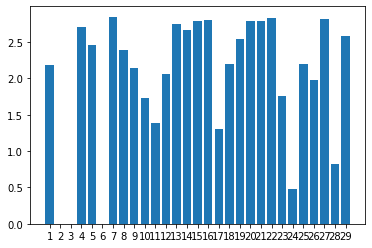

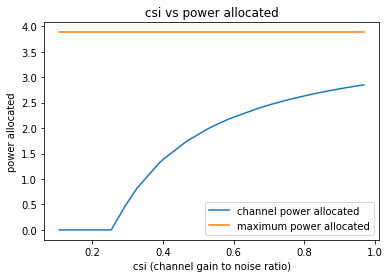

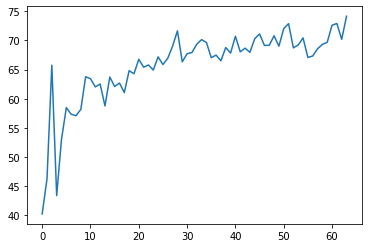

64
Power Allocated= 3.371168546808911
CSI= 0.7497217634313579
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.653555
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 1.242136

Power Allocated= 3.476658681717053
CSI= 0.8141081524969802
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_


Power Allocated= 0
CSI= 0.10241509901164536
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6805403572898512
CSI= 0.3306379344044015
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.311964036975854
CSI= 0.717858254063551
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.634047
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 2.406320

Power Allocated= 0
CSI= 0.12061159444206293
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5629402042530014
CSI= 0.8756134202030892
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.309253315829481
CSI= 0.7164640769086442
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0

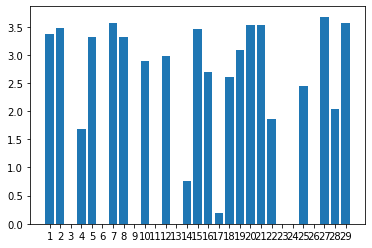

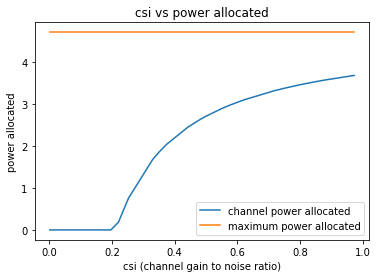

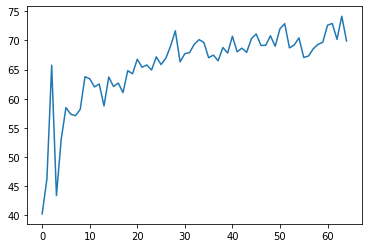

65
Power Allocated= 0.7959376398565747
CSI= 0.27212848497387165
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12962093238232975
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.888664452209216
CSI= 0.6321080802842439
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.607450624671555
CSI= 0.536704765410398
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1017916661435283
CSI= 0.7305238383516487
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.180169


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.732063

Power Allocated= 3.2536061290525486
CSI= 0.8216479519678954
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.880213
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.840271

Power Allocated= 3.3980885694514353
CSI= 0.9323280676579647
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9416811511055205
CSI= 0.395414576755136
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6969376350748524
CSI= 0.5637821538508275
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.193815560002598
CSI= 0.43920196790952515
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.912807
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 0.989726

Power Allocated= 1.9306698016512236

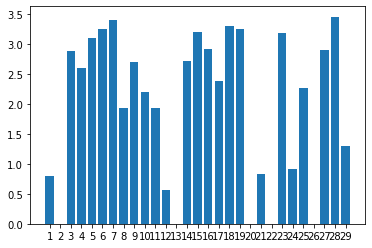

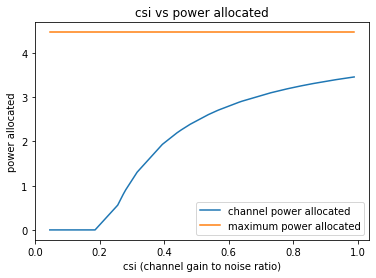

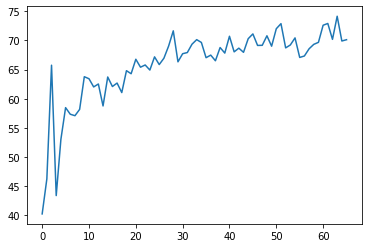

66
Power Allocated= 2.1787746145288147
CSI= 0.41834766834534276
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16977124523262443
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3161609934339795
CSI= 0.23512980573775377
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.725372
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 1.023425


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 0.4195303348272832
CSI= 0.24098704729121811
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 64.753906
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 15.328742

Power Allocated= 1.3542364022477575
CSI= 0.31105219307950227
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9417388401246716
CSI= 0.38060554256408896
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.162948
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.558594

Power Allocated= 3.5161427258023905
CSI= 0.9496782355127018
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.406169433482074
CSI= 0.8598736799837886
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.936646876202961
CSI= 0.6125634027667742
SNR= 5.808528005279032
Client: 

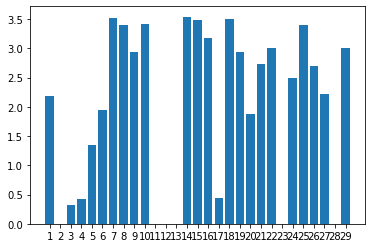

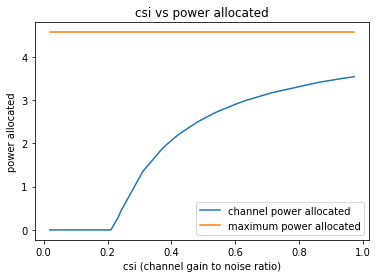

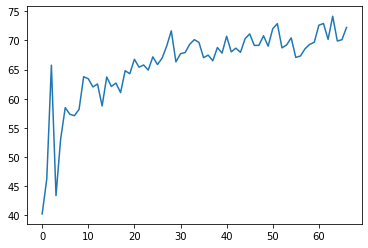

67
Power Allocated= 0.44882164234763966
CSI= 0.24257725962786303
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9386943662396203
CSI= 0.37986340516232986
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7262105578214646
CSI= 0.5420027633392109
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8330039522929882
CSI= 0.3652013311405037
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.666471394442439
CSI= 0.5250037754872197
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1501512516415318
CSI= 0.2923063492939315
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.01552974743507

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 1.708052

Power Allocated= 3.2367483400712285
CSI= 0.7493604613198922
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1631926017210388
CSI= 0.7102136537403637
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.485487736556035
CSI= 0.9210377187860206
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12358062996784469
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.623396774868243
CSI= 0.5133937165043341
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 0.618644
Model client17 Train Epoch: 2 [0/384 (0%)]	Loss: 0.986341

Power Allocated= 0
CSI= 0.18473622384095645
SNR= 13.545407086100507
Client: client18
Poor Channel, c

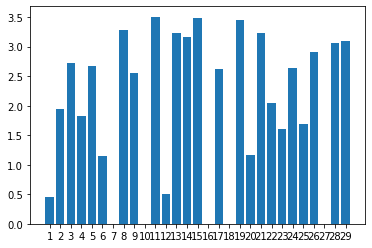

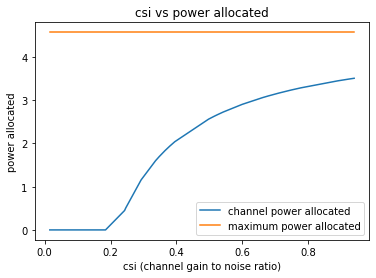

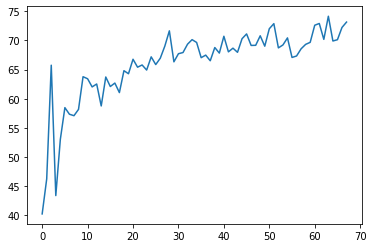

68
Power Allocated= 0
CSI= 0.06169809295592377
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2299851953169325
CSI= 0.7388873197398483
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.047259838161899825
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4296591650635855
CSI= 0.8667671700866694
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.024796805295360214
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1259334993633514
CSI= 0.6861355201972232
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 3.007417


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 1.003182

Power Allocated= 0
CSI= 0.07417707922738004
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5697279089282934
CSI= 0.9865400236235364
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.917081698734596
CSI= 0.2727553048292578
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 12.464840
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 1.928383

Power Allocated= 3.2633113152643176
CSI= 0.7575412017415047
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5506229133070466
CSI= 0.49194474551571743
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.344555
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.555596

Power Allocated= 2.9004022607366133
CSI= 0.59418

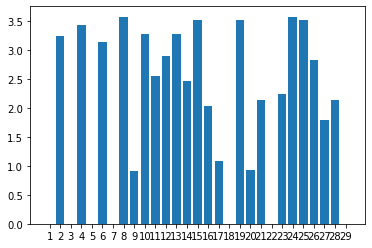

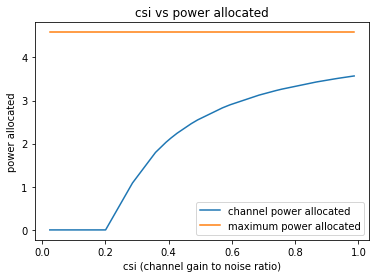

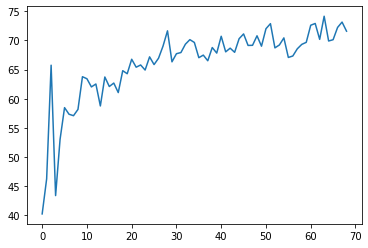

69
Power Allocated= 2.8663286148440834
CSI= 0.8581634412439867
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 1.050123
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.798856

Power Allocated= 2.5803658511309413
CSI= 0.6890649744522911
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.416415684944992
CSI= 0.6191213958165745
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8300034845652267
CSI= 0.8322207092908851
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.914631637674244
CSI= 0.8952742494239779
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7858989104058
CSI= 0.802755767566924
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.846977
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.625266

Power Allocated= 2.858569146483009
CSI= 0.8524868234944188
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7892468217579216
CSI= 0.8049190318540776
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 1.150979


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7199374177272837
CSI= 0.30196241865882056
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 6.280945
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 3.671338

Power Allocated= 2.1264250062542285
CSI= 0.5248840166712189
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8805404705518374
CSI= 0.4648854937712713
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 3.138497
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 0.950611

Power Allocated= 1.7880138589047236
CSI= 0.4457134508025743
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 0.708206
Model client17 Train Epoch: 2 [0/384 (0%)]	Loss: 0.341587

Power Allocated= 2.8954513945081404
CSI= 0.8801605048349302
SNR= 13.545407086100507
Client: client18
Poor Chan

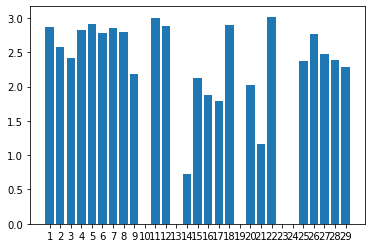

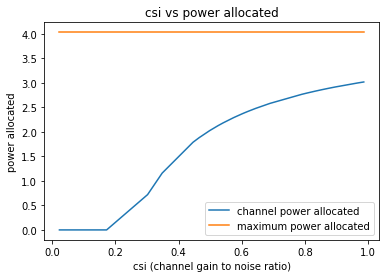

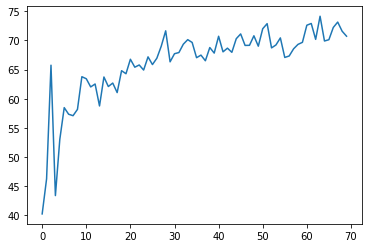

70
Power Allocated= 3.1235118546253275
CSI= 0.8107624286227622
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.736727
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.651999

Power Allocated= 1.0134326892389502
CSI= 0.2990890258701554
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.0705983384287245
CSI= 0.43738400739490635
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2700140771279487
CSI= 0.9200438556257771
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06289941100270113
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3113358641712467
CSI= 0.9564042967169183
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03214948692495123
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1711684514011531
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.738100651596882
CSI= 0.6177346164520386
SNR= 5.808528005279032
Client: cli

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 0.5149687557269962
CSI= 0.26028448882760324
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1173640484091516
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.163430220395954
CSI= 0.8378798322439847
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.915005929826993
CSI= 0.693523186926039
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0231851837221884
CSI= 0.29996398002722957
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8388330936087582
CSI= 0.6587243423284969
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 0.734860
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 1.383081


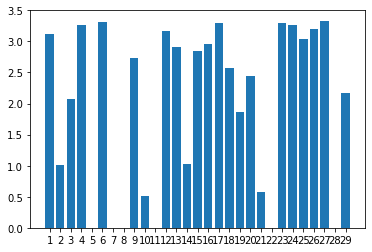

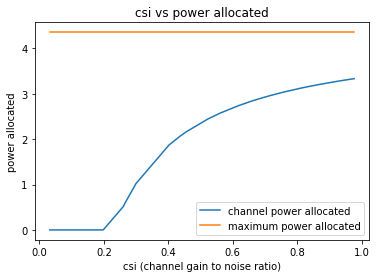

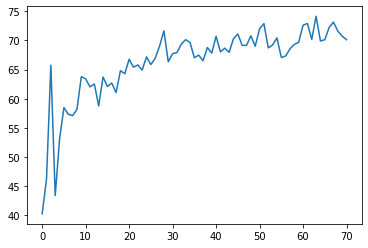

71
Power Allocated= 3.1244360175508743
CSI= 0.48237656980744203
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.192441616858829
CSI= 0.9949619300270219
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.208986403172362
CSI= 0.2507196409405953
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 5.611931
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 1.829511


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.655607184874643
CSI= 0.39340681452637627
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.086902432466529
CSI= 0.9004119487897937
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0820619153254896
CSI= 0.4727141627590774
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04963990774359328
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5040725933109367
CSI= 0.3712734443188592
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.105363033900726
CSI= 0.9156317129076212
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 3.583863266419959
CSI= 0.6197161716833443
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0942916465466499
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03649198558391553
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.179291994066705
CSI= 0.49548779003930776
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13220456330210106
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.306523920765243
CSI= 0.5288259658096032
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.101262946607819
CSI= 0.9122071323023749
SNR= 13.12832021207836
Client:

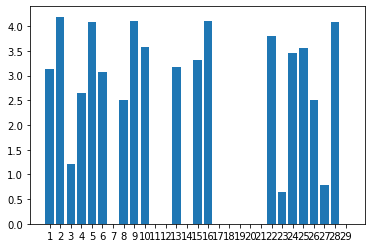

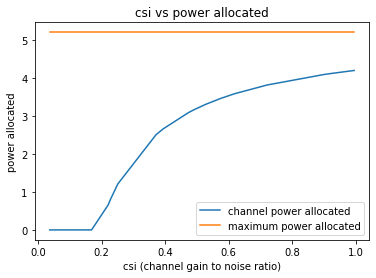

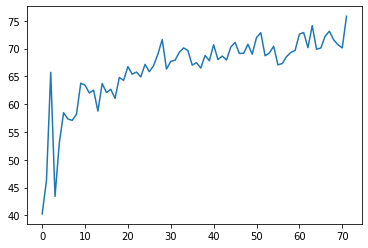

72
Power Allocated= 2.890680718611081
CSI= 0.7704300337079892
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 1.078816
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.546780

Power Allocated= 2.863296233108784
CSI= 0.7545114787298406
SNR= 4.5296012076772785


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.966445006459231
CSI= 0.8181885875300298
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7552857244115119
CSI= 0.41095247656785094
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.193087212285686
CSI= 0.5011099826038081
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 6.835298
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.744645

Power Allocated= 1.1313215761800497
CSI= 0.32708218865826455
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4855212827608852
CSI= 0.36994071385826655
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4712596983498534
CSI= 0.582276408136387
SNR= 5.7937730

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.930536
Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.865934

Power Allocated= 2.549369601792976
CSI= 0.6100211164977314
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02029082727612308
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6163998256355163
CSI= 0.636028216114541
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 0.942932
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 1.121642

Power Allocated= 2.975565279627256
CSI= 0.824339897096413
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 1.149394
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 0.516936

Power Allocated= 0.22169614446898667
CSI= 0.25208213719348305
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 

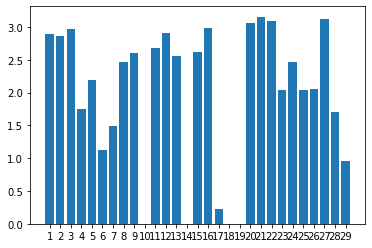

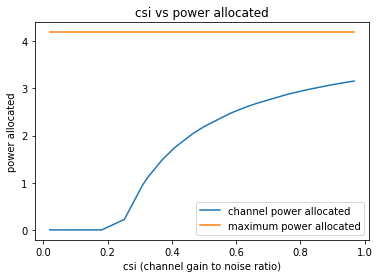

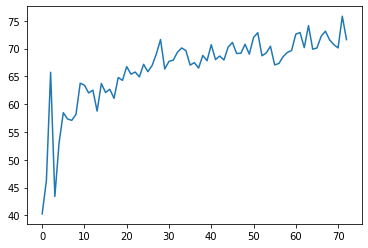

73
Power Allocated= 1.9069771529622987
CSI= 0.47953406987874914
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.058222849734379
CSI= 0.5170331751473759
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.434383347619527
CSI= 0.641868558565713
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05587197325121529
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.181231375299581
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11204241725037811
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8935346562086885
CSI= 0.3227055570774363
SNR= 5.763716831196649
Client: cli

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.721890
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.590462

Power Allocated= 2.791169377263712
CSI= 0.8325248545165645
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3194252241149695
CSI= 0.5977609691665394
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8441208928860444
CSI= 0.8709179237349712
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1628907415769056
CSI= 0.5466141697950292
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.105693
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.310903

Power Allocated= 2.844013049458349
CSI= 0.8708361323895982
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.777530
Model client12 Train Epoch: 2 [0/3

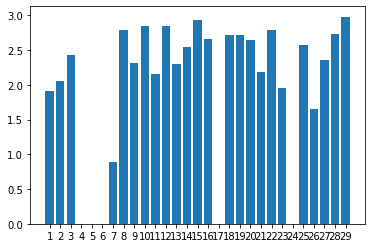

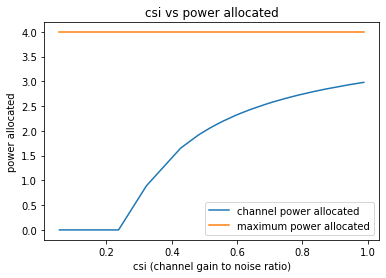

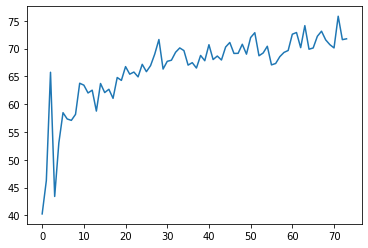

74
Power Allocated= 2.7040632750089717
CSI= 0.6306868386423303
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8072369300055002
CSI= 0.402836077353941
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2291628067516847
CSI= 0.94297506164186
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.056483216307619
CSI= 0.30929559876335855
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1002159745907316
CSI= 0.8407457229803998
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5828687175528882
CSI= 0.3694443620048148
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.132452559374746
CSI= 0.463

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_


Power Allocated= 0
CSI= 0.2234977695067707
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9865459658924056
CSI= 0.7674065417834238
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.359150969609079
CSI= 0.5180044706554844
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.682063729151387
CSI= 0.6220559221861197
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.764748
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 1.054805

Power Allocated= 1.607769045658058
CSI= 0.3728745414909157
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 2.531024
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 1.305605

Power Allocated= 0.0404033054801225
CSI= 0.2353365926700468
SNR= 8.858041469455715
Client: client15
Mode

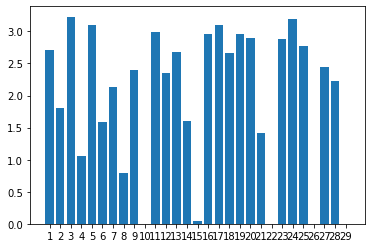

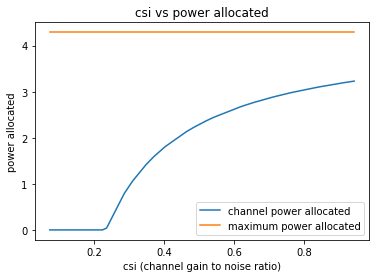

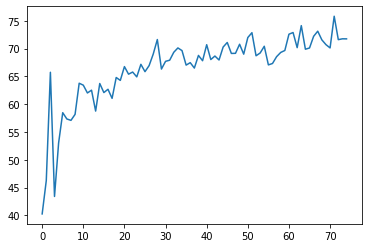

75
Power Allocated= 0.08243120254997294
CSI= 0.20066520808906096
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 1.750851
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.721972

Power Allocated= 0
CSI= 0.13131653257968456
SNR= 4.5296012076772785
Client: client2


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5993854013514213
CSI= 0.6819092810229804
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.010200775303213172
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04806692028830162
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8839890631793343
CSI= 0.8461188473214891
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.025048917245813
CSI= 0.9607927270750893
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.913767255468244
CSI= 0.8679885921811584
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.

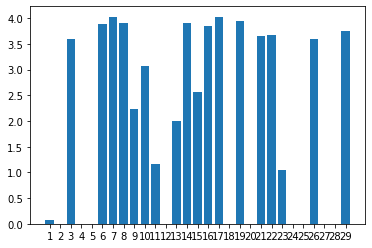

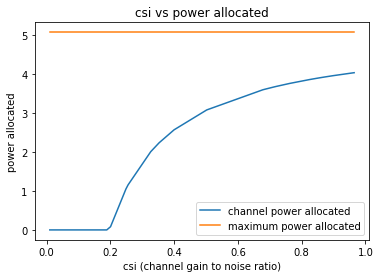

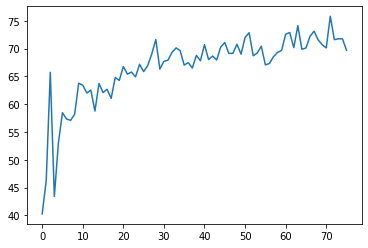

76
Power Allocated= 1.1510930449001333
CSI= 0.2792114804944228
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4046042526679132
CSI= 0.23105342216898683
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.247858690761258
CSI= 0.4024551411967018
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.073488202905313
CSI= 0.6027293523744395
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4564155938832224
CSI= 0.23385291935965613
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 22.143368


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 4.122181

Power Allocated= 3.5912128474316467
CSI= 0.8761210257916708
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.987376
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.647180

Power Allocated= 0
CSI= 0.018912275222743413
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9339407925832615
CSI= 0.3573129796918112
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08623472018590939
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.696339192996907
CSI= 0.3293516395601499
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 1.270397
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 0.924893


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.732324003112763
CSI= 0.4999290941287102
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5131099199344504
CSI= 0.45055238348454063
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8135511279300514
CSI= 0.2551634532636847
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4315499619617142
CSI= 0.7686054171634592
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6493892469765719
CSI= 0.324336412095396
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.515849055653319
CSI= 0.45110910811869986
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 2.577918
Model client16 Train Epoch: 2 [0/384 (0%)

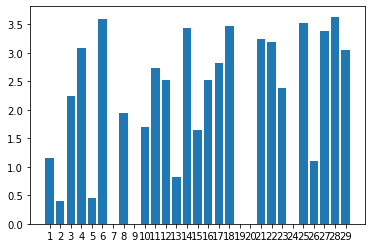

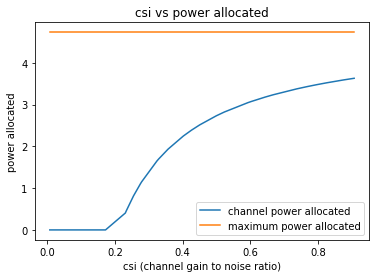

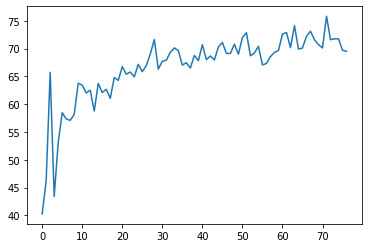

77
Power Allocated= 0
CSI= 0.21665174480912186
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.573974873216182
CSI= 0.5240211115642242
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 1.647932
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 3.412202


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 3.4349541351332387
CSI= 0.9547990492878833
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9847139269195755
CSI= 0.40038741356610497
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.013309866570255124
CSI= 0.22376445315575255
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 100.889771
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 17.307554

Power Allocated= 3.3500964554610793
CSI= 0.8832373634708882
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3762166580822086
CSI= 0.9040951448573479
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.983209
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.811008

Power Allocated= 1.4916439775068482
CSI= 0.33437536316034855
SNR= 5.793773047542457
Cli

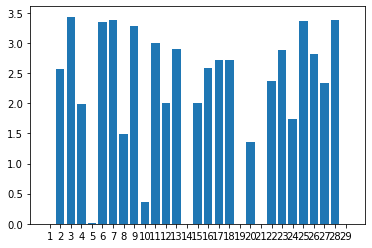

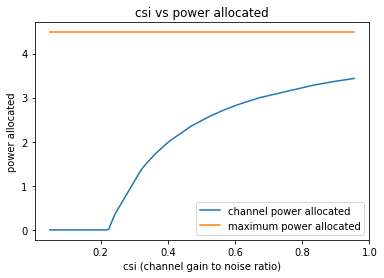

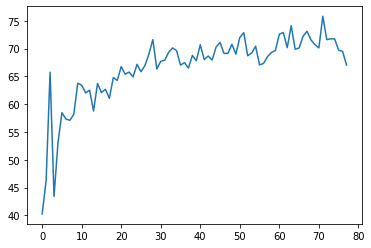

78
Power Allocated= 0.5127096192782625
CSI= 0.2496992129899981
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7012085021111907
CSI= 0.2620325678393324
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 0.641876
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 2.129811


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0.16861251022827606
CSI= 0.2299423845686085
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 9.499786
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 3.471756

Power Allocated= 0
CSI= 0.19948834493431344
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 0
CSI= 0.12082048495568576
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1327552093532941
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5852560864900704
CSI= 0.5175255037964506
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.421568766246068
CSI= 0.9124426906466024
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3712610041325273
CSI= 0.8723970907633113
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.32256321125325
CSI= 0.455588172154311
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.425475435336686
CSI= 0.477999459834196
SNR= 7.027128190861585


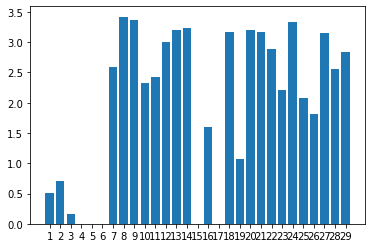

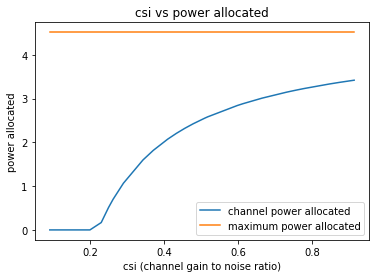

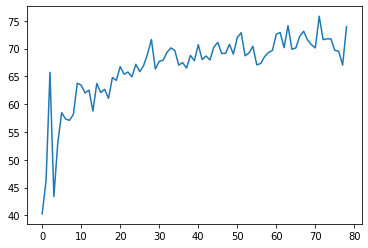

79
Power Allocated= 2.682885055282685
CSI= 0.5092885909364616
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09704130761026986
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.639552557052301
CSI= 0.9931909122232334
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6288254582557506
CSI= 0.9827209471981142
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6731295476793551
CSI= 0.2516813079828816
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 4.562654


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 2.207966

Power Allocated= 2.1447939676328702
CSI= 0.3997418692892317
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.525101
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 1.076301

Power Allocated= 3.329835573742362
CSI= 0.7595478472486031
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7087415568704176
CSI= 0.34040620617169504
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.594140
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 1.132990

Power Allocated= 3.1920495422231476
CSI= 0.6875882422580332
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06915795503268707
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9014356394572758
CSI= 0.364302349

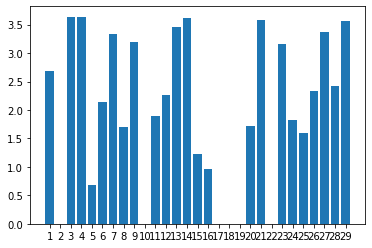

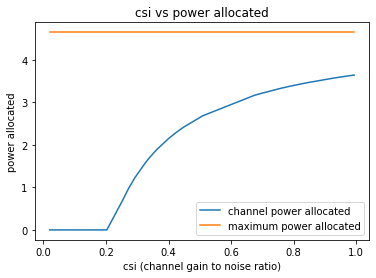

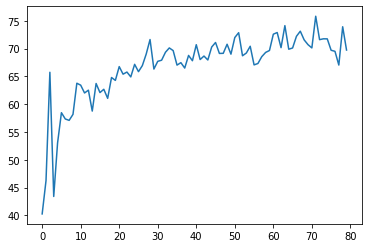

80
Power Allocated= 3.2055033470366707
CSI= 0.9252206413233532
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.025580723289628127
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2807962226088714
CSI= 0.49862121374666446
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7237233312223803
CSI= 0.3902281734847982
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2000362599478294
CSI= 0.9205641866428887
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20472802811381785
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 2.87325873967007
CSI= 0.7076800876112729
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.696768
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.614809

Power Allocated= 3.1825454619580986
CSI= 0.9059766915260166
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9943609312258195
CSI= 0.7740143644434896
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7506506794718537
CSI= 0.3943721611940134
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.281480402964652
CSI= 0.9951771574086197
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2415772268424385
CSI= 0.9571673440336549
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in th

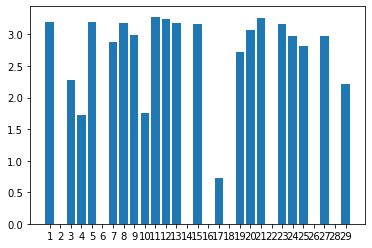

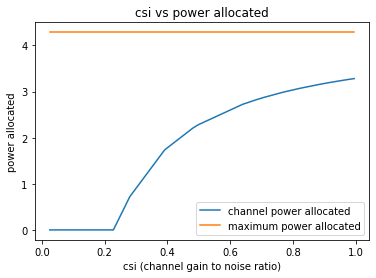

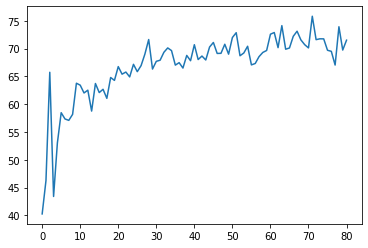

81
Power Allocated= 1.7372601353355788
CSI= 0.3338011528229051
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.194072875152173
CSI= 0.39385851911968794
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 2.017028
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 1.462033


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.099676294667508
CSI= 0.6122276433598157
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7793086213620848
CSI= 0.25292462821764794
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.842717
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 1.552649

Power Allocated= 0
CSI= 0.12731072750277617
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1528902188233605
CSI= 0.38757204625573694
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06563152479590473
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7345080297758866
CSI= 0.33349478583409
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7180

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.772591
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.632396

Power Allocated= 2.6686034111270134
CSI= 0.4843899877993919
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9448345233559863
CSI= 0.5592149533953841
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3938649527337086
CSI= 0.7467196374835489
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9855768624882977
CSI= 0.5722530087365736
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.63029484575201
CSI= 0.9068149560750394
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.378942999900865
CSI= 0.29814144637328144
SNR= 13

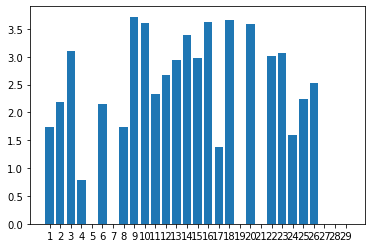

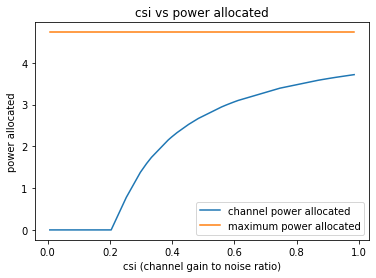

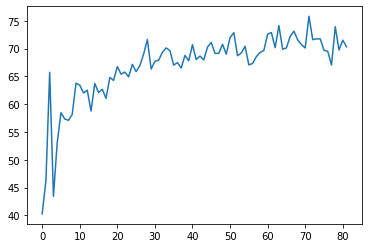

82
Power Allocated= 2.6833002666172523
CSI= 0.614611316732592
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1558812913605374
CSI= 0.8662031918902854
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2164555956165819
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.172937822851263
CSI= 0.8791927567147795
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 1.092842


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.816004

Power Allocated= 0
CSI= 0.20211923813218624
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2116304886433467
CSI= 0.9101546822095382
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1877724512810478
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.124330797657141
CSI= 0.4574536056533218
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 1.270126
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.746040

Power Allocated= 3.0399868322829033
CSI= 0.787179679820019
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2273598724852777
CSI= 0.4800802797691527
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch:

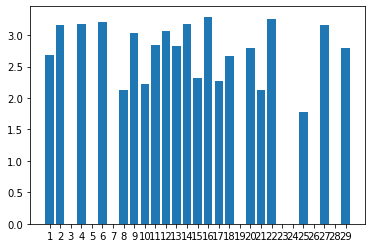

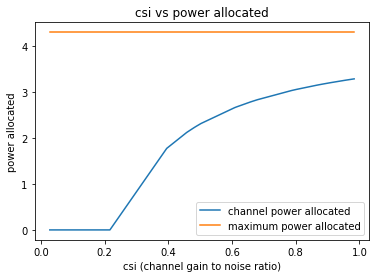

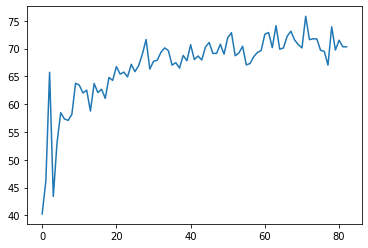

83
Power Allocated= 0
CSI= 0.0036080371544299217
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.170147293755755
CSI= 0.6370893810470541
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 1.245866
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 1.133962

Power Allocated= 1.4392997380200345
CSI= 0.3029856793303114
SNR= 4.644858008883832


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.932014
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 1.318435

Power Allocated= 3.6338086275187136
CSI= 0.9041778252990769
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.886730
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.627986

Power Allocated= 3.5282686324601187
CSI= 0.8254113589303395
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.480076895781954
CSI= 0.7938342160384734
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.860854
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.868270

Power Allocated= 1.7624118777913909
CSI= 0.3358664511064464
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6228364618569735
CSI= 0.8952957848265234
SNR= 5.793773047542457
Client: client8
Poor Channel, client not 

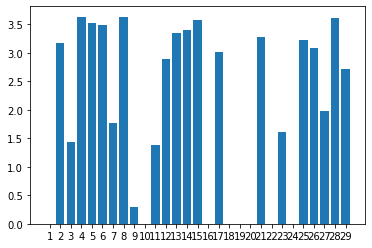

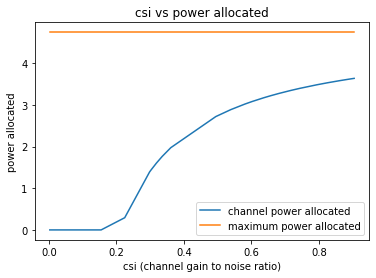

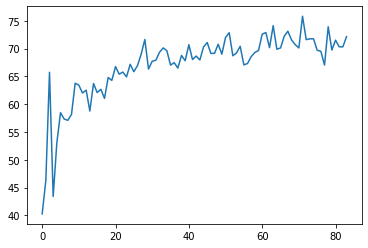

84
Power Allocated= 1.2631578906343086
CSI= 0.32097481405896644
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 6.693164
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 1.240579

Power Allocated= 0.8871075063120508
CSI= 0.2864049613097879
SNR= 4.5296012076772785


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1503371221346974
CSI= 0.8141134634538311
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3726028682786855
CSI= 0.993972288198166
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.346550985118189
CSI= 0.9688832030677125
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8401557130774715
CSI= 0.649978925459762
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19550982467206013
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 3.2421537213322797
CSI= 0.8798840287284906
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1647452203208477
CSI= 0.8237762157170448
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1378292035202637
CSI= 0.8059070211007062
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.44427552075527244
CSI= 0.2541689029387718
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.01120391424818079
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7069077216652433
CSI= 0.5981721967803723
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.195941677574374
CSI= 0.8455047575070

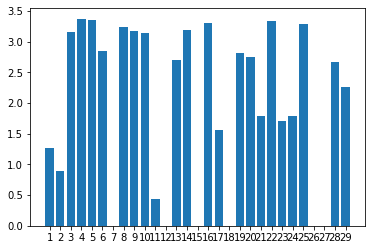

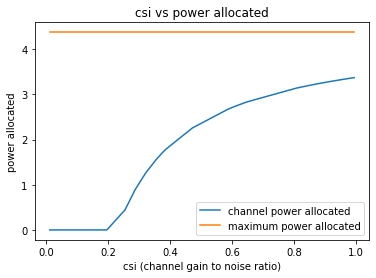

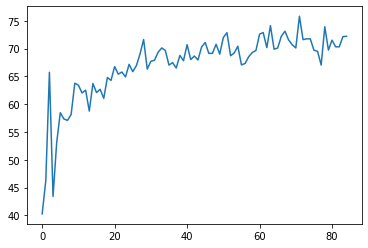

85
Power Allocated= 2.840547493919464
CSI= 0.9043370400731019
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4542065715413197
CSI= 0.6701858834947245
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4737393377522823
CSI= 0.6790753768804725
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9004330297540286
CSI= 0.4887831875108356
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.86320216056534
CSI= 0.9232521256933307
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.896771284633213
CSI= 0.9527814576528091
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9102435036184406
CSI= 0.965

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9430340394078467
CSI= 0.9967149533258595
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18125537395236957
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.010819124021102411
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.76077676560924
CSI= 0.4575500719856509
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 1.305829


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client17 Train Epoch: 2 [0/384 (0%)]	Loss: 0.525620

Power Allocated= 2.8812365944939513
CSI= 0.9388848680719878
SNR= 13.545407086100507
Client: client18
Model client18 Train Epoch: 1 [0/384 (0%)]	Loss: 1.158524
Model client18 Train Epoch: 2 [0/384 (0%)]	Loss: 0.614208

Power Allocated= 2.729110862978999
CSI= 0.8215448154823998
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 0.962176
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.751544

Power Allocated= 2.7879857468533933
CSI= 0.8633012787298269
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.724128444109919
CSI= 0.4500042025523201
SNR= 15.73789526637954
Client: client21
Model client21 Train Epoch: 1 [0/384 (0%)]	Loss: 1.022683
Model client21 Train Epoch: 2 [0/384 (0%)]	Loss: 0.500029

Power Allocated= 2.901445610883032
CSI= 0.9570437586253204
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 

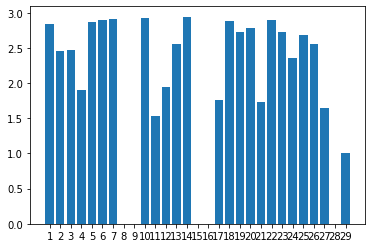

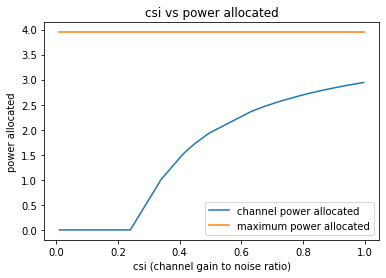

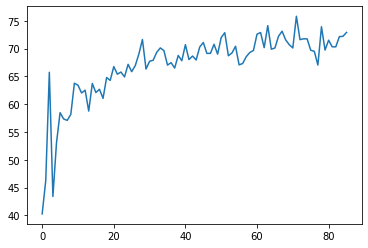

86
Power Allocated= 0.8078649974099203
CSI= 0.27004096466976424
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5535077497587153
CSI= 0.5108559163262243
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4663308354825553
CSI= 0.9572345680961626
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3161246191339773
CSI= 0.8369025570345817
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1928407065378472
CSI= 0.43137546457433884
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.944417


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 2.749765

Power Allocated= 2.8174351092374534
CSI= 0.5904680457028685
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.804345
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.483800

Power Allocated= 0.7288445211314656
CSI= 0.264399016030477
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3687583640211507
CSI= 0.8754662460773104
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18332183015637704
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.301081821318166
CSI= 0.4525040370038038
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0116908359107386
CSI= 0.6669707960920939
SNR= 7.027128190861585
Client: client11
Poor Chan

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 3.463010026057848
CSI= 0.954201358946715
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.763442914894073
CSI= 0.572225127825061
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 3.192488
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 0.592860

Power Allocated= 2.705469699150809
CSI= 0.5538517974010103
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 1.042694
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 0.756546

Power Allocated= 1.5617597889990233
CSI= 0.33906959201253994
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 0.725338
Model client17 Train Epoch: 2 [0/384 (0%)]	Loss: 0.132748

Power Allocated= 0
CSI= 0.17354811572752593
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.057310200766927055
S

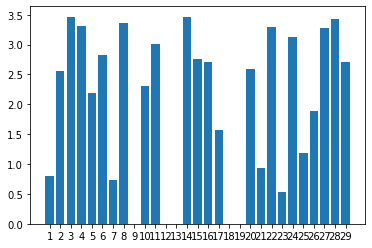

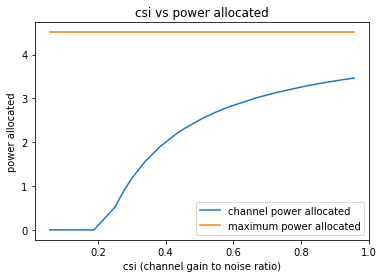

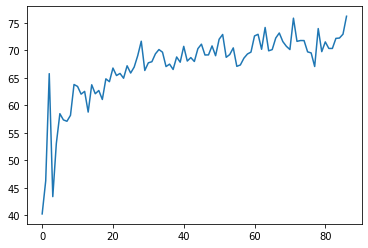

87
Power Allocated= 3.5588001012679555
CSI= 0.8711042452895592
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1965406297662292
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.428257590859853
CSI= 0.7821600297493084
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.520741540449326
CSI= 0.4574509349429601
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15491273335017708
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08261933727390591
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9209266699483303
CSI= 0.559960057359114
SNR= 5.763716831196649
Client: cli

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 1.124248
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.529777

Power Allocated= 0
CSI= 0.0028601433591424197
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.262317828090213
CSI= 0.6923047876654616
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.048017409904482444
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6167363354765776
CSI= 0.9174042618911169
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.898582
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.573314

Power Allocated= 3.1206992605229193
CSI= 0.6304895653280705
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.298822330890502
CSI= 0.7102545116069914
S

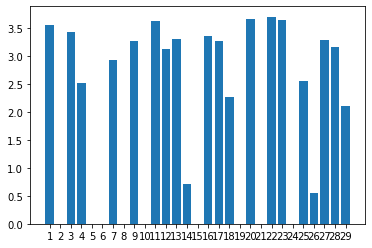

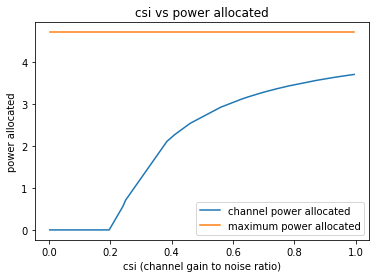

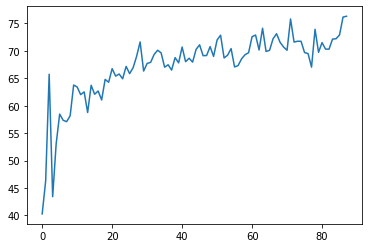

88
Power Allocated= 2.969356569263624
CSI= 0.747374293573118
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.838695227291601
CSI= 0.6808839792649795
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.189978128664787
CSI= 0.47227819201385945
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2179636002241234
CSI= 0.32368633424323967
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2616602450825214
CSI= 0.9562844329493854
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.880743


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 2.748016

Power Allocated= 1.9972419113525404
CSI= 0.43287563843588694
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1097357290467786
CSI= 0.3127307859746469
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1182584730018641
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.275287893533773
CSI= 0.9689111945665576
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 3.1610393919949984
CSI= 0.8723454714045369
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.600195760659719
CSI= 0.2697469274024129
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9481731669070026
CSI= 0.7357263256133403
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3186100323125847
CSI= 0.5028248214852891
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.737164
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.440662

Power Allocated= 2.0708850934136196
CSI= 0.44712938060953566
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 0.878150
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 0.883452

Power Allocated= 2.706039483671713
CSI= 0.6244790513785199
SNR= 8.858041469455715
Cl

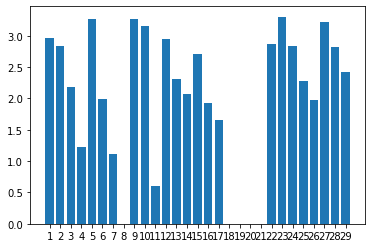

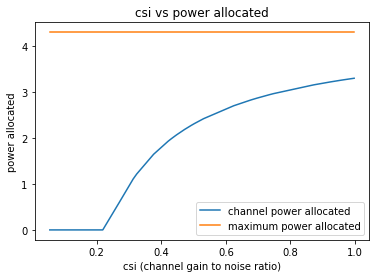

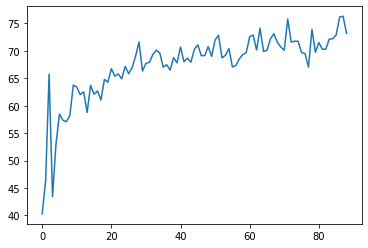

89
Power Allocated= 0
CSI= 0.054876175741571
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.0985315031175364
CSI= 0.8072412588724283
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3807803067126283
CSI= 0.2527461996495983
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3698587800735886
CSI= 0.2520504460627784
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08841393595046587
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3735078741428506
CSI= 0.20145812745381408
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.952482


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.541737

Power Allocated= 4.248879154123302
CSI= 0.9187466211606821
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.854370
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.402257

Power Allocated= 3.693285127569845
CSI= 0.6082601471540038
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8829334753545
CSI= 0.40743403225607133
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.134104454597002
CSI= 0.8311072979200073
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.039214818676089336
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05138675361677525
SNR= 7.179421131547728
Client: client12
Poor Channel, client not t

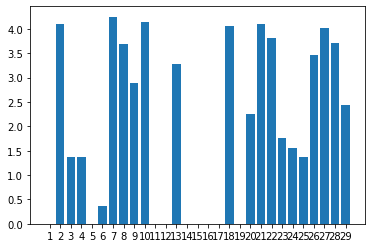

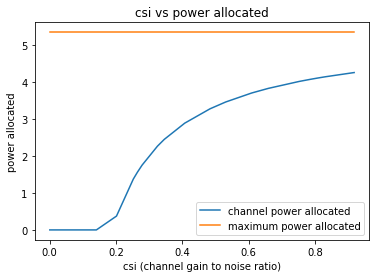

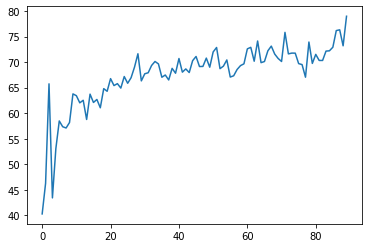

90
Power Allocated= 3.3897016269502362
CSI= 0.697014443358644
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.264690829030565
CSI= 0.6411484055076714
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 1.691326
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.886262


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.4846130301999656
CSI= 0.7463917019549539
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 1.801809
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.480263

Power Allocated= 0
CSI= 0.17067164140427593
SNR= 4.988821639600507
Client: client4


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07468665191582313
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17785010036015414
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3318275387997276
CSI= 0.4011932147706452
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.788180337411639
CSI= 0.9650536796060143
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.759662
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.837100

Power Allocated= 3.797421347735887
CSI= 0.973737540140608
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0491004497652372
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averagi

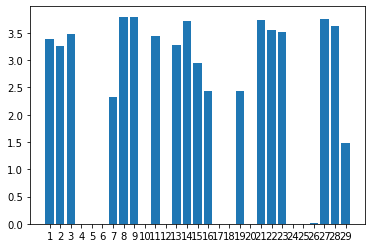

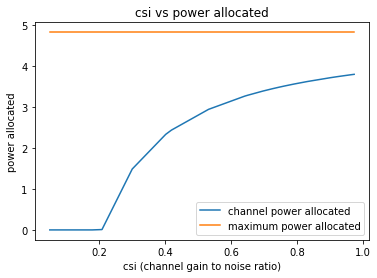

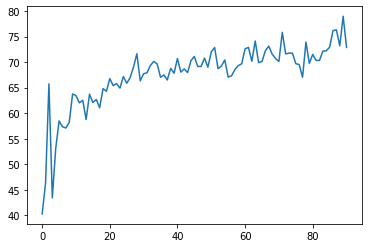

91
Power Allocated= 3.6809858783382836
CSI= 0.8678544869430873
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7220674201451662
CSI= 0.47366755161909146
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.723938586707696
CSI= 0.4740877407438473
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13489318642312942
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5570510535958606
CSI= 0.7835751825118177
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.17797927091303
CSI= 0.3766090374151394
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.058494322607204
SNR= 5.76371683119

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5299766056746655
CSI= 0.7672970782208731
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.715773
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.565898

Power Allocated= 0
CSI= 0.04808020791605838
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7612843815671333
CSI= 0.325524182083508
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.392990299378087
CSI= 0.6943178858472577
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.791482433255557
CSI= 0.9599044587601249
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04143059927608961
SNR= 7.5725046557150355
Client: client13
Poor 

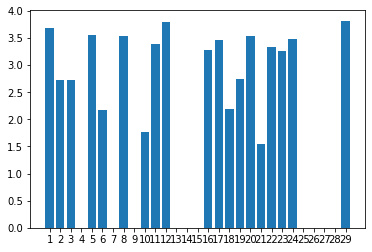

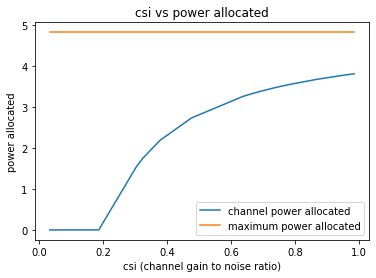

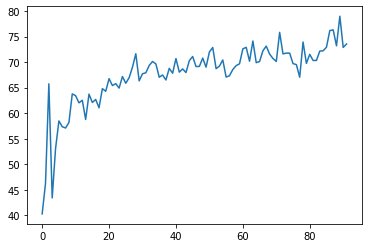

92
Power Allocated= 0
CSI= 0.03880112921901635
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.023606524400177964
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.009612030629475021
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.635106080112471
CSI= 0.5092002944049194
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4383770788870542
CSI= 0.8616286793000302
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3599366272616624
CSI= 0.8070808733599224
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.985412


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.803304

Power Allocated= 3.550013729522377
CSI= 0.9533287416144198
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.24853164919906146
CSI= 0.22986190316157828
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1124006142546619
CSI= 0.2868148996631169
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.954194
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 2.762451

Power Allocated= 2.873408432195135
CSI= 0.579521540544824
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.565428918665132
CSI= 0.49175307664239887
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9404448348026833
CSI= 0.6029453896917737
SNR= 7.179421131547728
Client: 

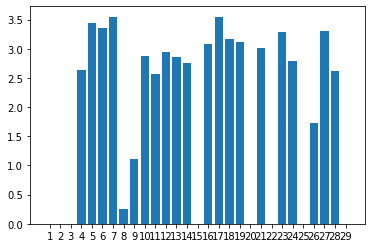

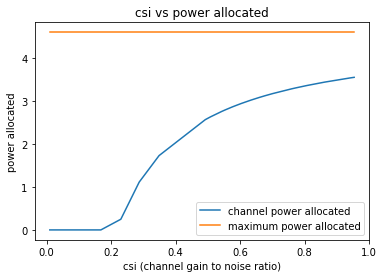

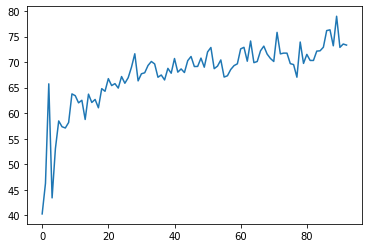

93
Power Allocated= 3.8658738375224084
CSI= 0.940602597216624
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07814585658789919
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.249406135023256
CSI= 0.5953741995534888
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12175854938218134
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.061030725097864
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.48503081819646
CSI= 0.29036078299746293
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 2.729530


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.666154

Power Allocated= 2.457081773744694
CSI= 0.40454051283221404
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.722999361321895
CSI= 0.8291717749909336
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.208626543412497
CSI= 0.5812616793983643
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8050252364274728
CSI= 0.32010275599704663
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.732350
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 0.926730

Power Allocated= 2.5359819597269224
CSI= 0.417878493003325
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1057854271898995
CSI= 0.3542033921561044
SNR= 7.179421131547728
Client:

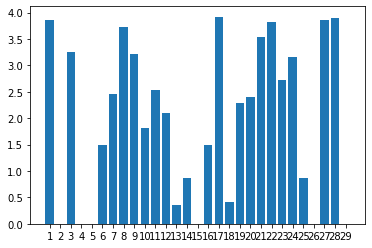

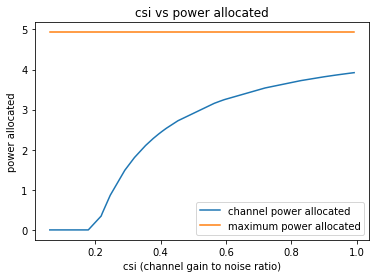

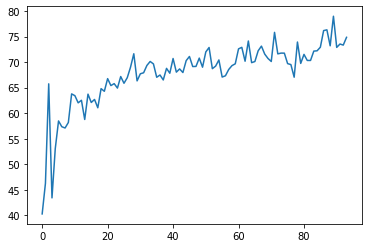

94
Power Allocated= 2.8852413514117616
CSI= 0.9164071629984574
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.954710887028031
CSI= 0.9787144545643077
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 1.595191
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.930431


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.740171687768134
CSI= 0.8088732274753417
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5066469741933726
CSI= 0.6803589419017267
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.955626626335361
CSI= 0.9795924116150817
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.491783
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 1.575044

Power Allocated= 2.087237402688218
CSI= 0.529318429642249
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.951566
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.471278

Power Allocated= 2.8259912616606226
CSI= 0.8692114113674713
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.22484684774422403
SNR= 5.793773047542457
Client: client8
Poor Channel, c

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 1.205143

Power Allocated= 1.1109631777808895
CSI= 0.3489797006189501
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7518263004887076
CSI= 0.8165711285964481
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.838642081525256
CSI= 0.8788757372586837
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 0.696980
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 0.496970

Power Allocated= 2.62415408072576
CSI= 0.739477997234102
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 0.730038
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 0.525710

Power Allocated= 2.444196620512829
CSI= 0.6526295875029766
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 0.747797
Model client17 Train Epoch: 2 [0

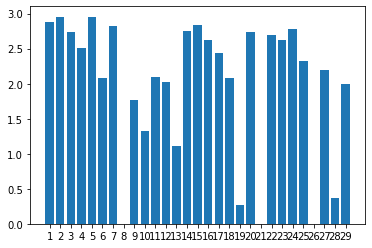

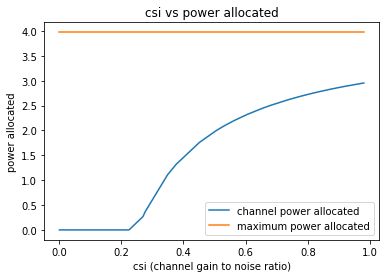

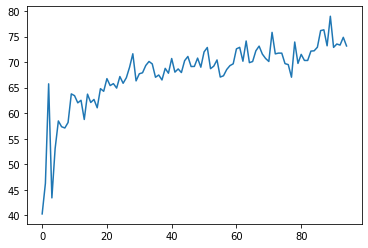

95
Power Allocated= 2.8981428130445535
CSI= 0.6516860125431954
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20080891938291756
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1534376565359112
CSI= 0.30495368687673097
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15287162436411483
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.348261763056783
CSI= 0.9222009594982475
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.536526256235362
CSI= 0.5273989399763893
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.782073


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 1.038450

Power Allocated= 3.0188453304258838
CSI= 0.7073242377020738
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8283034817824082
CSI= 0.3839772982752343
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.856328
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 1.055683

Power Allocated= 3.289373097954326
CSI= 0.8746985451345084
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1413595587480065
CSI= 0.7744346395467874
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3009965017956975
CSI= 0.8836829268556876
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5848658381340126
CSI= 0.5411963314385043
SNR= 7.179421131547728
Client: 

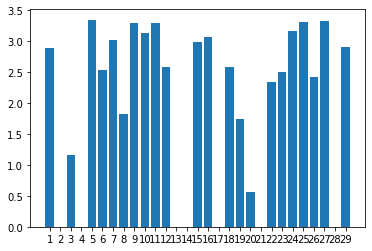

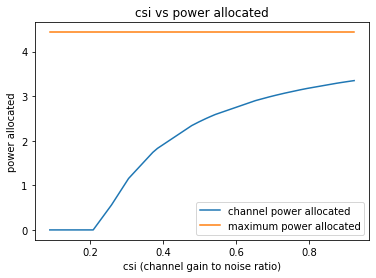

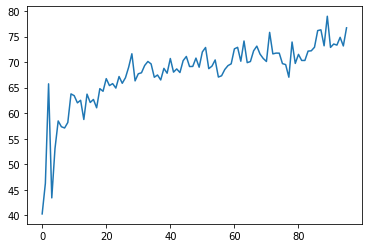

96
Power Allocated= 0
CSI= 0.19441806351327695
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1289827718630363
CSI= 0.5867614848242939
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0589812232958247
CSI= 0.5636115828589198
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1999118943693605
CSI= 0.2752287857703851
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.664969167832314
CSI= 0.31562830942188225
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.612395


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.767855

Power Allocated= 3.1770225737221907
CSI= 0.6037808009662553
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.836523596232735
CSI= 0.5008190437491711
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.529713048571936
CSI= 0.7671419417182185
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8962736951838886
CSI= 0.3404859113465599
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1785391997863095
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7912945578577664
CSI= 0.9597313784692354
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power

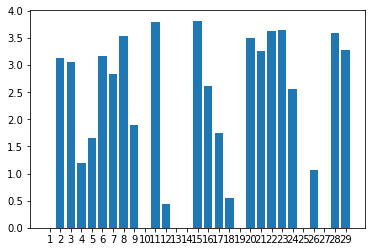

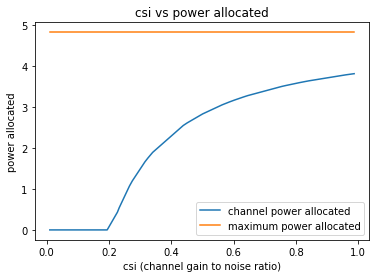

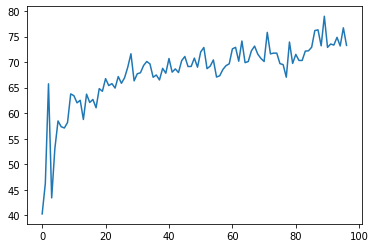

97
Power Allocated= 0
CSI= 0.17164573216502343
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0715654518929062
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04787610500127837
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.90904954796176
CSI= 0.6831402917886907
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6914171722326383
CSI= 0.21360855041432725
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.69758405999128
CSI= 0.3737907420973977
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.950458


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.948040

Power Allocated= 3.98731286793386
CSI= 0.7217273181705794
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9111875948023362
CSI= 0.2241303123794609
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9458046699092884
CSI= 0.41201891419038505
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.06771244823400302
CSI= 0.18849554161568927
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 46.243164
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 11.657059

Power Allocated= 0
CSI= 0.030490579446352473
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.295006748936611
CSI= 0.9277548362084822
SNR= 7.179421131547728
Client: client12
P

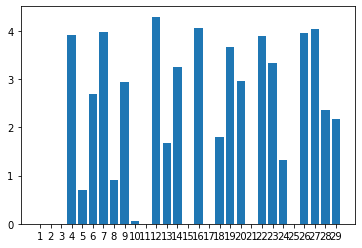

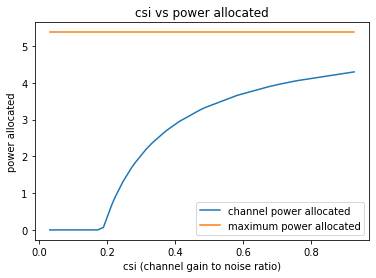

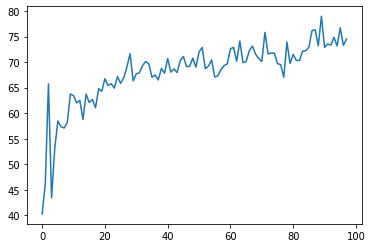

98
Power Allocated= 0
CSI= 0.09935722630286548
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10855854817809651
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.443136999783911
CSI= 0.9261803305521044
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.054471677309820055
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17377990851308067
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.887817517051362
CSI= 0.6116122562200286
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2643616008679266
CSI= 0.7946101637925105
SNR= 5.763716831196649
Client: client7


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.814848
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.539137

Power Allocated= 2.7505316085851654
CSI= 0.5642357791091891
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7386080328018005
CSI= 0.5604651333078188
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.827265808851383
CSI= 0.5897705936400464
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 1.721502
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 2.584586

Power Allocated= 2.6528370085718245
CSI= 0.5347584045415973
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3746326694458992
CSI= 0.8709225886493397
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02625

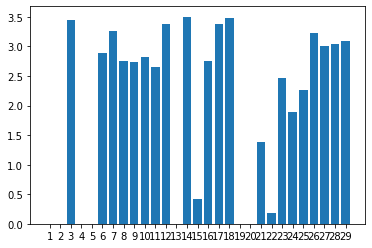

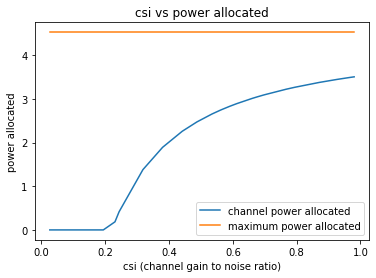

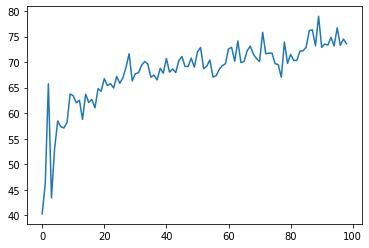

99
Power Allocated= 3.706924703386763
CSI= 0.8114758556303104
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.744594725281466
CSI= 0.8370634741160655
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 0.914393
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.856329


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.606074411418208
CSI= 0.7500902842608518
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.618831
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.555451

Power Allocated= 3.437999842405976
CSI= 0.6661127200848502
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.579063862623579
CSI= 0.2976028038119263
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0931083514122353
CSI= 0.26000100987004826
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16898917124558743
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17400771695950357
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.49289

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Poor Channel, client not taken for averaging in this round

Power Allocated= 2.922270289008088
CSI= 0.49579148151790253
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.765008
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.735852

Power Allocated= 3.163561591778274
CSI= 0.5631627368617527
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.158461353775846
CSI= 0.5615498175410626
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.10092232124852
CSI= 0.5439734725986471
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02846784500496302
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.167722015536349
CSI= 0.5644853235079886
SNR= 13.12832021207836
Client: client16
Mod

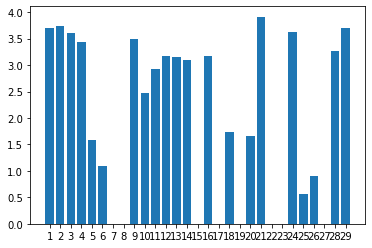

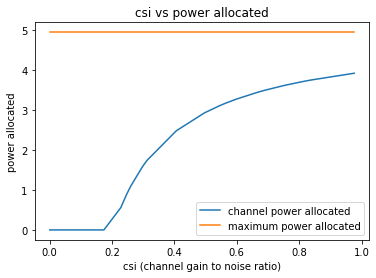

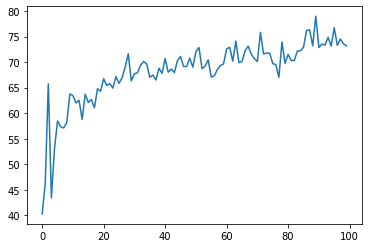

100
Power Allocated= 0
CSI= 0.16392724967797434
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8777160159285118
CSI= 0.34313438924445294
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4165807396147896
CSI= 0.42097369608496793
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.711892558897051
CSI= 0.3246612514823264
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 1.301434
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.650980


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 3.3283778208463084
CSI= 0.6832242661579386
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2529329803560563
CSI= 0.649733279698227
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.614130
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.532214

Power Allocated= 3.443263410284712
CSI= 0.741420289046747
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0811724005387529
CSI= 0.2694797718920796
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8283138180243803
CSI= 0.5092395791163362
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5700166328666834
CSI= 0.818324286818445
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this 

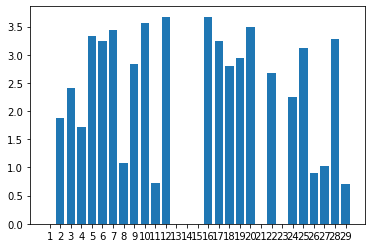

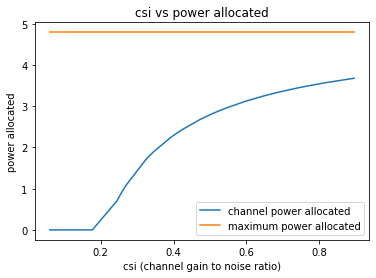

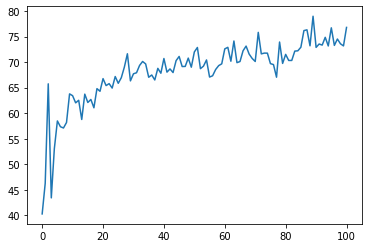

101
Power Allocated= 3.111635684698861
CSI= 0.8633944693703753
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1125246407232758
CSI= 0.31672328887237455
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0046612617982987326
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1139556878447925
CSI= 0.8651273869068995
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03904306940134261
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1894422164527985
CSI= 0.9255723157503123
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3272991693395415
CSI= 0.5147857654007588
SNR= 5.7637

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.264857223263001
CSI= 0.9950272501495782
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.888480054262633
CSI= 0.7239165078367916
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 1.448565
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 1.390804


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.024478282371928
CSI= 0.8029699980865289
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0183163750106816
CSI= 0.30754672454291476
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.828424
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.624913

Power Allocated= 3.056452564912923
CSI= 0.8241290072928119
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.08579980598424
CSI= 0.31406492477290504
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.655864
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 1.092466

Power Allocated= 2.053470667864815
CSI= 0.45118532218767493
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 2.420156
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 0.675994

Power Allocated= 0
CSI= 0.038

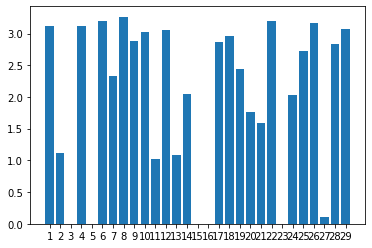

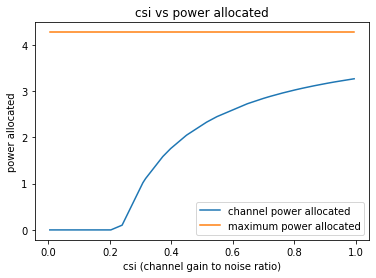

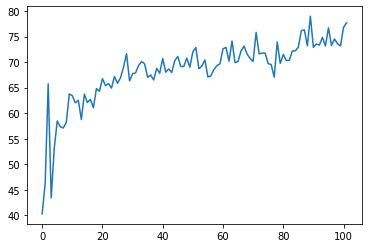

102
Power Allocated= 3.47473825482704
CSI= 0.9123559292249372
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.907889771048006
CSI= 0.6013547508988627
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 0.774580
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.464226


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.771860368326145
CSI= 0.5558824915751885
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08264201185587294
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2447127639596047
CSI= 0.7540972243862136
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.299274616992838
CSI= 0.4402324758893982
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08571440975170752
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8648769763743962
CSI= 0.26983818332844944
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.477267214747318
CSI= 0.9144658869536262
SNR= 5.808528005279

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05409425741561813
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.015296107404235
CSI= 0.6428777837819785
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.764877690575386
CSI= 0.35638883662015086
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.568126
Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.504005

Power Allocated= 0
CSI= 0.00191692248877251
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.566874292858328
CSI= 0.49902006786448205
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 1.944049
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 0.817567

Power Allocated= 3.262719370991304
CSI= 0.

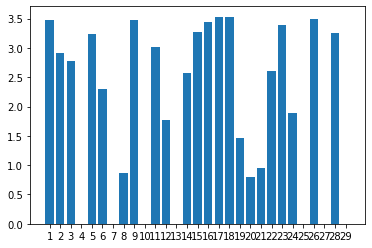

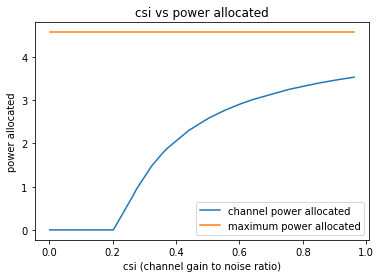

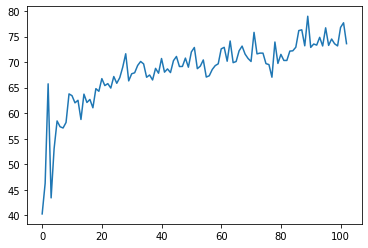

103
Power Allocated= 1.8536947674857576
CSI= 0.3140616117092643
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6495394854492629
CSI= 0.2278815911552643
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9822737833274582
CSI= 0.327277650386782
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7800010463120612
CSI= 0.7950501266722446
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.984832754640843
CSI= 0.9497121520851776
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1248212378430279
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2081265992777634
CSI= 0.54655059522463
SN

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6716662596088563
CSI= 0.7320016625975784
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6952618307239975
CSI= 0.23028095306644114
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 10.421052
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 1.685915


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.8000827404308772
CSI= 0.8079498158240168
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.003113001849419
CSI= 0.9664913828067012
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 0.902927
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 0.519460

Power Allocated= 4.010837279162073
CSI= 0.9737609439735968
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.45697810360059243
CSI= 0.2183022286877767
SNR= 13.545407086100507
Client: client18
Model client18 Train Epoch: 1 [0/384 (0%)]	Loss: 15.406018
Model client18 Train Epoch: 2 [0/384 (0%)]	Loss: 3.752092

Power Allocated= 2.9461713540978987
CSI= 0.47810013991889466
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 1.904510
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.565514

Power Allocated= 3.701312

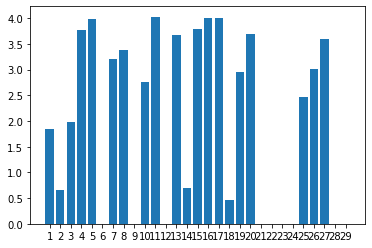

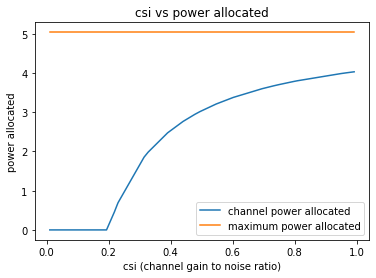

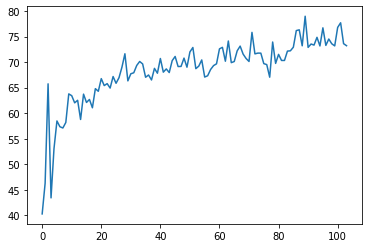

104
Power Allocated= 3.0617523005722878
CSI= 0.4618739719632923
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2059735944748478
CSI= 0.3310303023522858
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 1.162331
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.974942


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.5251112252191135
CSI= 0.3701326833490395
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.27623857565088
CSI= 0.512661061911253
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 2.320724
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 1.088236

Power Allocated= 0
CSI= 0.011057905299732274
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.0663399180396205
CSI= 0.8616937140447962
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11269851227400207
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0688956695356877
CSI= 0.4634028939046335
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 1.127189


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.638207

Power Allocated= 2.6444933753444997
CSI= 0.3872439217420629
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.1972508506068245
CSI= 0.9712564183379601
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.805643441246864
CSI= 0.4130180590981781
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.166818
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.457133

Power Allocated= 0
CSI= 0.15869029116525846
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.022200504478308125
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.007966144005716
CSI= 0.8204260271426149
SNR= 7.593315553337266
Client: client14
Poor Channel, clie

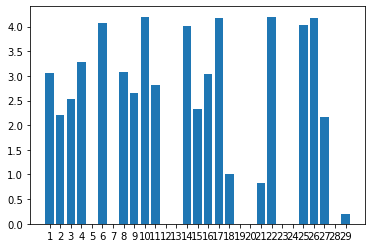

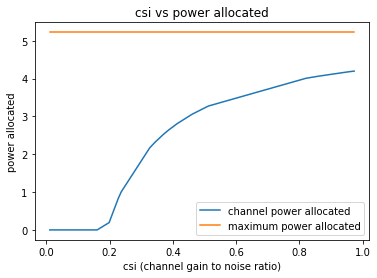

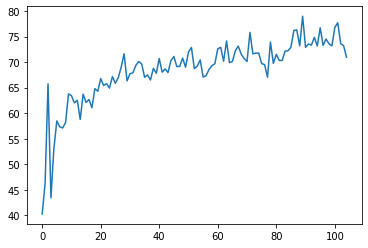

105
Power Allocated= 0
CSI= 0.18184064990327165
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.540479137906173
CSI= 0.9084685474317639
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2373324802313985
CSI= 0.29378064340451737
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9248822248814728
CSI= 0.3681410057207075
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0287999458533044
CSI= 0.2768217610954773
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9046309050220231
CSI= 0.26762284337892994
SNR= 5.481605188045396
Client: client6


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 5.068255
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 1.112149

Power Allocated= 2.351983173490232
CSI= 0.4368243756027327
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.155114314728621
CSI= 0.4022334581230951
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 1.554740
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.700294

Power Allocated= 3.32856842800465
CSI= 0.7618094075104263
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6395116508389957
CSI= 0.9982818963908525
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.363944899003626
CSI= 0.43911884767168097
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.951708
Model client11 Train Epoch: 2 [0/384 (0

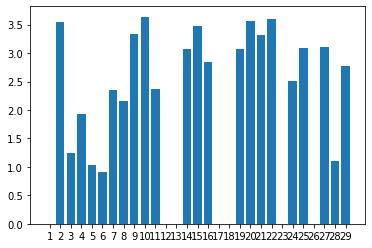

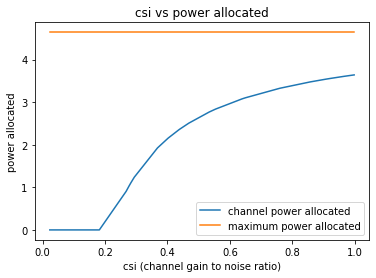

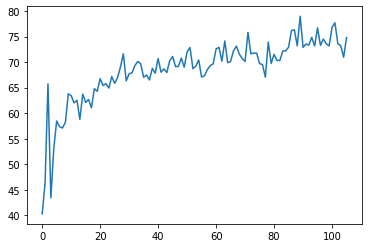

106
Power Allocated= 0.3272995667224232
CSI= 0.2607894017173574
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.073348855552762
CSI= 0.918727217807035
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9159966912594131
CSI= 0.3080890762766373
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.122763550427888
CSI= 0.9624197513261794
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1202145111405697
CSI= 0.9600644772209699
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.025727872281554043
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.106343991496872
CSI= 0.9474477016093543


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6212983095685582
CSI= 0.64913444935808
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1080561451098756
CSI= 0.9489871257542264
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.23923236323860297
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5388671899538187
CSI= 0.6161641937963199
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1385171560238625
CSI= 0.4942435297390557
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 2.333654


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client17 Train Epoch: 2 [0/384 (0%)]	Loss: 0.501996

Power Allocated= 1.4591658047845018
CSI= 0.3700078427898993
SNR= 13.545407086100507
Client: client18
Model client18 Train Epoch: 1 [0/384 (0%)]	Loss: 0.513501
Model client18 Train Epoch: 2 [0/384 (0%)]	Loss: 0.993783

Power Allocated= 0
CSI= 0.19862426088244922
SNR= 14.92795654834405
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.10407243722569
CSI= 0.9454130037162012
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1432301059364383
CSI= 0.981757845255441
SNR= 15.73789526637954
Client: client21
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1102032729478406
SNR= 15.814617278939222
Client: client23
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.136237920725618
CSI= 0.9750643863974259
SNR= 16.727271644180114
Client: client24
Model client24 Tr

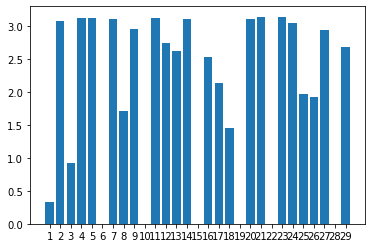

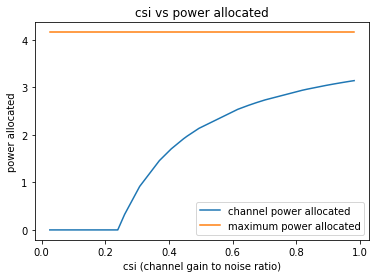

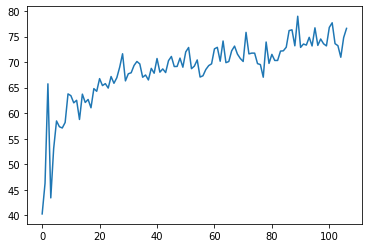

107
Power Allocated= 4.0615806580152505
CSI= 0.7241693840429521
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.005352912504108
CSI= 0.29094124067755134
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.30343774376648
CSI= 0.8779359041462842
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4139557658552637
CSI= 0.4929709019516513
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9664578423850463
CSI= 0.2876857371054954
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.267527


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.816586

Power Allocated= 3.335348747136335
CSI= 0.47458044786905473
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0012954818118896538
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.020276722993092577
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.458132100668506
CSI= 0.33508235610750314
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.3278516240240545
CSI= 0.8971655917787755
SNR= 6.445983530041328


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03636016778872542
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13439685906611765
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14000307120421795
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09161584973133807
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.1024770624079645
CSI= 0.7462708858662415
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1461010582943355
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4797894082406633
CSI= 0.

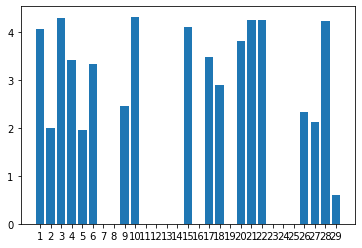

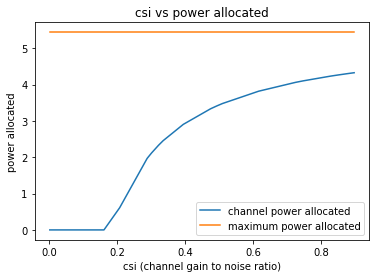

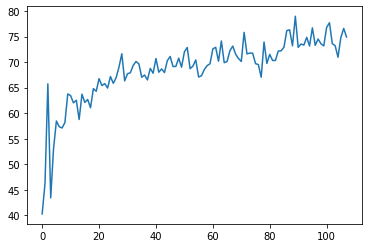

108
Power Allocated= 3.2584138793953406
CSI= 0.8345076811036665
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 1.306826
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.822263

Power Allocated= 2.6894755292159584
CSI= 0.5658510042354855
SNR= 4.5296012076772785
Client: client2


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 3.129764
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.847292

Power Allocated= 2.7594030790051427
CSI= 0.589163358338194
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 1.384838
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.620826

Power Allocated= 3.4176597496268695
CSI= 0.9624032838867186
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1276352048722162
CSI= 0.42935223748811724
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17041828977549267
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9125716183749728
CSI= 0.39305803229841485
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 4.239880


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 1.371056

Power Allocated= 3.416877337971286
CSI= 0.9616791437741169
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09284667653005774
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.126006144621744
CSI= 0.42905214097393984
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.812118667298641
CSI= 0.6080481751316642
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07906790644994566
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3144602205444977
CSI= 0.8754536114232854
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 

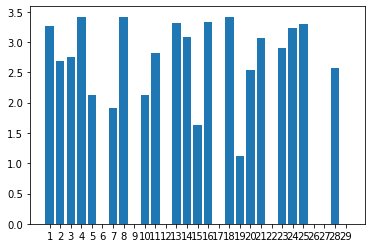

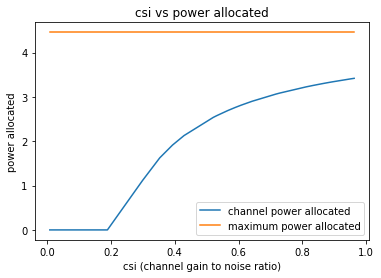

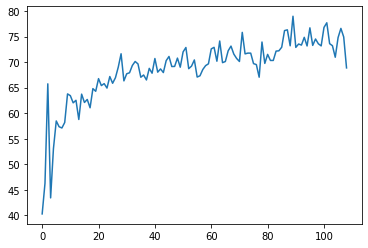

109
Power Allocated= 3.25812417722808
CSI= 0.7876304454661617
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1765975931048116
CSI= 0.29840435321346037
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4027245827375303
CSI= 0.4705814686061017
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.616080
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.433086


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 1.3659718170668764
CSI= 0.316277207568991
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.010735206140075
CSI= 0.39729522477908286
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3816821391354077
CSI= 0.8725447681918934
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.00020661862457371782
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.056835394288291985
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2823941487899977
CSI= 0.8029800257589434
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0734221742859913
CSI= 0.28949149089398074
SNR= 6.445983

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9754957522324612
CSI= 0.39180970601328224
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3055376220018804
CSI= 0.8181849679704043
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8063005275127937
CSI= 0.580904075730836
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.465861209748291
CSI= 0.9417136424372851
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.188891478386436
CSI= 0.7469020404511373
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 0.863601
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 0.398093

Power Allocated= 1.5749932733057452
CSI= 0.3386659830639748
SNR= 13

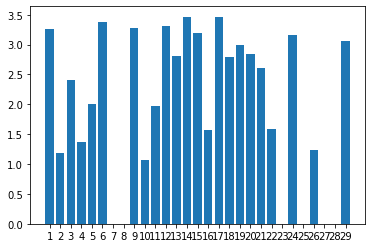

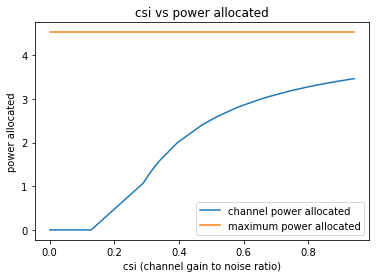

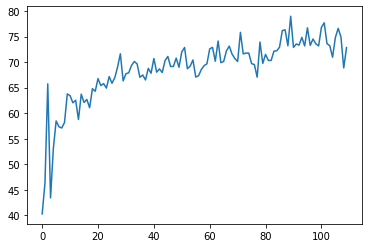

110
Power Allocated= 3.4666164073784542
CSI= 0.8156499343486773
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9114069483971297
CSI= 0.35955371378642464
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3507057910815328
CSI= 0.29922857892778243
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05440448607965964
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14629370134654962
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9399998662730229
CSI= 0.26647958374418546
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.397172167356734
CSI= 0.4356424533448192
SNR= 5.7637

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 4.277883
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 2.208982

Power Allocated= 0
CSI= 0.10458948727074746
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10524737728005407
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6884677862615476
CSI= 0.9958524928485352
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.023973746103114
CSI= 0.5992836807348041
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0437774998404397
CSI= 0.6064814427876255
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7832463455332372
CSI= 0.3437151082472669
SNR= 7.5725046557150355
Client: client13
Poo

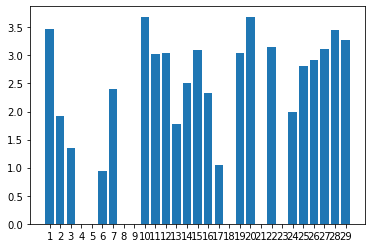

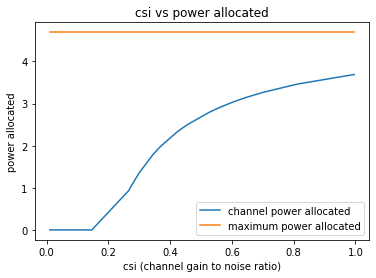

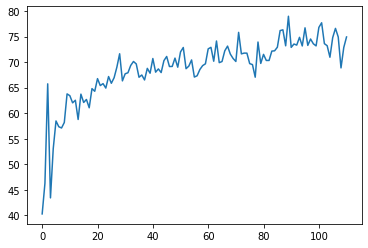

111
Power Allocated= 1.369625428442319
CSI= 0.2869263571429441
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7165925566878686
CSI= 0.8785433814173162
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.381255026183689
CSI= 0.6786169991120293
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.692056348601371
CSI= 0.8600050075061519
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03458628493044558
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12396209496779775
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3477302896394985
CSI= 0.3988656283681018
SNR= 5.763716831

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.255679085940566
CSI= 0.3847395090072503
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.705612
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.701674

Power Allocated= 3.525878163606512
CSI= 0.7524668994386529
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.018548952499127
CSI= 0.3525730914171329
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11787958432050716
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9955601052080816
CSI= 0.2591156785225628
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 2.072851
Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.628139

Power Allocated= 2.20372161759938

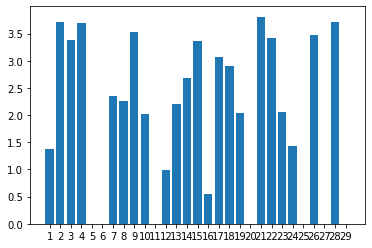

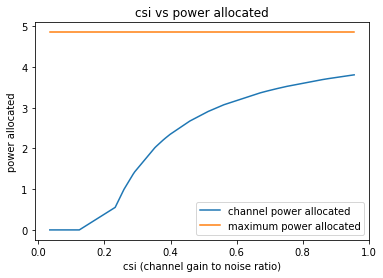

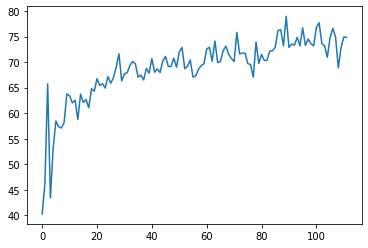

112
Power Allocated= 3.7674843560247617
CSI= 0.878856002121357
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1264703326924956
CSI= 0.5621587810851228
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1590334371151373
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4995642307920427
CSI= 0.7113574851125986
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.686278
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.615263


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 2.1201426635836578
CSI= 0.35904263871727216
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.026048586263118456
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8787003202256676
CSI= 0.9740637362968695
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.167213750547168
CSI= 0.3652149641790363
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.731493033556326
CSI= 0.8519091035939559
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1482749061573656
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1614091807905148
SNR= 7.027128190861585
Client: cli

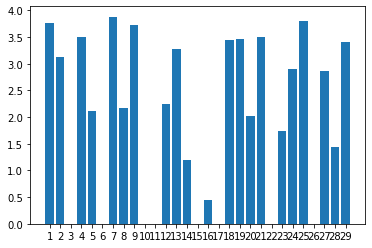

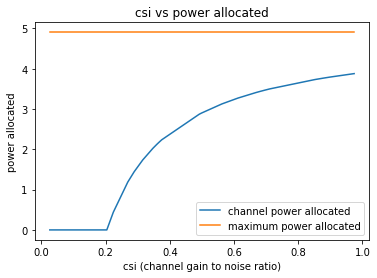

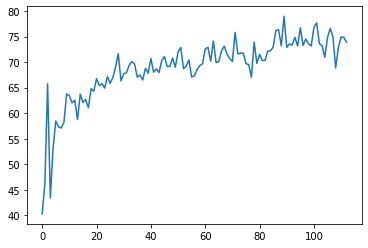

113
Power Allocated= 2.2035791171355728
CSI= 0.551630477544218
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.570790
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.739001

Power Allocated= 2.908829552669615
CSI= 0.9028878188439894
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 1.4613424816543397
CSI= 0.3913826347237337
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.965964371776666
CSI= 0.9519978987036563
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.445718523742637
CSI= 0.6366716498611854
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10265610303407702
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.031137941422336612
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8468949268205233
CSI= 0.8550721668205428
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.7531923675330416
CSI= 0.7916437312257314
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2530484030259794
CSI= 0.567106103177288
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.249159210676336
CSI= 0.3613725097134174
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9886177914323895
CSI= 0.9729812193777193
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15694433415334363
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.906821679309946
CSI= 0.9012539496198836
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.717743898480234
CSI= 0.7700345906276774

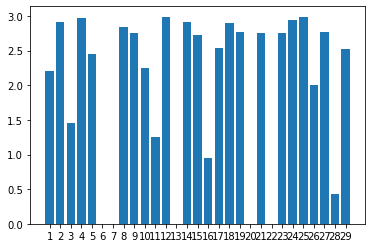

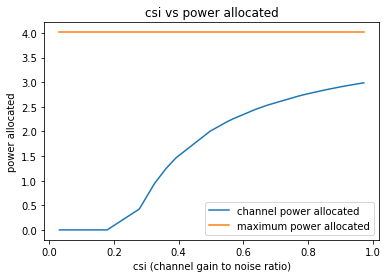

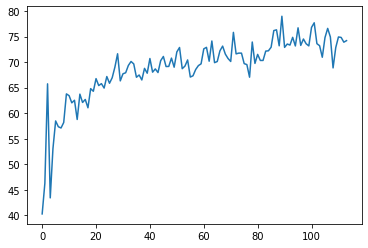

114
Power Allocated= 2.535563726319384
CSI= 0.6013440258650817
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18955449330152685
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7337060701416647
CSI= 0.6826874002254392
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.638345
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.399422


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 2.8101400793928875
CSI= 0.7202715553767557
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9074503670964145
CSI= 0.4364801435470851
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.843573941502183
CSI= 0.738044750411413
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5232780749743755
CSI= 0.5969339358258066
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.455471089763049
CSI= 0.5737121943502291
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9203213576784735
CSI= 0.7823599888668847
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.589313
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.5

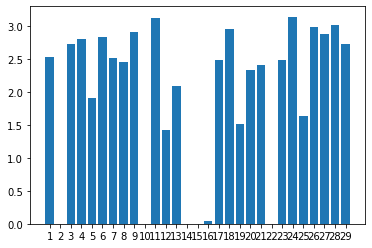

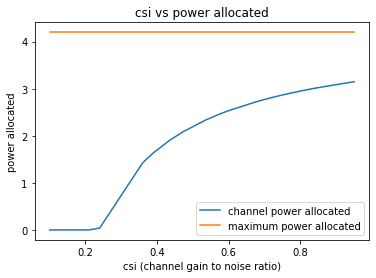

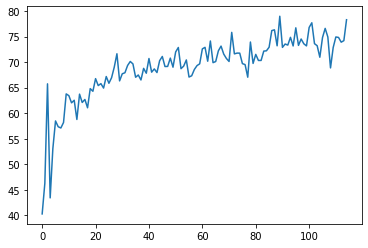

115
Power Allocated= 3.52459970933186
CSI= 0.8839175122978589
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06965359095560308
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.076845209030447
CSI= 0.38773489286569296
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.96481003352267
CSI= 0.5913251553505393
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6084529573167226
CSI= 0.954677599599117
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.745534


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.726446

Power Allocated= 3.0912842957901745
CSI= 0.6391235522738978
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5053324539967647
CSI= 0.8691158912256848
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1369292289949637
CSI= 0.6583288154446423
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.976078
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.572405

Power Allocated= 0
CSI= 0.01265720505357415
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.525016946105927
CSI= 0.8842436239030319
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.486605
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 1.084585

Power Allocated= 2.521002328551195
CSI= 0.468400602

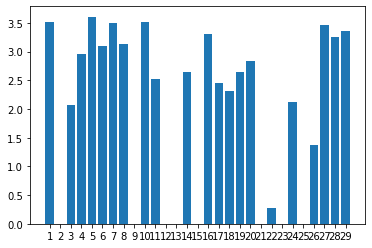

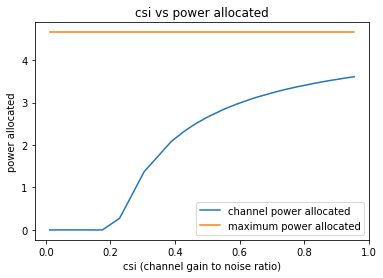

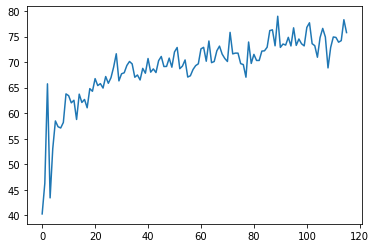

116
Power Allocated= 2.4428898633549254
CSI= 0.5623346521387056
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.237307746377357
CSI= 0.5040620776786009
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10385233172752306
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8279059143165215
CSI= 0.7177285240207169
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.694728139480093
CSI= 0.6551095574334592
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.07124779842634
CSI= 0.8696086394006548
SNR= 5.481605188045396
Client: client6


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Poor Channel, client not taken for averaging in this round

Power Allocated= 0.24943605935625923
CSI= 0.2517779097988091
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.080680540680681
CSI= 0.46717841873281085
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3823214522335139
CSI= 0.35225296657364225
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.613015
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.401097


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 1.272226939103739
CSI= 0.3391022037081709
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.783177
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 0.877015

Power Allocated= 3.047293836670078
CSI= 0.8518638285090799
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.767492
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.431203

Power Allocated= 0
CSI= 0.1065194838883956
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1535457072887167
CSI= 0.9366412155654735
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0950273979063057
CSI= 0.4703308309149902
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.678452700302351
CSI= 0.648198339844823
SNR= 8.858041469455715
Client: client15
Poor 

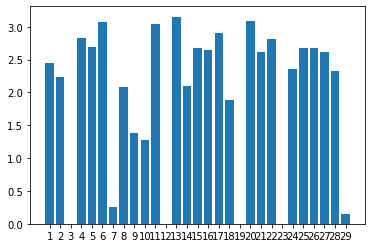

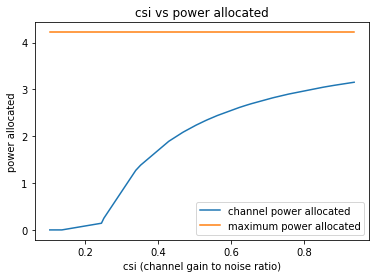

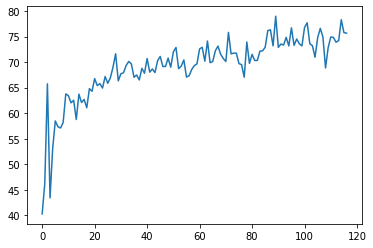

117
Power Allocated= 2.951699384852453
CSI= 0.6045771610826937
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2072760890049723
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4450737130589943
CSI= 0.4628184906544829
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.490619220238588
CSI= 0.8967574346021203
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6148390920918043
CSI= 0.3343465279820831
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5885121660619688
CSI= 0.9830562321108255
SNR= 5.481605188045396
Client: client6


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.685400
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.567567

Power Allocated= 0
CSI= 0.20147014473158364
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.061089444356915656
CSI= 0.22003853393906725
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 25.659178
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 6.206985

Power Allocated= 3.468719053097689
CSI= 0.8794851055076436
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.669315
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.426761

Power Allocated= 0
CSI= 0.10662055255606084
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5621992423126683
CSI= 0.958268617594647
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.691181
Model clie

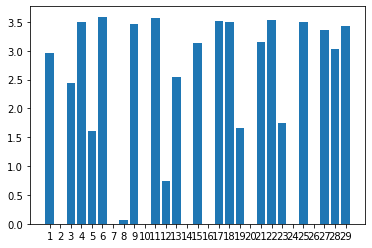

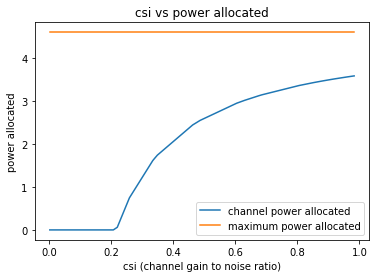

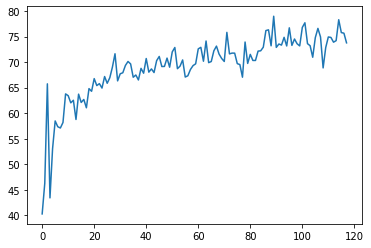

118
Power Allocated= 2.6098564354625013
CSI= 0.5437921408668275
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.529605
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 1.227012

Power Allocated= 2.418332984897176
CSI= 0.4924988990310888
SNR= 4.5296012076772785
Client: client2


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3273776600052116
CSI= 0.8917291717620082
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.489738
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.413085

Power Allocated= 0.5823056908803501
CSI= 0.2586325943901533
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 7.085868
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 2.563977

Power Allocated= 0.7155615249552065
CSI= 0.2678643523470865
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 11.816783
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 2.241517

Power Allocated= 2.1564692264600764
CSI= 0.4362382883967082
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5491687164118555
CSI= 0.25643487019209776
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for ave

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.443821623136297
CSI= 0.49875989497135986
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.038136032302818
CSI= 0.708888870189253
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2594648092757397
CSI= 0.8408098372138009
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.594884
Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.318269

Power Allocated= 3.4351249957786294
CSI= 0.9865149513217647
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.823667090515148
CSI= 0.6153364160986032
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 0.958861
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 0.664591

Power Allocated= 2.098813608399704
CSI= 0.4255353973440965
SNR= 8.858041469455715
Clien

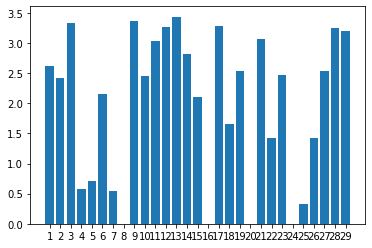

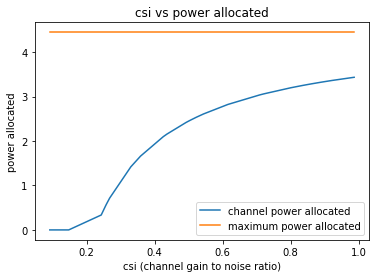

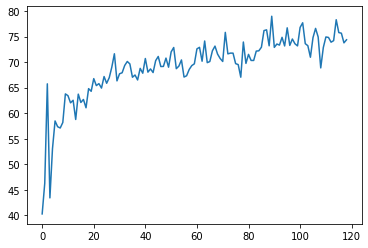

119
Power Allocated= 3.2033535530527533
CSI= 0.875788923029725
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2211147092058465
CSI= 0.3200956205155454
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.176757417921837
CSI= 0.4611644693283542
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2382908606209897
CSI= 0.9034318665486047
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17690334460437607
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.017877767599219
CSI= 0.7534072315848074
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07355659615833676
SNR= 5.763716831

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2330538556612143
CSI= 0.8991776080634546
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.390094
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.974964

Power Allocated= 0
CSI= 0.004345543405705032
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.112634511683318
CSI= 0.8113282963650473
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9051182346603364
CSI= 0.2906923541235452
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9728005025465682
CSI= 0.7286607908334634
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.054920982614955
CSI= 0.7750374623138718
SNR= 7.5725046557150355
Client: client13
Mod

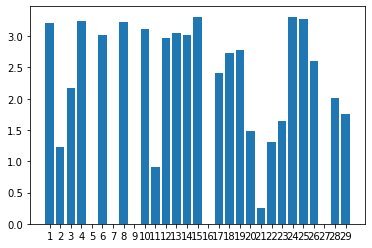

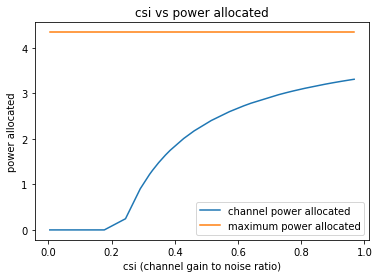

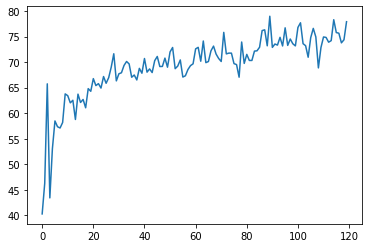

120
Power Allocated= 1.3091108359884998
CSI= 0.2854903325605488
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6851165990505823
CSI= 0.8875163427707708
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.444334108407118
CSI= 0.42238250408501166
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5554128287802467
CSI= 0.7958972544413896
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7052198705367134
CSI= 0.9036390545040717
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5946125903793256
CSI= 0.8215280952152703
SNR= 5.481605188045396
Client: client6


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.917981
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.701837

Power Allocated= 3.133638067376717
CSI= 0.595870020066205
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.997625
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.818572

Power Allocated= 2.845894045195408
CSI= 0.508656735125512
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.323713853178555
CSI= 0.6719786304010409
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1936783070923136
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.621589089771234
CSI= 0.8401474017408483
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08277998921707774
SNR= 7.17942

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.851914311017179
CSI= 0.5102191530931189
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.649309
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.747875

Power Allocated= 0.7275015355611263
CSI= 0.24483670731668816
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.682214451805309
CSI= 0.8852362370425487
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12303856639498822
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7040352743271665
CSI= 0.3217688390006036
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9346160976448119
CSI= 0.2579154033163461
SNR= 13.5454070861005

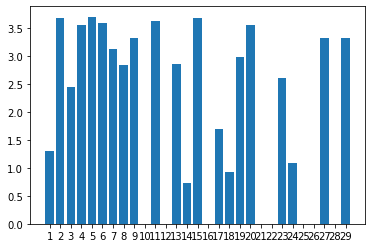

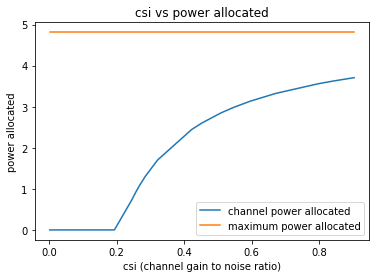

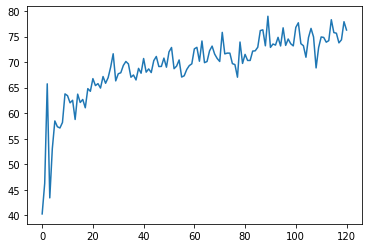

121
Power Allocated= 3.5429440380033603
CSI= 0.8549995155227992
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.896176
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.949151

Power Allocated= 0.9669054106252166
CSI= 0.26697778952628337
SNR= 4.5296012076772785
Client: 

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 7.217487
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 1.503098

Power Allocated= 0.365720566203553
CSI= 0.23005351070039948
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 4.147823
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.676561

Power Allocated= 0
CSI= 0.0019460875924256493
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08850707202430441
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7127536116290942
CSI= 0.5000545728591591
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.291738939870913
CSI= 0.7038306101303187
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4808626207039843
CSI= 0.811903991274095

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1699223641940265
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.639699600175721
CSI= 0.9321091376215423
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.837806
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 0.788219

Power Allocated= 0
CSI= 0.0007683686113627575
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2413726616568757
CSI= 0.6797344793961245
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.024668861648307616
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5299299356912233
CSI= 0.8455905858041293
SNR= 7.593315553337266
Client: client14
Poor Channel, 

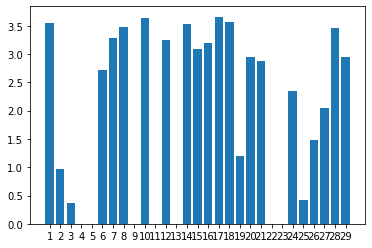

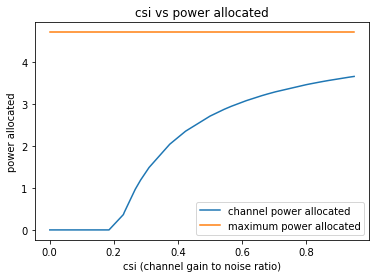

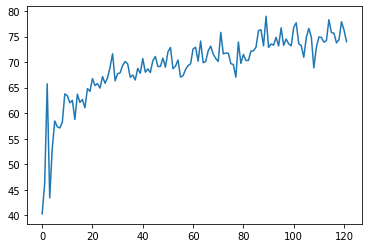

122
Power Allocated= 2.410447856837821
CSI= 0.46792957091863074
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3794981527183756
CSI= 0.856147196106431
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2716258888428174
CSI= 0.7837631169106046
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09520395212656574
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09051390106123525
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5956829704070055
CSI= 0.512337436335885
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 0.6212338159202573
CSI= 0.2546935056236507
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1121060756222074
CSI= 0.6966623827802775
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.777207
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.921418

Power Allocated= 3.5288833445656724
CSI= 0.9817027722554428
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.475890695103394
CSI= 0.9331571110457576
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.855087
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 0.611589

Power Allocated= 2.359653911529532
CSI= 0.45706603051775774
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4605872712968675
CSI= 0.9200187839530056
SNR= 7.179421131547728
Client: 

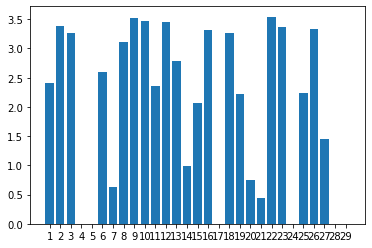

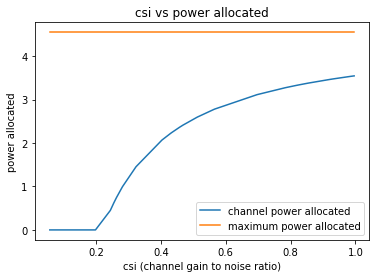

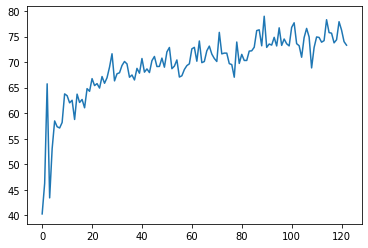

123
Power Allocated= 0
CSI= 0.1694326447914396
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0319001282944521
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8859842727447282
CSI= 0.25172240739773155
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9595260644770978
CSI= 0.5265684706380802
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1673753719690343
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7601515573589133
CSI= 0.9103631284566546
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.367256


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.731969

Power Allocated= 3.1304863569028303
CSI= 0.5786608512246804
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 1.193262
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.539077

Power Allocated= 3.5789776626895513
CSI= 0.7814718277958213
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.667430
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.600703

Power Allocated= 3.841770831067154
CSI= 0.9834355117000997
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.910626
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.375230

Power Allocated= 3.499319954936716
CSI= 0.735675820742999
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8073126220155498
CSI= 0.9512017329352561
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	

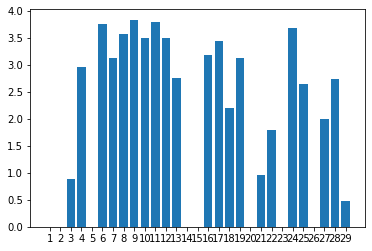

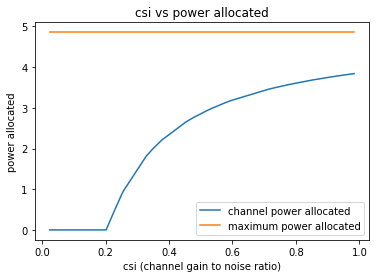

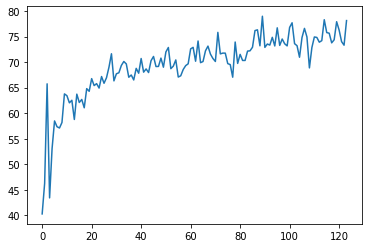

124
Power Allocated= 2.9858873336631193
CSI= 0.5850042748580206
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.651381419070244
CSI= 0.4892618921547559
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6972096528745366
CSI= 0.5004837428332178
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.01701676234146221
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0279646431188287
CSI= 0.5997678027726885
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5905684805652323
CSI= 0.9052165237572607
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 3.559347905846721
CSI= 0.8803369855773386
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.537705910971619
CSI= 0.8638781640951609
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4075533369586575
CSI= 0.23322400954920508
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 26.438675
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 3.609045

Power Allocated= 3.2136113593707734
CSI= 0.674916307082659
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4370433453086129
CSI= 0.23483918130131787
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 1.754859
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.449822

Power Allocated= 1.4589831287895807
CSI= 0.3089954677450457
SNR= 7.179421131547728
Client:

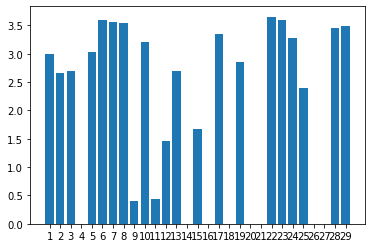

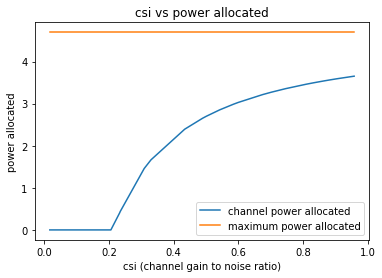

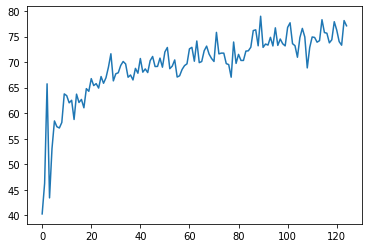

125
Power Allocated= 3.6438142271423812
CSI= 0.9758764767944966
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.31131379367991
CSI= 0.29786547042672973
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9916209470457744
CSI= 0.5963338113166916
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.474050376321402
CSI= 0.4556880500809317
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.222286161759772
CSI= 0.4087893105278908
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.837047


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.722448

Power Allocated= 3.014109857297536
CSI= 0.6044398928019232
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.024118003367862
CSI= 0.3781553170560248
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17818849210869947
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1290249727988797
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.029839040709930487
SNR= 6.445983530041328


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.63457540771562
CSI= 0.9671566441831981
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6579094466111384
CSI= 0.9894870624227327
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3579760145895508
CSI= 0.7630337229343233
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.970824
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.476961

Power Allocated= 0.5121077106698877
CSI= 0.24059129431641935
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2585712617923086
CSI= 0.7092385606728315
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.226486946041976
CSI= 0.4094925056817882
SNR= 13

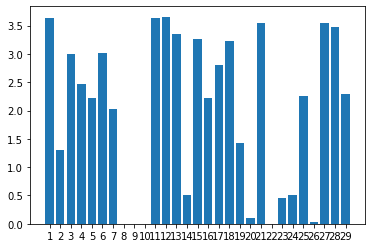

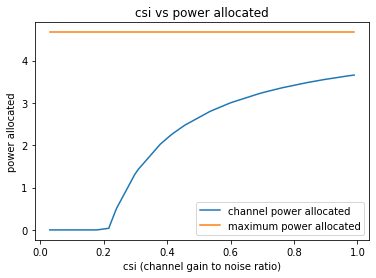

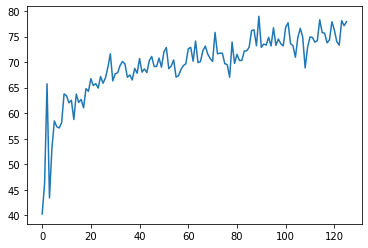

126
Power Allocated= 1.9421657876514025
CSI= 0.37465754107713667
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2579866091470473
CSI= 0.7389435563385954
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3142069932478604
CSI= 0.43533852643633364
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6613253092984017
CSI= 0.5128350735378133
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.467539249758058
CSI= 0.46647650416441666
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9760791800215443
CSI= 0.27508872711161425
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0861973679779018
CS

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)


Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.518315710535814
CSI= 0.9149513946852905
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3026219767958267
CSI= 0.7641474447348121
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 0.487626
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 0.202840


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0.8473841016071804
CSI= 0.26568287188874473
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 5.628614
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 1.504366

Power Allocated= 0
CSI= 0.05876064883090848
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12029972984027015
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6908267413774656
CSI= 0.5207131347432176
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 0.671794
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.507985

Power Allocated= 0
CSI= 0.14400016732780896
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4267274066557945
CSI= 0.8442077584306111
SNR= 15.73789526637954
Client: client21
Model client21 Train Epoch: 1

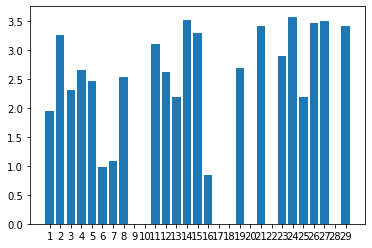

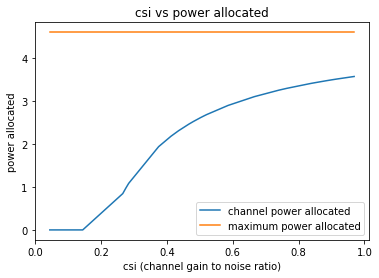

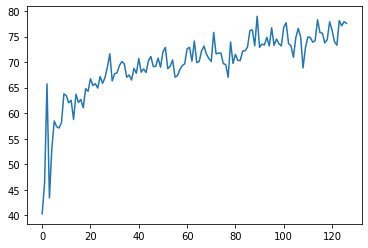

127
Power Allocated= 2.48977487064064
CSI= 0.585592178692278
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1687357227999295
CSI= 0.9720891537586375
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.611624368669475
CSI= 0.3867239848006032
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04412609692203939
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.22877025226933012
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1611496512392332
CSI= 0.32934840422829303
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.699321


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.521337

Power Allocated= 1.9959646142340928
CSI= 0.45423918637316507
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.265802269184844
CSI= 0.5176932856164127
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.746999833857213
CSI= 0.6894421025721357
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.014022551998832178
CSI= 0.2390385639682674
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 1.109221
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 0.695635

Power Allocated= 3.1877451592301718
CSI= 0.9903904470814899
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3335828689931892
CSI= 0.5365195202738557
SNR= 7.179421131547728
Clie

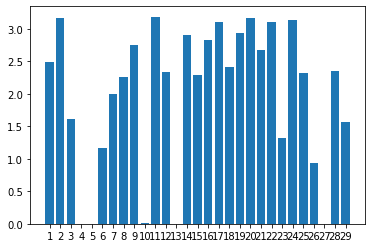

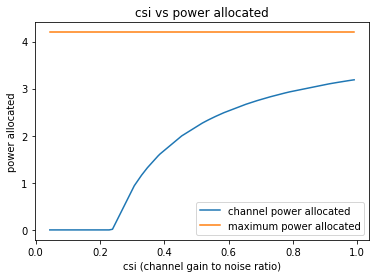

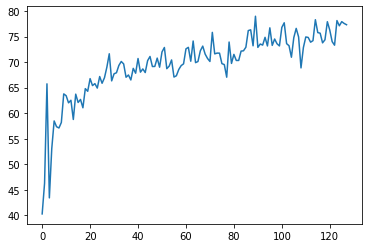

128
Power Allocated= 1.5861021350426996
CSI= 0.354322017769639
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16778347980767083
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1883490303669446
CSI= 0.8196422000902983
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.934482439346306
CSI= 0.6784669519633573
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 1.102292


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.912759

Power Allocated= 3.3079745209327456
CSI= 0.908744710032683
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2038674002218768
CSI= 0.8302019629320564
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1389661398040608
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08989393318094274
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2887418655744494
CSI= 0.8931348792522523
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3397383556601907
CSI= 0.9357554952552911
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.790712
Model client10 Train Ep

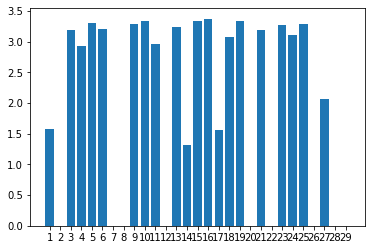

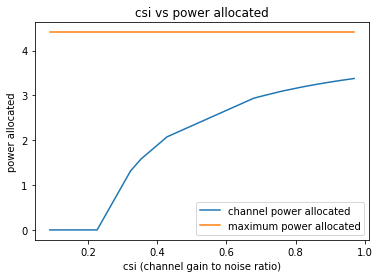

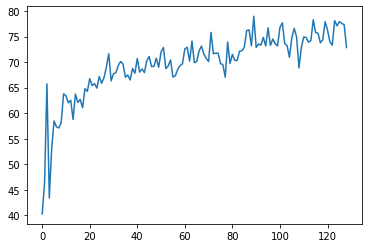

129
Power Allocated= 3.530163035969877
CSI= 0.63597111792241
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.199651009366715
CSI= 0.344481859876671
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.214933142426834
CSI= 0.529765302304143
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2381372390888337
CSI= 0.3491102971653276
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.621144474369573
CSI= 0.28723936164433317
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19048875847081204
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 3.848151381189546
CSI= 0.7971874558980883
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10043795792225241
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.012567824690798
CSI= 0.917436527953461
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07788362557780082
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1184981947702003
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1734170880392537
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.089296418256421
CSI= 0.9869085908181698
SNR= 7.5725046557150355
Client: client13
Poor Channe

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.446219

Power Allocated= 3.650050514263865
CSI= 0.688462957974688
SNR= 15.719034446696819
Client: client20
Model client20 Train Epoch: 1 [0/384 (0%)]	Loss: 0.823018
Model client20 Train Epoch: 2 [0/384 (0%)]	Loss: 0.521822

Power Allocated= 3.1229413757722133
CSI= 0.5051474244482927
SNR= 15.73789526637954
Client: client21
Model client21 Train Epoch: 1 [0/384 (0%)]	Loss: 0.790418
Model client21 Train Epoch: 2 [0/384 (0%)]	Loss: 0.145800

Power Allocated= 3.992443152941213
CSI= 0.900804869481976
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 [0/384 (0%)]	Loss: 0.731829
Model client23 Train Epoch: 2 [0/384 (0%)]	Loss: 0.503475

Power Allocated= 4.017041219567142
CSI= 0.9212172550305431
SNR= 16.727271644180114
Client: client24
Model client24 Train Epoch: 1 [0/384 (0%)]	Loss: 0.634098
Model client24 Train Epoch: 2 [0/384 (0%)]	Loss: 0.316882

Power Allocated= 0
CSI= 0.038666503834040356
SNR= 19.824374113130002
Client

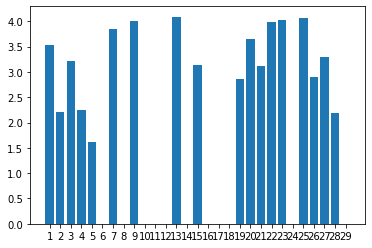

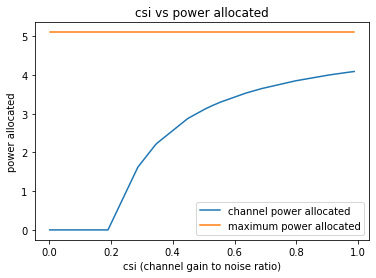

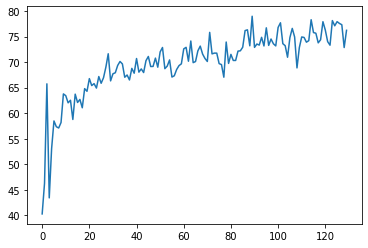

130
Power Allocated= 3.546227977005586
CSI= 0.9078726618355494
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1779214001567153
CSI= 0.40489393123631856
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3777993229286265
CSI= 0.7874606583614934
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3410670345208437
CSI= 0.3024220681298767
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 1.676675


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.921282

Power Allocated= 2.5155336303722655
CSI= 0.4690056658704518
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.781977
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.793451

Power Allocated= 3.2756144451204703
CSI= 0.7288153834513158
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20202656128637686
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2065435096877115
CSI= 0.693885228596053
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.872770
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.693323


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 1.2941427008445157
CSI= 0.29819046100379476
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 3.445468
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.952382

Power Allocated= 1.7789049824732053
CSI= 0.34857791778600655
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1795403994211756
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.770219828967821
CSI= 0.5326276499206855
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.63803922071446
CSI= 0.9904277009916055
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0381570751833604
CSI= 0.383208279330589
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Pow

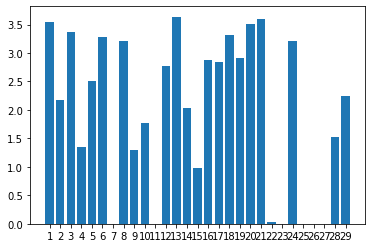

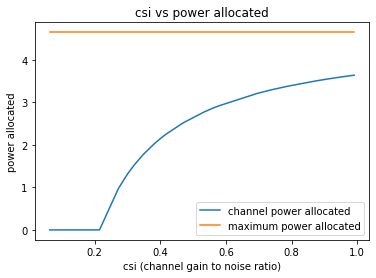

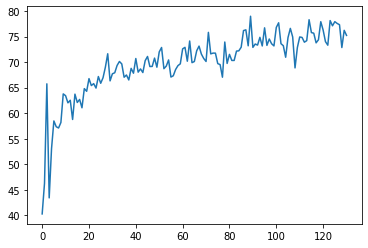

131
Power Allocated= 2.85450638739269
CSI= 0.5909508293987308
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1277104488799092
CSI= 0.2924845420536749
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.579158319057784
CSI= 0.5082498521339625
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3353850036540216
CSI= 0.8255528081076681
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12840078020532442
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.018663341926768
CSI= 0.6544368941640694
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 2.50498672611432
CSI= 0.489786044213686
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.237221107520443
CSI= 0.7636657340445099
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.943293
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.809331

Power Allocated= 2.274271180370523
CSI= 0.44005884291549646
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 1.175402
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.433000

Power Allocated= 3.3688702905616053
CSI= 0.8490230943948612
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3529008595628227
CSI= 0.8376656749377445
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1780061142226459
SNR= 7.179421131547728
Client: client12
Poor Channel,

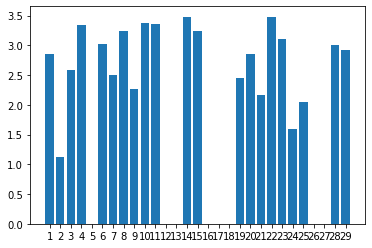

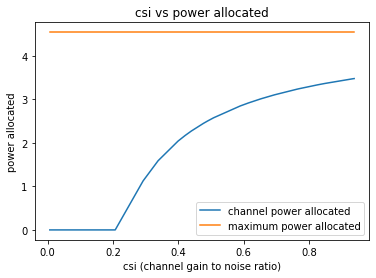

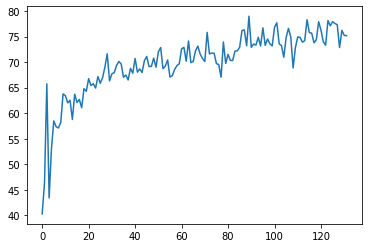

132
Power Allocated= 1.4512678458312442
CSI= 0.3150944862186983
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6711308666978515
CSI= 0.33854830923271195
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 0.707635
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.682565


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.3058334177488797
CSI= 0.7581008882214263
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2452917083721102
CSI= 0.7248334095297956
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4515693671975116
CSI= 0.46011923507272634
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08553603403070642
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0843323724881353
CSI= 0.6491033614425672
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5620578744240263
CSI= 0.48476359199229824
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 0
CSI= 0.037585062551436454
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0518871504844864
CSI= 0.3886465592515954
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.509614049643437
CSI= 0.3209958560777594
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8859149074244943
CSI= 0.5750417537914898
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.973897
Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.463825

Power Allocated= 2.602407773344278
CSI= 0.4944348170817615
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.485272580591674
CSI= 0.8774650864383469
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round



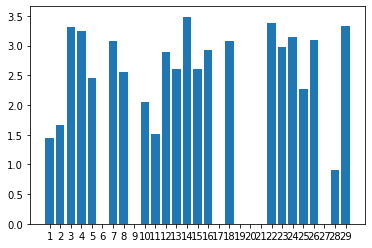

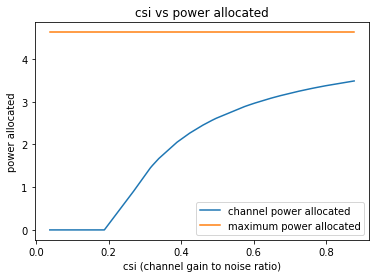

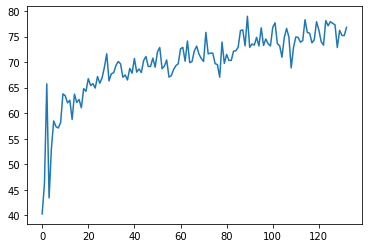

133
Power Allocated= 3.6068296551340158
CSI= 0.9985368681496701
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20781535648661353
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09624498547565319
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.339488117894095
CSI= 0.7881420479212847
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14458843172524294
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8698463492096877
CSI= 0.5752255261076067
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6604016697323583
CSI= 0.3392253081823131
SNR= 5.763716831196649
Client:

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 1.717279
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.871799

Power Allocated= 3.389191561510168
CSI= 0.82027498662417
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1597931698914623
CSI= 0.6903685082994573
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.976399040218297
CSI= 0.6127841890679673
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09466124282978372
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.859376487931216
CSI= 0.571781951316296
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1817218801415612
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not 

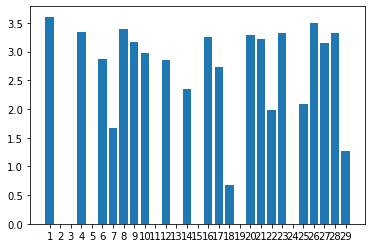

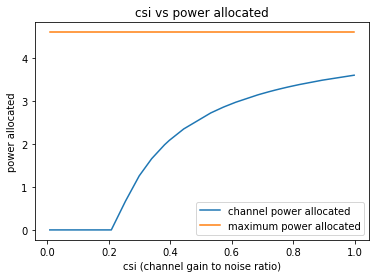

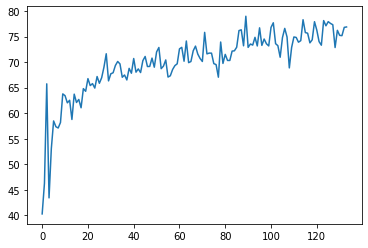

134
Power Allocated= 2.811446435113217
CSI= 0.6773459307295393
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8154839705642742
CSI= 0.6792034218224069
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.511641791388122
CSI= 0.5630138822313288
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.568634
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.531423


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.0473609517635403
CSI= 0.4463416985540851
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3741040968056293
CSI= 0.3432070768163311
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0942792460522655
CSI= 0.4558887340395681
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6264826360635056
CSI= 0.6019330620865906
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.613100582880989
CSI= 0.5971231750504636
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.546079
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.406093

Power Allocated= 3.0016834618835553
CSI= 0.777536372053443
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.63

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.347043

Power Allocated= 3.133993547732738
CSI= 0.8666987941124259
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02458653110296971
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09568946480088691
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.067563092004799
CSI= 0.8195150543390144
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6288702359063079
CSI= 0.3760916020154639
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.473453757339279
CSI= 0.551163647044659
SNR= 14.92795654834405
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated

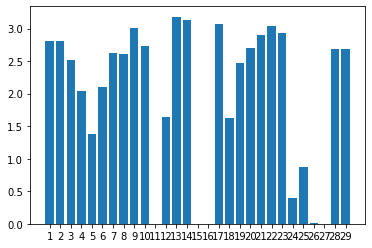

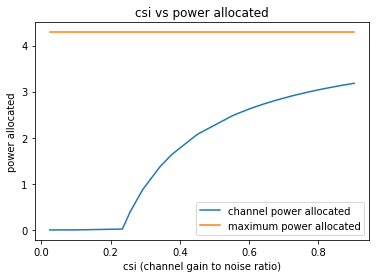

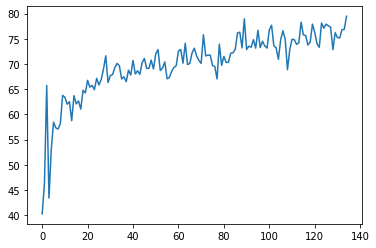

135
Power Allocated= 3.4359793449565323
CSI= 0.9690893196292348
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7299176204119995
CSI= 0.5753877814289409
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 1.167109
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.430860


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0.4528818142545692
CSI= 0.24906636492354417
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 7.479486
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 1.577583

Power Allocated= 2.4705110244123207
CSI= 0.5006596322450698
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1380185524396738
CSI= 0.7519603120374422
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.942100927646827
CSI= 0.6554046114831966
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.373192950148583
CSI= 0.9135064491315723
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.765474
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.804816

Power Allocated= 2.8587999385143306
CSI= 0.6214746720083614
SNR= 5.793773047542457
Client: clie

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 3.076570696514685
CSI= 0.7187495208923246
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 [0/384 (0%)]	Loss: 0.962565
Model client23 Train Epoch: 2 [0/384 (0%)]	Loss: 0.837906

Power Allocated= 2.910319415853952
CSI= 0.6420312612122686
SNR= 16.727271644180114
Client: client24
Model client24 Train Epoch: 1 [0/384 (0%)]	Loss: 0.939844
Model client24 Train Epoch: 2 [0/384 (0%)]	Loss: 0.173605

Power Allocated= 1.9477640363210038
CSI= 0.3968077710899145
SNR= 19.824374113130002
Client: client25
Model client25 Train Epoch: 1 [0/384 (0%)]	Loss: 1.202140
Model client25 Train Epoch: 2 [0/384 (0%)]	Loss: 0.298067

Power Allocated= 0.6793699894560272
CSI= 0.2639562942938647
SNR= 20.183965356389123
Client: client26
Model client26 Train Epoch: 1 [0/384 (0%)]	Loss: 0.551517
Model client26 Train Epoch: 2 [0/384 (0%)]	Loss: 0.114554

Power Allocated= 2.8421638685400863
CSI= 0.615115061281313
SNR= 20.470751680587888
Client: client27
Model client27 Train Epoch: 1

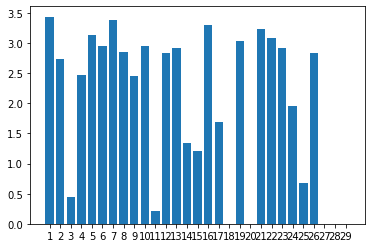

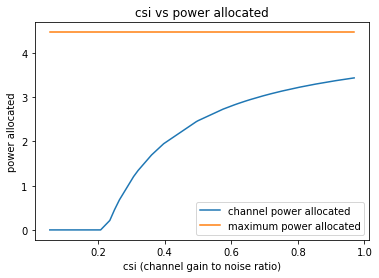

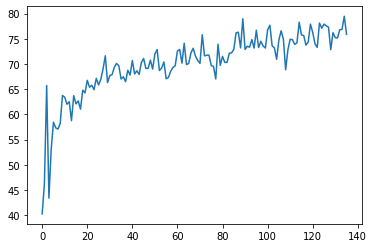

136
Power Allocated= 2.749947835277231
CSI= 0.5469300188520002
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19626283642832887
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.864683045669796
CSI= 0.5835489594752723
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8120284140532759
CSI= 0.36149278983973776
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8603240043427411
CSI= 0.2689609890428911
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 8.618629


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 2.149265

Power Allocated= 2.999484454639435
CSI= 0.6333720452406505
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.519948317123129
CSI= 0.9448339783583017
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8450466736855127
CSI= 0.5769379518501713
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09245509163378396
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12308355982679908
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5252555070820772
CSI= 0.32753811304248004
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.

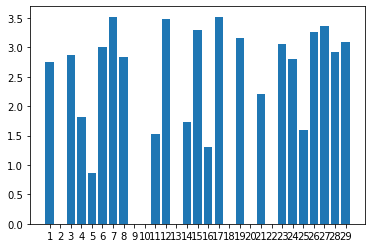

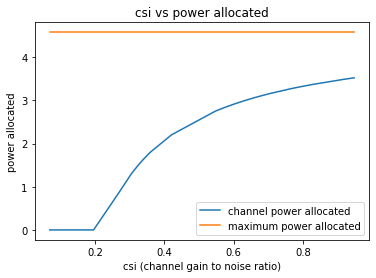

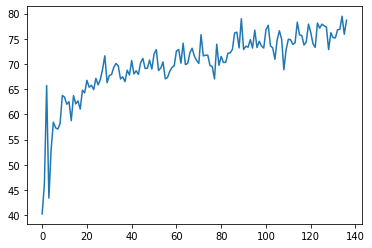

137
Power Allocated= 3.183434061896558
CSI= 0.721658544268825
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.337576231954549
CSI= 0.8119817855408006
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1001602454202795
CSI= 0.6807487691904588
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.147795454592492
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.31613006002678
CSI= 0.7980840292851595
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.339277637306546
CSI= 0.8131050984919723
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1124542486474587
CSI= 0.40705396803858596
SNR=

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.14411481564565243
CSI= 0.22598787650603802
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 93.768570
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 13.004627

Power Allocated= 2.942020691764779
CSI= 0.6145865002963429
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0267224727551483
CSI= 0.6483366850703991
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 1.202768
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 1.090421

Power Allocated= 2.9567913309723073
CSI= 0.6202167256801777
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.880473
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.487507

Power Allocated= 1.0910630986200194
CSI= 0.2875159549378389
SNR= 7.179421131547728
Client: client12
Poor Channel, 

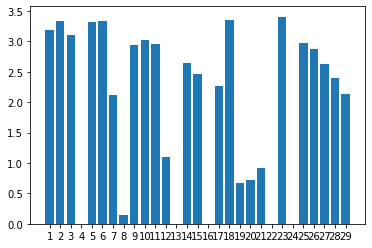

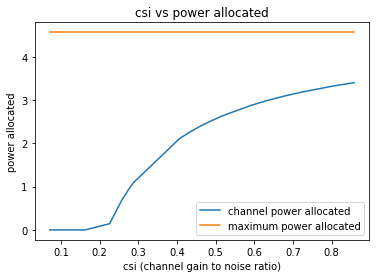

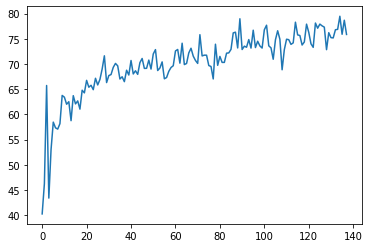

138
Power Allocated= 1.3142606198109714
CSI= 0.24772300584375684
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 2.489351
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.897635

Power Allocated= 1.1000154293234248
CSI= 0.2352381050776695
SNR= 4.5296012076772785
Client: client2


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 6.484594
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 1.904222

Power Allocated= 2.6961224438544718
CSI= 0.37666131840881933
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7007037395430729
CSI= 0.2150387959213258
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 1.157815
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.721817

Power Allocated= 2.6187886127610756
CSI= 0.366000221383736
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07617576622127142
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.6497622482140537
CSI= 0.3701969058287454
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3385684271006326
CSI= 0.1995028799144697
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.804495
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 3.032199

Power Allocated= 3.0378997077674694
CSI= 0.43231508772401284
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3188545767434396
CSI= 0.49208413275874263
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.532971862094003
CSI= 0.5500382032655835
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.750366960535189
CSI= 0.6247421233487026
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in

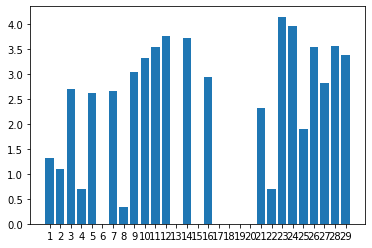

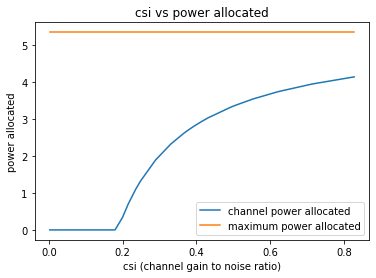

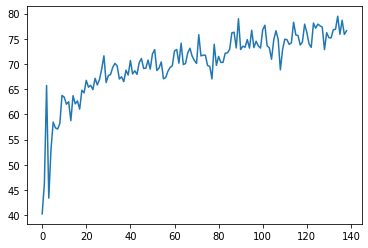

139
Power Allocated= 1.3169901518321772
CSI= 0.3448361328762638
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9576142271531647
CSI= 0.7940894026482644
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19113477708564497
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.784867871082447
CSI= 0.6982994428682836
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.900712401989087
CSI= 0.7597595631891999
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.996182170125672
CSI= 0.8191778674244884
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.939307


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.634985

Power Allocated= 0
CSI= 0.015128696780937978
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.232017852174198
CSI= 0.5038036104652258
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9921353541491205
CSI= 0.310098392417531
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.730739
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.588480

Power Allocated= 3.133172039320196
CSI= 0.9227252340446119
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1720540256772053
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1428906030807786
CSI= 0.9310747060793035
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoc

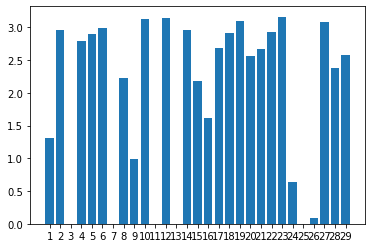

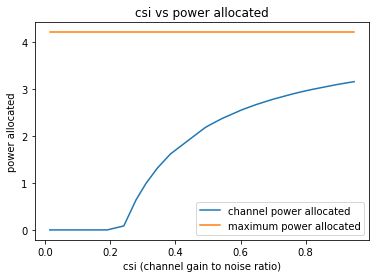

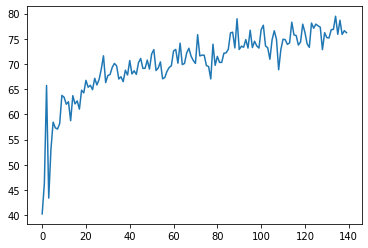

140
Power Allocated= 2.633770722105467
CSI= 0.5064511215198971
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11009716305570427
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5543193528485033
CSI= 0.9487885875605706
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3605456450851525
CSI= 0.8014430554181552
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3543768593924996
CSI= 0.797500269548668
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.360612418125873
CSI= 0.8014859467701039
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 3.531847905516387
CSI= 0.9289820831322094
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.780774
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.641687

Power Allocated= 3.433530568073906
CSI= 0.8512345383160931
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.753016155579554
CSI= 0.5390025549342254
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.098844410734266
CSI= 0.6624927327237816
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2855505835954317
CSI= 0.4305252109087271
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4749840943217016
CSI= 0.3191512276195728
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in thi

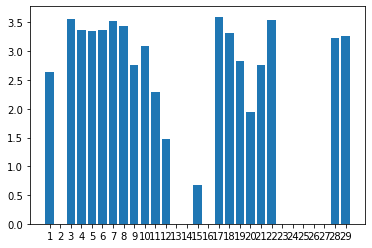

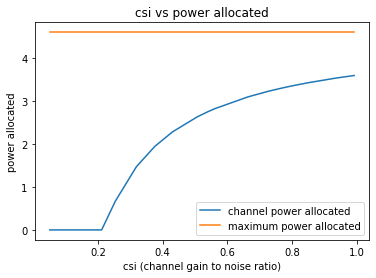

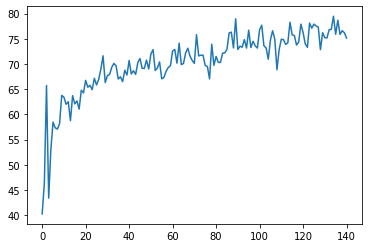

141
Power Allocated= 0.7138777973568189
CSI= 0.24063799849097434
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.825793
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.750500

Power Allocated= 0
CSI= 0.08144629791776792
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.496269789896541
CSI= 0.2964519728485251
SNR= 4.644858008883832


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4006116487586251
CSI= 0.22376942273291733
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1051480400102669
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16547959564352976
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9227294247169087
CSI= 0.5136718796681319
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5026628803039905
CSI= 0.7316174240124207
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2514951953218487
CSI= 0.6180461035016335
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 1.202696
Model

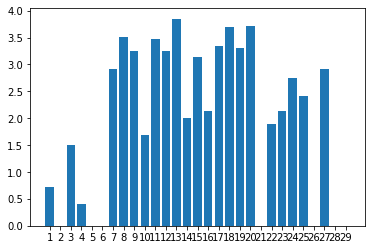

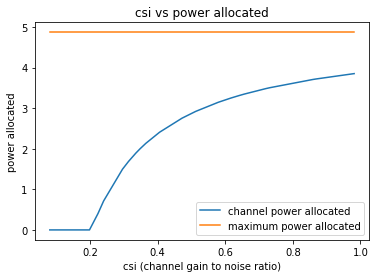

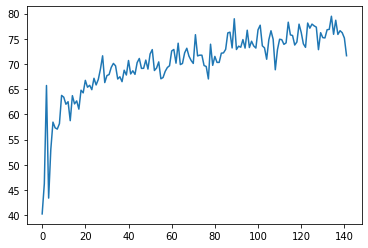

142
Power Allocated= 1.1463560634083985
CSI= 0.27814650535476804
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8851057928677863
CSI= 0.3500814766922177
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5039151109484461
CSI= 0.23597881278177057
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1733973696741744
CSI= 0.6376793291120059
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.708329


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.674583

Power Allocated= 1.87397274001084
CSI= 0.34872233988682544
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 3.577481
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 1.025576

Power Allocated= 3.468208125656387
CSI= 0.7853142692730417
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6805967919272637
CSI= 0.9425187085757729
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.727774068528801
CSI= 0.9863784874936543
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3083728888056823
CSI= 0.6977340666827179
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6216906435492788
CSI= 0.3205238081713703
SNR= 6.445983530041328
Client: clie

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5535933911079436
CSI= 0.8417577162156953
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1786568269341735
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.252907324048296
CSI= 0.6717376748735981
SNR= 13.545407086100507
Client: client18
Model client18 Train Epoch: 1 [0/384 (0%)]	Loss: 0.875984
Model client18 Train Epoch: 2 [0/384 (0%)]	Loss: 0.326615

Power Allocated= 3.717334818721101
CSI= 0.9763252165209838
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 1.252793
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.255155

Power Allocated= 0
CSI= 0.1569473743626485
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3339228638210536
CSI= 0.4153408941832259

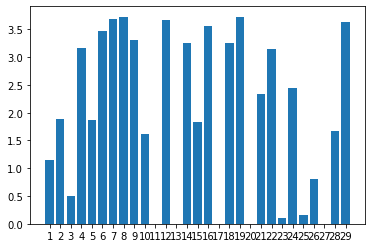

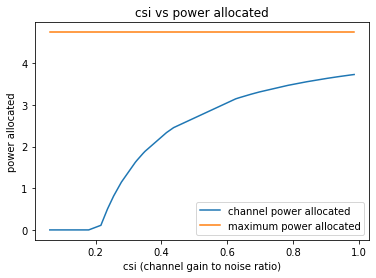

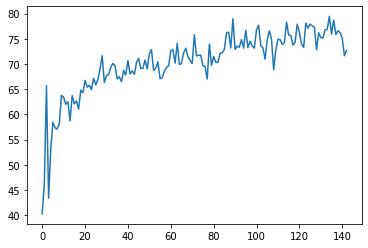

143
Power Allocated= 4.1455701740497695
CSI= 0.9884085357407725
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7427142752918012
CSI= 0.7069219603042189
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12486021620305021
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07707026080058377
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07892701962123494
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09601143876612594
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.567070026698973
CSI= 0.628840822431538
SNR= 5.763716831196649
Client: client7
Poor Cha

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 0
CSI= 0.016397547991525263
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4457255547232664
CSI= 0.5842582067992337
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0437973180472353
CSI= 0.24310196603234913
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.782846
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 0.571480


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0
CSI= 0.16108496336415945
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6875661924730871
CSI= 0.2882067484322772
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.679473
Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.408420

Power Allocated= 3.726400313232177
CSI= 0.6988621936535769
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.416961014065629
CSI= 0.5746015005557725
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.964439037322575
CSI= 0.8383223722820891
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 0.635796
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 0.319912

Power Allocated= 0
CSI= 0.13388424735648186
SNR= 13.12832021207836
Client: client16
Poor Channel, clien

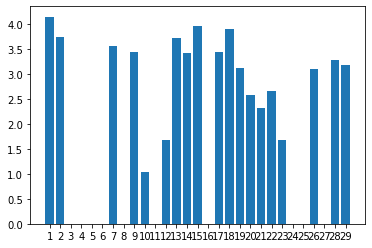

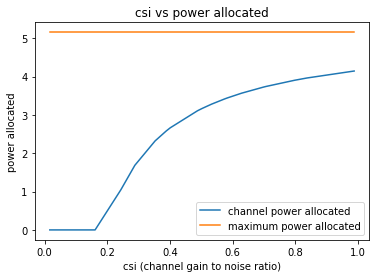

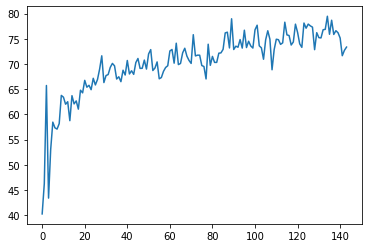

144
Power Allocated= 3.039163358665406
CSI= 0.8328891851368435
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2178503730364625
CSI= 0.9785186772402762
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0422814011105785
CSI= 0.8350578167853042
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 1.102733
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.456652


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 1.0090552293862705
CSI= 0.3095258393599952
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.067232434011631
CSI= 0.8528269394394048
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5079687677179114
CSI= 0.5774223789142442
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.062237942485868114
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.988485049219271
CSI= 0.7991572254704722
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2211728981743994
CSI= 0.49538539219826205
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7712413058782723
CSI= 0.40509414520142084


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.545015
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 0.422807

Power Allocated= 2.2685045672134176
CSI= 0.5072797932648965
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.561243632712158
CSI= 0.3733349763474134
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.870759
Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.416292

Power Allocated= 3.12217930532739
CSI= 0.8947553280978754
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.820641
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.525488

Power Allocated= 2.495369706302209
CSI= 0.5732519822003259
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1554356765186955
CSI= 0.32421557051083316
SNR= 8.858041469455715
Client: client15
Model client15

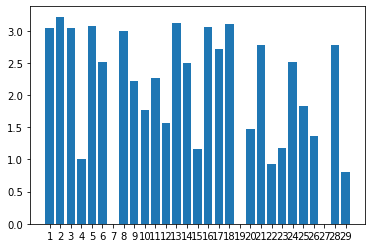

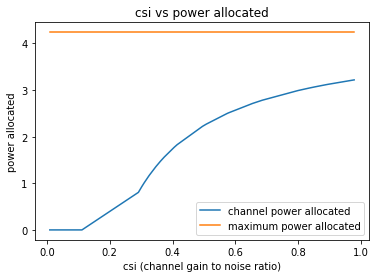

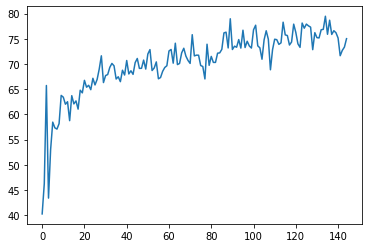

145
Power Allocated= 2.9919376703273306
CSI= 0.922759254188292
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0619934868447483
CSI= 0.9865333609831176
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9120996466747076
CSI= 0.3161011522415922
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 1.046031
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.641156


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.834701115424057
CSI= 0.8058388917936344
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7584884935296152
CSI= 0.30146310976273627
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.857599
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.567825

Power Allocated= 0
CSI= 0.081489589419942
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08958279521665025
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9489194320097134
CSI= 0.8875283909105585
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8844937746219701
CSI= 0.3133666372610494
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.21986

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.735723006427066
CSI= 0.7463126862031638
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.514918
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.444677

Power Allocated= 2.2974893166828805
CSI= 0.5623807852713258
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.720877579875281
CSI= 0.7381346487217599
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.357999153016019
CSI= 0.582192546875852
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 1.260560
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 0.485469

Power Allocated= 2.9147510773623546
CSI= 0.8614059247559078
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 0.711932
Model client1

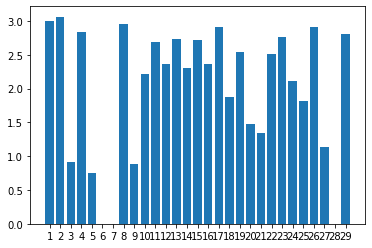

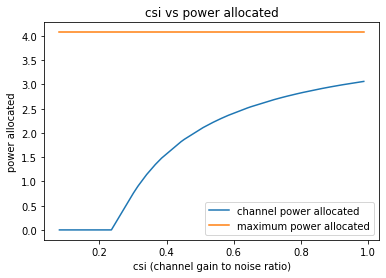

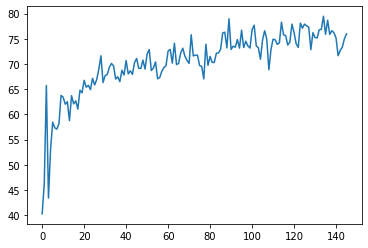

146
Power Allocated= 0
CSI= 0.16038134726876052
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.08817191718369
CSI= 0.7922032719701203
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13062007772928141
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.173890608372838
CSI= 0.314803615464199
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.202839016410977
CSI= 0.8713570417050724
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1937611186721275
CSI= 0.8645186214997796
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2914424170586614
CSI= 0.48566515945251243
SNR= 5.7637168311

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.18015476596272
CSI= 0.8544675662674251
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7945506178173232
CSI= 0.3912480037785181
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04995866852613895
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3080832560248163
CSI= 0.9593329682688191
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8521877434942704
CSI= 0.6674291117903324
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.625642249276976
CSI= 0.5797666251497307
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client18 Train Epoch: 2 [0/384 (0%)]	Loss: 0.647737

Power Allocated= 2.232469676085618
CSI= 0.47214252279059443
SNR= 14.92795654834405
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0168073396079507
CSI= 0.2999699854159763
SNR= 15.719034446696819
Client: client20
Model client20 Train Epoch: 1 [0/384 (0%)]	Loss: 0.783127
Model client20 Train Epoch: 2 [0/384 (0%)]	Loss: 0.266215

Power Allocated= 0
CSI= 0.1266309736251764
SNR= 15.73789526637954
Client: client21
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4302421580750826
CSI= 0.5207703950811509
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 [0/384 (0%)]	Loss: 0.998689
Model client23 Train Epoch: 2 [0/384 (0%)]	Loss: 0.359790

Power Allocated= 3.2012465838182744
CSI= 0.8701496417683536
SNR= 16.727271644180114
Client: client24
Model client24 Train Epoch: 1 [0/384 (0%)]	Loss: 1.067392
Model client24 Train Epoch: 2 [0/384 (0%)]	

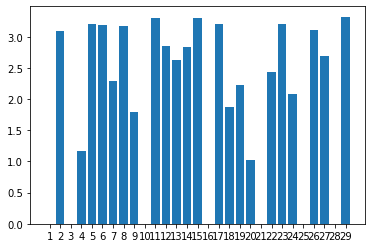

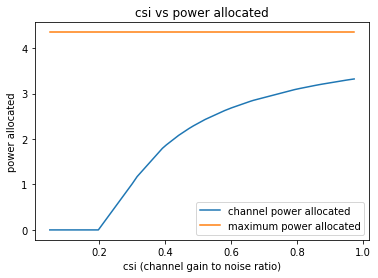

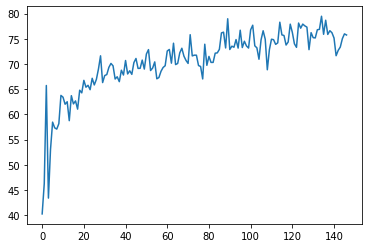

147
Power Allocated= 3.564132860010008
CSI= 0.7987891121915071
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8035215472845163
CSI= 0.4968928808569948
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.254127175028581
CSI= 0.640245622686838
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0714354236238286
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7633616789209032
CSI= 0.9499688806066341
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.758115


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.735921

Power Allocated= 0
CSI= 0.09213528281311023
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.716642274961993
CSI= 0.24393900218715858
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 8.588576
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 1.876419

Power Allocated= 3.644933707349019
CSI= 0.8539023954062658
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.804354531911769
CSI= 0.9884614831041068
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6947022100957003
CSI= 0.47140336820167905
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4244195764741363
CSI= 0.7185930824351512
SNR= 7.027128190861585
Client: client11
Poor Cha

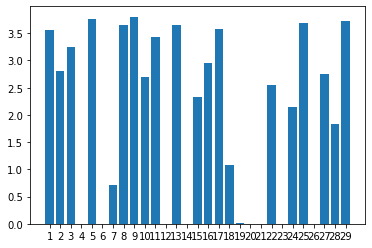

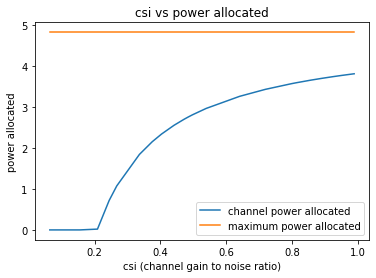

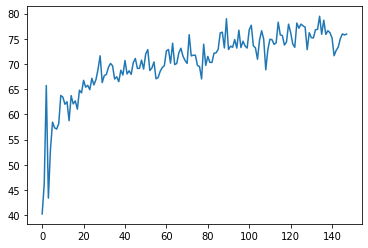

148
Power Allocated= 2.319660317153018
CSI= 0.4594020524638993
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.013883439591061641
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.138792567616269
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6506559372242373
CSI= 0.5417860802430426
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.930280360882934
CSI= 0.6385196491737365
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20250650955036742
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.056607089376998876
SNR= 5.763716831196649
Client: client7


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.00585670422250173
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8421014949850187
CSI= 0.6044847755370291
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8216922693270092
CSI= 0.5971180901353255
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.480446743490602
CSI= 0.984294465410079
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.568015680701604
CSI= 0.5185680560197906
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.764806


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.398304

Power Allocated= 3.430959015605814
CSI= 0.9385759640457233
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.683816
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.636901

Power Allocated= 2.638731503605128
CSI= 0.5383083434163289
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 0.636338
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 0.389964

Power Allocated= 3.36007695516746
CSI= 0.8800292065614743
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 1.228560
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 0.728214

Power Allocated= 0
CSI= 0.13297402004260683
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0640227897212142
CSI= 0.6981387191805456
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss:

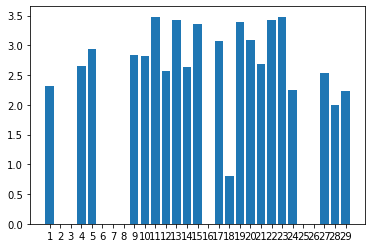

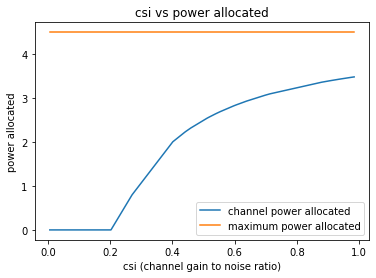

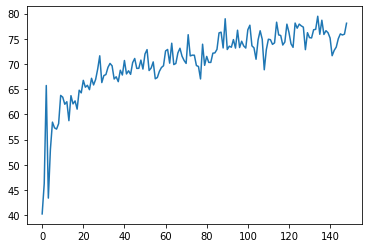

149
Power Allocated= 3.03783020290296
CSI= 0.7230468278024298
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0640925228606575
CSI= 0.737042443578083
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07935077005102786
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.726798327232167
CSI= 0.5902950200451684
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.059244940195371854
CSI= 0.22927252826032418
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 86.057899


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 6.253332

Power Allocated= 2.707287942263685
CSI= 0.5835740657577797
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03389481487783763
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0463684954947815
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.10565496773359
CSI= 0.431925977585607
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.896882
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.471021

Power Allocated= 3.1985956520638146
CSI= 0.8181492751848769
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.26919728386916
CSI= 0.8683048872211472
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken

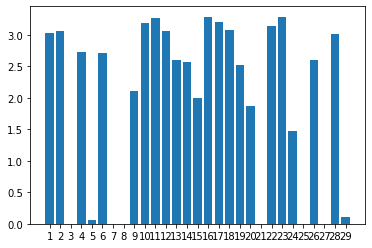

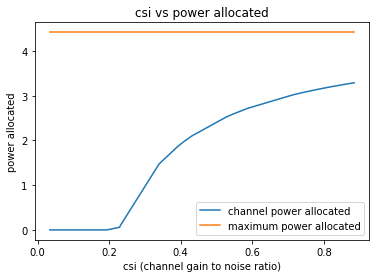

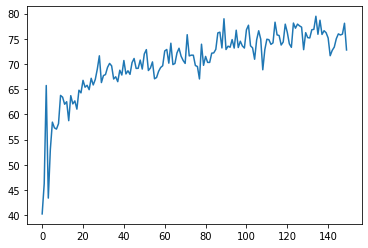

150
Power Allocated= 1.8430350133565123
CSI= 0.46196636450534156
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3314664204839946
CSI= 0.5965774280827636
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.524897847653527
CSI= 0.674401182154143
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8674729299292494
CSI= 0.8770223138851989
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7312775800589577
CSI= 0.7834429093975628
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9003771189377914
CSI= 0.9030832259005855
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.881292158722447
CSI= 0.

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.372983

Power Allocated= 2.301366136133316
CSI= 0.5860535759804565
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6816194766480326
CSI= 0.7541049908871356
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.703784
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.357059

Power Allocated= 2.7328790128957205
CSI= 0.7844270760819977
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 0.734547
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 0.413268

Power Allocated= 0
CSI= 0.11143059744258155
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.04987405295184
CSI= 0.5107719972857061
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 1.142074
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 0
CSI= 0.2492535991652466
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0189020423833033
CSI= 0.5028176059372158
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8756425418950693
CSI= 0.3192794774494019
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 1.830881
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.709891

Power Allocated= 2.926296840015125
CSI= 0.9247289721980942
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07566280363093714
SNR= 15.73789526637954
Client: client21
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0440857724800114
CSI= 0.5092663555947137
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 [0/384 (0%)]	Loss: 1.246101
Model client23

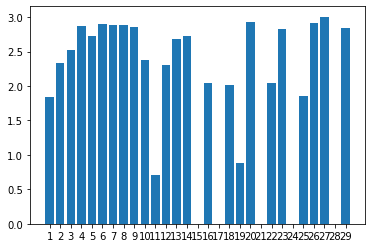

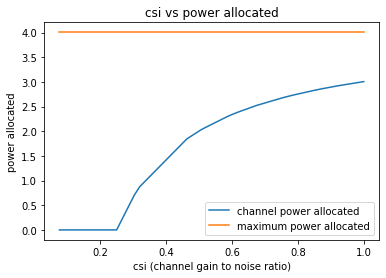

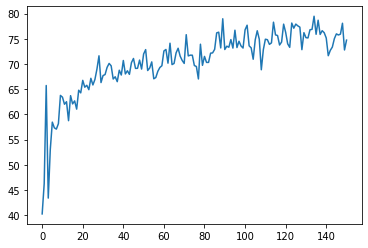

151
Power Allocated= 0
CSI= 0.14230484471179872
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.012648605504003
CSI= 0.2523359458217539
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.550488340720138
CSI= 0.2919596254348177
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3868578727976528
CSI= 0.21792372080983968
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 7.557103
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 1.878848


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 1.9490456478290166
CSI= 0.33040661174392916
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.687173398034912
CSI= 0.4369777442431291
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.047111
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.446730

Power Allocated= 3.8385051585486574
CSI= 0.8794190651349231
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 1.150599
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.469487

Power Allocated= 3.34310877034707
CSI= 0.6125534145080409
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.827879
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 1.432047

Power Allocated= 3.857026113824084
CSI= 0.8939799251311668
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.20092492349821622
CSI= 

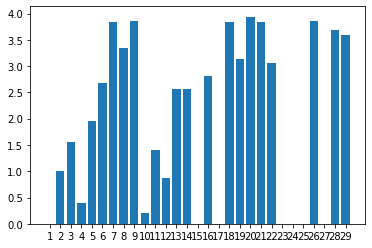

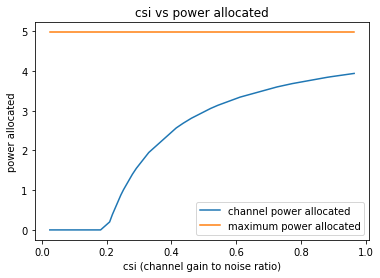

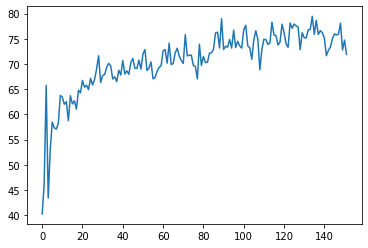

152
Power Allocated= 1.164965000627359
CSI= 0.29875153487596007
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.151621706645131
CSI= 0.7349663920203215
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2551827214565825
CSI= 0.7955162054103475
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.468657093871502
CSI= 0.9582481282725666
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3330336719118083
CSI= 0.8480365440494724
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.876025


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 1.544971

Power Allocated= 2.384832685723984
CSI= 0.4700583517795165
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5946480409336234
CSI= 0.5214906023465937
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1924682051304263
CSI= 0.7577135620661073
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.23328867464256
CSI= 0.43880059824618123
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0318464072362157
CSI= 0.4031637499560342
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0505961433136743
CSI= 0.6841667420123054
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss:

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18655717047840736
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3827659928131206
CSI= 0.3195437278116615
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 1.194942
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.634064

Power Allocated= 0
CSI= 0.07859514524664502
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.330536019715825
CSI= 0.8462441141066056
SNR= 15.73789526637954
Client: client21
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2348683664371936
CSI= 0.7828647982054813
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 [0/384 (0%)]	Loss: 0.594900
Model client23 Train Epoch: 2 [0/384 (0%)]	Loss: 0.330961

Power Allocated= 3.2468729642366023
CSI= 0.7902919437427

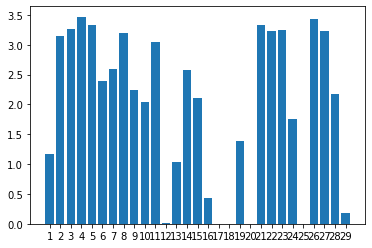

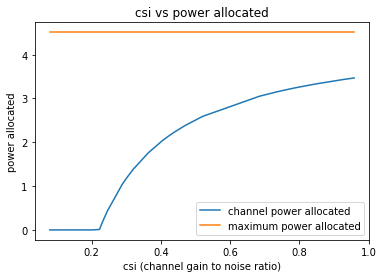

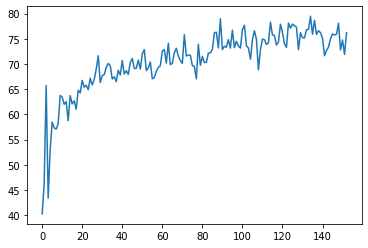

153
Power Allocated= 2.6639635036752587
CSI= 0.5843663566587289
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.535087
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.460600

Power Allocated= 2.7273582319628398
CSI= 0.6068474742954337
SNR= 4.5296012076772785
Client: client2


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Poor Channel, client not taken for averaging in this round

Power Allocated= 3.21968966162564
CSI= 0.865404428667939
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.616352
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.308347

Power Allocated= 2.4435654350589076
CSI= 0.5176912371399028
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7785284339437668
CSI= 0.3851056052407126
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.161544375105293
CSI= 0.823944223980229
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1953640700435337
CSI= 0.4587461743101098
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.842696
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.723693

Power Allocated= 1.4111652503584922
CSI=

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9564899346230686
CSI= 0.292506381992797
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 0.507849
Model client17 Train Epoch: 2 [0/384 (0%)]	Loss: 0.152622

Power Allocated= 3.353748069852106
CSI= 0.9789806097485461
SNR= 13.545407086100507
Client: client18
Model client18 Train Epoch: 1 [0/384 (0%)]	Loss: 0.920569
Model client18 Train Epoch: 2 [0/384 (0%)]	Loss: 0.439608

Power Allocated= 3.1959636809731653
CSI= 0.847992955035156
SNR= 14.92795654834405
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3297466934990503
CSI= 0.9565057079422575
SNR= 15.719034446696819
Client: client20
Model client20 Train Epoch: 1 [0/384 (0%)]	Loss: 1.264145
Model client20 Train Epoch: 2 [0/384 (0%)]	Loss: 0.263305

Power Allocated= 0
CSI= 0.15444616838016878
SNR= 15.73789526637954
Client: client21
Poor Channel, client not taken for averaging 

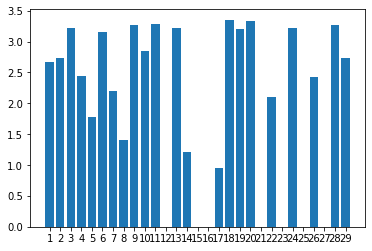

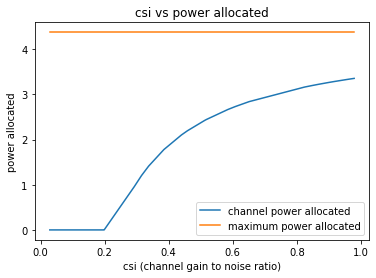

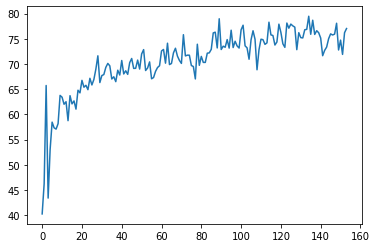

154
Power Allocated= 3.6609586777800187
CSI= 0.9950630527081058
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20253762803033437
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.510212358705292
CSI= 0.8652706453726905
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6716978414652504
CSI= 0.5014486153527419
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.013505158631097691
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.244410015969822
CSI= 0.412965446051068
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.075973923908902
CSI= 0.3861084070867662
SNR= 5.763716831

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.480838
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.233417

Power Allocated= 3.221651252088728
CSI= 0.6923918548687371
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3473475908265446
CSI= 0.43129985698338325
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.097573757929545
CSI= 0.6376142569884009
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04875630470383818
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.530427901528738
CSI= 0.8806753443299911
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9187351564647828
CSI= 0.5723492481829767
SNR= 7.5725046557150355
Clien

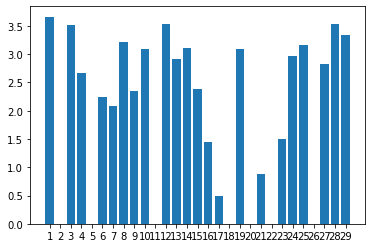

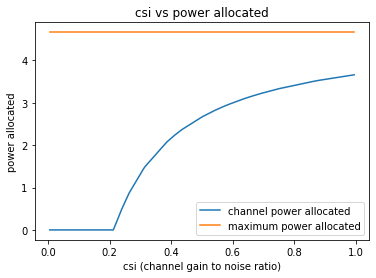

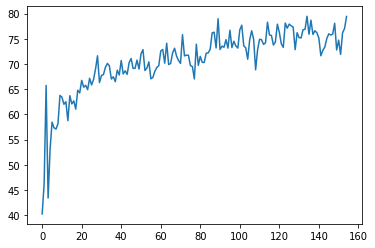

155
Power Allocated= 0
CSI= 0.18143567495476975
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0532178842289186
CSI= 0.8752973113686064
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3171375238121974
CSI= 0.25782835798684056
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 3.396397
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.510196


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 3.0221416110134953
CSI= 0.852118845075594
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.718622
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.398129

Power Allocated= 1.111888998541704
CSI= 0.3242754724459451
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.720913
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 1.277220

Power Allocated= 2.9315431052436014
CSI= 0.791049290759866
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3700009499791994
CSI= 0.35389637810696617
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.570820
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.275261

Power Allocated= 2.641535423107382
CSI= 0.6434379514331671
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.087720399366626
CSI= 0.

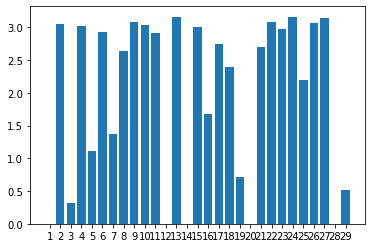

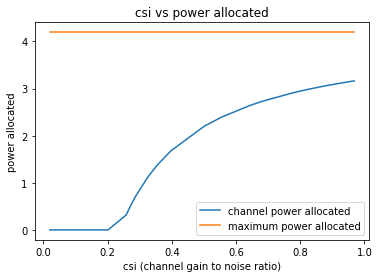

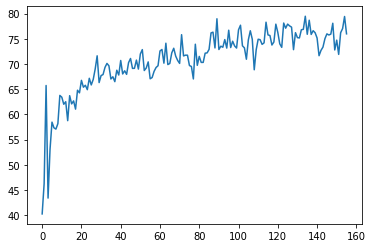

156
Power Allocated= 1.2189899424120223
CSI= 0.30942657295689013
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5217767269161477
CSI= 0.5184039337827275
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3040027981658433
CSI= 0.8720131960857234
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.388180868112797
CSI= 0.326520636264952
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.628054661312495
CSI= 0.5486306861712212
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8628841983238114
CSI= 0.38641515235985424
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.34117381486473
CSI= 0.4

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.511498

Power Allocated= 3.035351998974286
CSI= 0.7065028607169861
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07686734717348354
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.535063289821389
CSI= 0.5219993643854858
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 0.869247
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 0.441861

Power Allocated= 1.7937273646782597
CSI= 0.37635765329976845
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 0.867430
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 0.198563

Power Allocated= 2.900435084100155
CSI= 0.6450200722696678
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 0.784105
Model client16 Train Epoch: 2 [0/384 (0%)]	Los

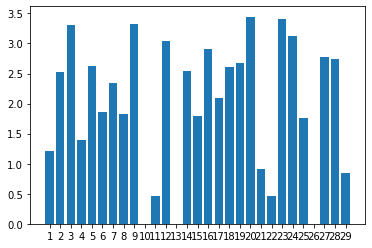

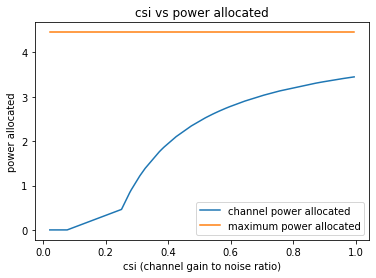

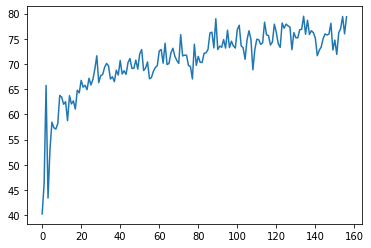

157
Power Allocated= 3.6936195551309887
CSI= 0.8555969002776596
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8042883573192681
CSI= 0.2464203813771617
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09258153302279692
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5546193391932315
CSI= 0.7646575852970328
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.759949


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.554620

Power Allocated= 0
CSI= 0.16595341956005427
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5329789920737587
CSI= 0.4292922868236312
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.067708
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.638470

Power Allocated= 1.0630029536078012
CSI= 0.26320005596990603
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.08557623637634
CSI= 0.5628038416506868
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1463711514870463
CSI= 0.5827427410441973
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.642013
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.278127

Power Allocated= 1.7092406154755406
CSI= 0.31714280943

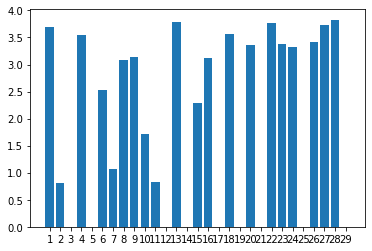

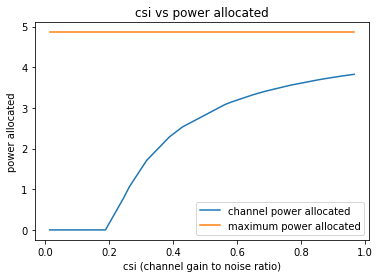

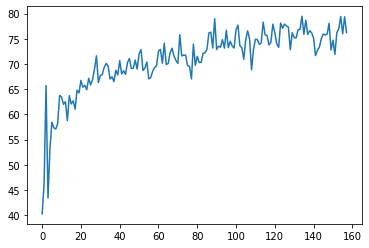

158
Power Allocated= 0
CSI= 0.1331578072339623
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8916663802703475
CSI= 0.7080293612123282
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 0.716045
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.790425



/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Power Allocated= 3.2494483382781087
CSI= 0.9482368425610554
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0219060809291025
CSI= 0.4381869198450672
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12866881812377717
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.054788167268283
CSI= 0.8004809163744038
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5966125788455772
CSI= 0.36935469856918934
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.202115773500981
CSI= 0.47575517982453475
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.600480893958209
CSI= 0.3698831803937167
SNR

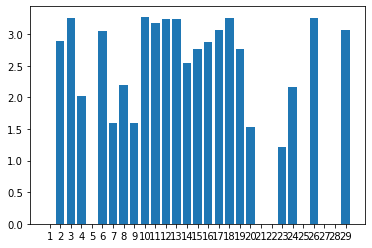

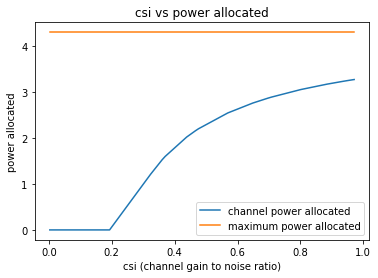

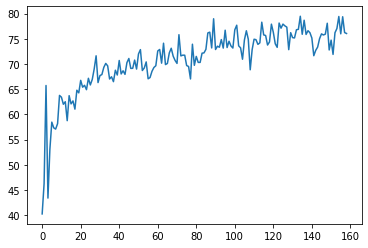

159
Power Allocated= 2.21823260980394
CSI= 0.36586575933591003
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.886204
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.473457

Power Allocated= 1.2810071093113446
CSI= 0.27244478980332265
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0
CSI= 0.06438921769557826
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7777130160046282
CSI= 0.31508343567941055
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.731743
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.632877


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 3.097277921370917
CSI= 0.5393168398604423
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1347329173456272
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18787970053021774
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2264507843613455
CSI= 0.5797018256687172
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.887195
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.702705

Power Allocated= 3.8789960863404365
CSI= 0.9324187953970641
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0696532169746027
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.604197967925215
CSI= 

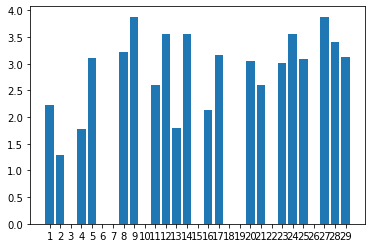

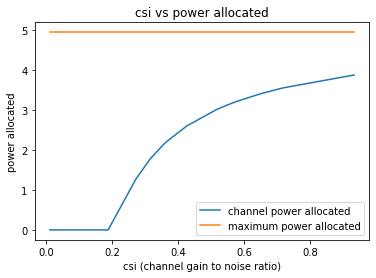

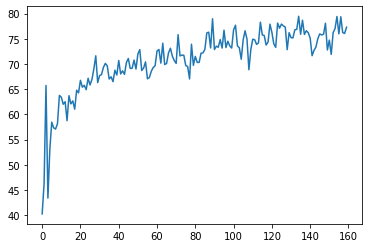

160
Power Allocated= 2.4830023469154177
CSI= 0.5427021500686514
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8586273062655816
CSI= 0.6816602849395297
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10876080000661581
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9011120734718157
CSI= 0.701990041870947
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5430136501259053
CSI= 0.5609720349975931
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.835160


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 1.219750

Power Allocated= 2.1490480271734977
CSI= 0.459435164915341
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.234609408281145
CSI= 0.4782345195162897
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04110400585934848
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.168214060493052
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7115535667560144
CSI= 0.38254374272639957
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6878642993107467
CSI= 0.3791081956273046
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CS

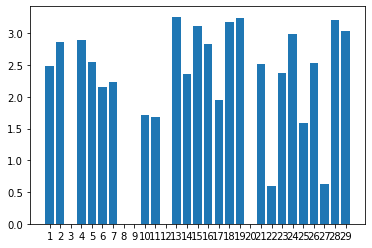

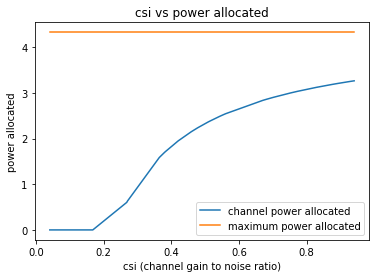

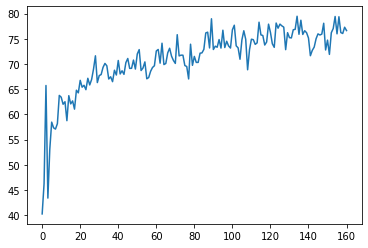

161
Power Allocated= 3.432695945225846
CSI= 0.8754359346699673
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2697274149495454
CSI= 0.7661328975365986
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4190149576712767
CSI= 0.865075079130237
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.276636505094641
CSI= 0.4350952184692667
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.683354


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.465543

Power Allocated= 0
CSI= 0.13132911372050515
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.313241026535188
CSI= 0.44213689054589667
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.788525355632074
CSI= 0.5597666702882512
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4641182967872672
CSI= 0.900198834395185
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3561484454200396
CSI= 0.8204552340565894
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.620154
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.705357

Power Allocated= 3.501007145799411
CSI= 0.9311187738126728
SNR= 6.445983530041328
Client: client10
Poor Channe

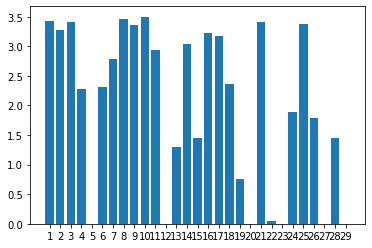

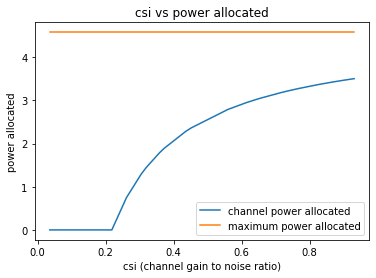

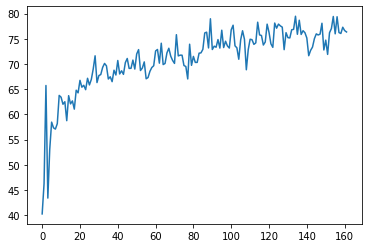

162
Power Allocated= 2.605883569858448
CSI= 0.5159075863025969
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0354352475388805
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8806899201286256
CSI= 0.3754422765530264
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9998629321734915
CSI= 0.64752065428749
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0561212709557839
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3459021567006642
CSI= 0.31266482738688106
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.940172268079044
CSI= 0.6234247047577178
SNR= 5.76371683119

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1766689149024137
CSI= 0.7312366686493905
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.606261
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.541035


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.890322997229608
CSI= 0.6046343225030847
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19818019185467584
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.2965005295968277
CSI= 0.23542070837856988
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.786199
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.330206

Power Allocated= 0
CSI= 0.19935521859852934
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.242825853429522
CSI= 0.4345201281967377
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.446232990934438
CSI= 0.910761557849283
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 

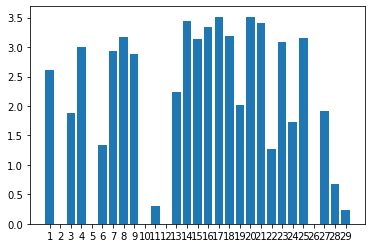

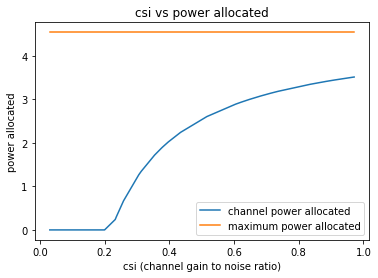

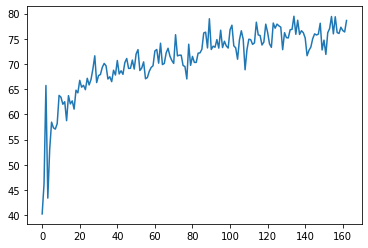

163
Power Allocated= 3.151528597268381
CSI= 0.932388190253525
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04863137744970747
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14922695013556797
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.044852359573988
CSI= 0.8480391127123602
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9517246405639006
CSI= 0.7859666511829879
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.695664460975861
CSI= 0.6542880629011317
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.728261653745456
CSI= 0.6685467983386472
SNR= 5.76371683119

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8787269288104027
CSI= 0.7433196053039016
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0136011031827112
CSI= 0.45239817723266507
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9942722860052644
CSI= 0.813159544224095
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10385073506438458
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9967997117876202
CSI= 0.4489854750753305
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2038903968526036
CSI= 0.9802452571636106
SNR= 7.5725046557150355
Client: client13


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.676766
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.381218

Power Allocated= 1.718847926386291
CSI= 0.3991704714184324
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9507737388582265
CSI= 0.7853796764535957
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.288246888765273
CSI= 0.5165832614701099
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 0.611373
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 0.249300

Power Allocated= 0
CSI= 0.09023759308268686
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0014496957142573
CSI= 0.8179333132065578
SNR= 13.545407086100507
Client: client18
Model client18 Train Epoch: 1 [0/384 (0%)]	Loss: 0.648337
Model client18 Train Epoch: 2 [0/384 (0%)]	L

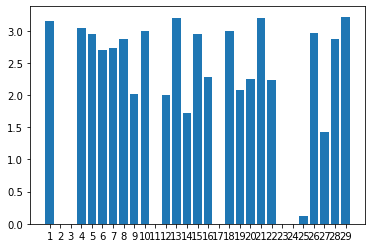

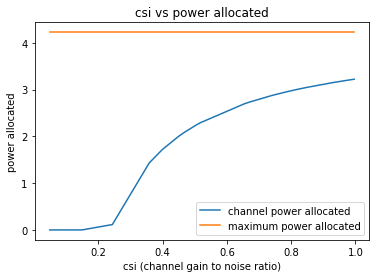

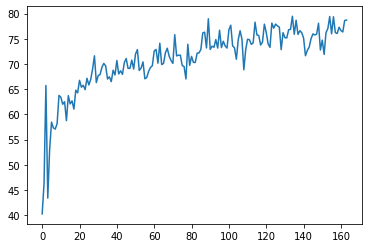

164
Power Allocated= 2.780680336087113
CSI= 0.7348659654949281
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.030448491361947272
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5228176665933706
CSI= 0.38187542242264616
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18107431649001815
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.954772275708367
CSI= 0.8426726518719189
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02487427005028786
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.077423181084508
CSI= 0.4844844986069726
SNR= 5.763716831196649
Client:

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.726771
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.326086

Power Allocated= 2.727938733054069
CSI= 0.7074467384158869
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7013592511732742
CSI= 0.694389733997107
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.685752
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.322720

Power Allocated= 0.07068898384690936
CSI= 0.24565294248907577
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 155.617096
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 24.647980

Power Allocated= 2.8848237644734107
CSI= 0.7957671913017395
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.927591
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.390464

Power Allocated= 2.9336994077085476
CSI= 0.827969950992417
SNR= 7.179421131

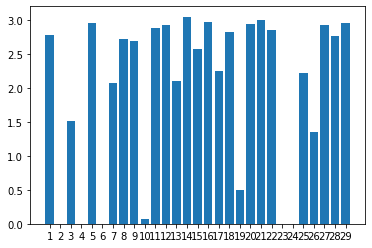

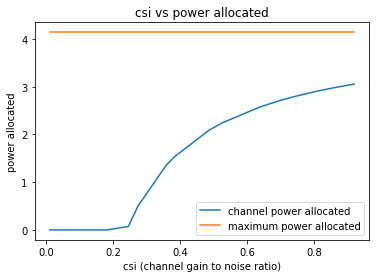

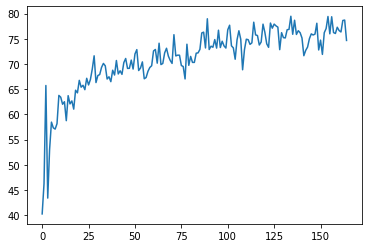

165
Power Allocated= 2.7212170387502463
CSI= 0.42501384065866277
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.452727994714457
CSI= 0.6167686075065422
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4838920250789274
CSI= 0.38607212887707554
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6017200433985845
CSI= 0.6791810078654504
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0994317343949906
CSI= 0.2515944890792794
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.957439


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.705594

Power Allocated= 0
CSI= 0.10541878808503424
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.047650318959327254
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.006852403238628457
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.197192594981305
CSI= 0.25793877538589005
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.16469870430741
CSI= 0.5237294242280314
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16616904852269399
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.333039844857132
CSI= 0.57436876

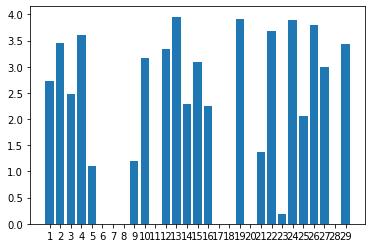

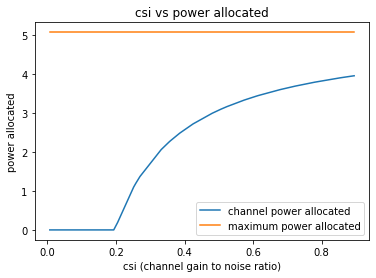

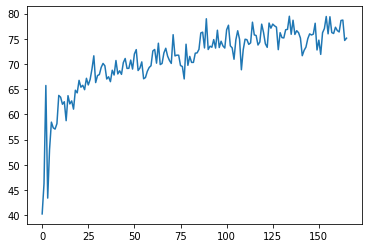

166
Power Allocated= 1.6158268052559177
CSI= 0.32720402585490116
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09337295829383407
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1620319209078196
CSI= 0.6622551643293582
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.660207
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.553284


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 0
CSI= 0.12519371943921132
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2197597427501203
CSI= 0.6885799533858944
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6242498292171774
CSI= 0.4883351167145594
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.814202
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.786672

Power Allocated= 3.4433605605960698
CSI= 0.8138925863828723
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.467607896921308
CSI= 0.31206934198299785
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.914876658705031
CSI= 0.3626937210650283
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 1.372097
Model clie

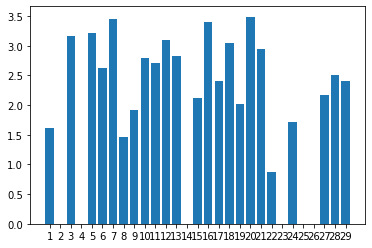

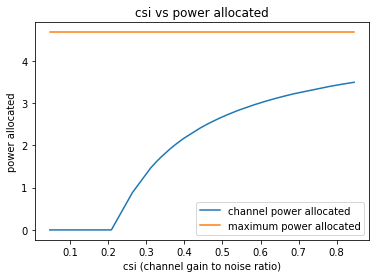

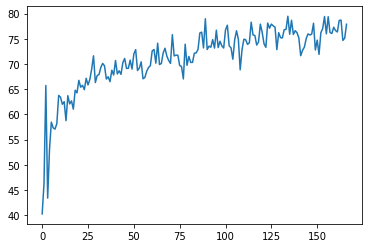

167
Power Allocated= 0
CSI= 0.07948114792466765
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7908836502226015
CSI= 0.8098824667704344
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9007801717349588
CSI= 0.32001530493213404
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5342751758790203
CSI= 0.670530918119994
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9966994760398395
CSI= 0.4928703250173727
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.718433742363513
CSI= 0.4334263659074866
SNR= 5.481605188045396
Client: client6


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.138294
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.403852

Power Allocated= 3.728568979953491
CSI= 0.7709733250962171
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.782979
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.516307

Power Allocated= 3.9522944742648596
CSI= 0.9316744935146973
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.08798622990107052
CSI= 0.2025257190311346
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 153.172638
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 58.446636

Power Allocated= 0
CSI= 0.13866533982892937
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06767512321762181
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power A

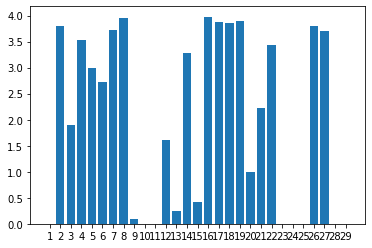

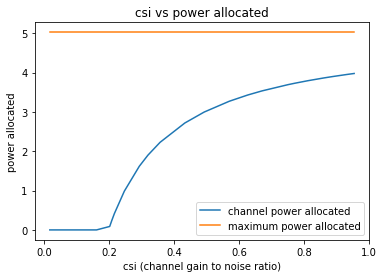

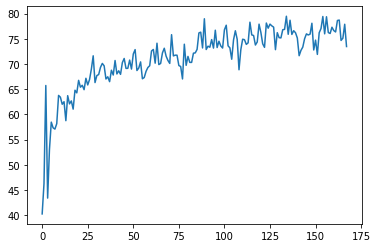

168
Power Allocated= 0
CSI= 0.06988313392578083
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7025227781539822
CSI= 0.8935927665317941
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5472231732667647
CSI= 0.7846967817235244
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07466876518515031
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8262529295246006
CSI= 0.5011657511463383
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1497226447600806
CSI= 0.3742685678693157
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6082503226261124
CSI= 0.8241641983682411
SNR= 5.763716

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05943663575181268
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.00344768172154597
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19518230549981863
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6727594985275323
CSI= 0.8704422652317729
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.632126267261086
CSI= 0.4567305981795401
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.149947366944143
CSI= 0.598210129743817
SNR= 7.5725046557150355
Client: client13


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 1.417611
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 1.227896

Power Allocated= 0
CSI= 0.11428316852739984
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6434819842023156
CSI= 0.4591117829990621
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 0.867148
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 0.435690

Power Allocated= 3.407120736222018
CSI= 0.7069735698561934
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 1.081234
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 0.292283

Power Allocated= 3.7642703619620947
CSI= 0.94577815129542
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5861540521239226
CSI= 0.8094238175971434
SNR= 13.545407086100507
Client: client18
Model client18 Train Epoch: 1 [0/384 (0%)]	Los

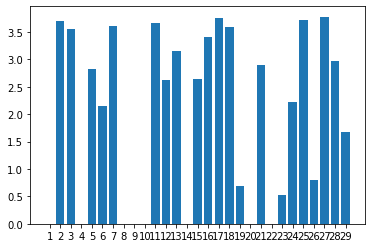

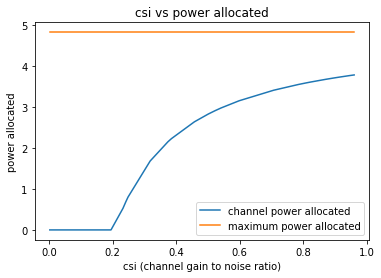

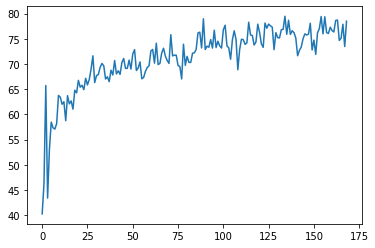

169
Power Allocated= 2.830125979346427
CSI= 0.5857959356650849
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3563768721165643
CSI= 0.8468632370987373
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.039514083767695
CSI= 0.2859029001131641
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.460191641393666
CSI= 0.9284935197682843
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.606692


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.601008

Power Allocated= 3.4328634295811784
CSI= 0.9055168734317506
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.733206
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 1.289964

Power Allocated= 0.5569943551295897
CSI= 0.2512429790040731
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16003980182490496
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6327985439765493
CSI= 0.5250979663255725
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4300839080489984
CSI= 0.9032434965806659
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.616031


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 3.329080

Power Allocated= 0
CSI= 0.1527297144896418
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8942723163997166
CSI= 0.608667634573248
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.251005266504473
CSI= 0.7774841733057161
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3474181501742546
CSI= 0.8404866228802624
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.661690
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.905192

Power Allocated= 0.6424816276031673
CSI= 0.2567576393532609
SNR= 7.593315553337266
Client: client14
Model client14 Train Epoch: 1 [0/384 (0%)]	Loss: 0.834627
Model client14 Train Epoch: 2 [0/384 (0%)]	Loss: 0.281250

Power Allocated= 1.8670619901369867
CSI= 0.374

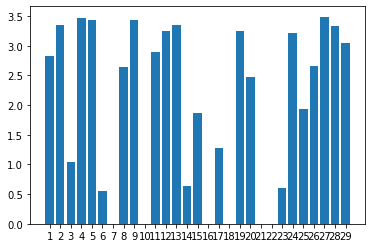

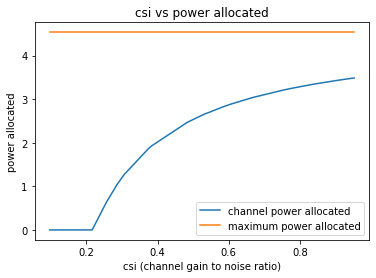

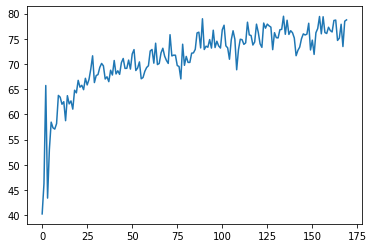

170
Power Allocated= 1.9048780264098273
CSI= 0.42630501214699
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1956364480783925
CSI= 0.9478853656405049
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14467429441452462
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.145254489105656
CSI= 0.47497773357800965
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.174770957510264
CSI= 0.929501596476337
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0420769068361913
CSI= 0.8274450738472773
SNR= 5.481605188045396
Client: 

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6892371382787381
CSI= 0.3904146639334345
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 1.071010
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.279913

Power Allocated= 1.153287703882727
CSI= 0.322858862486444
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5941943068199658
CSI= 0.6037108782359794
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.470832
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 3.004595

Power Allocated= 2.862134766259711
CSI= 0.7202112144421061
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5929284916203006
CSI= 0.6032498828761402
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.751839
Model client11 Train Epoch: 2 

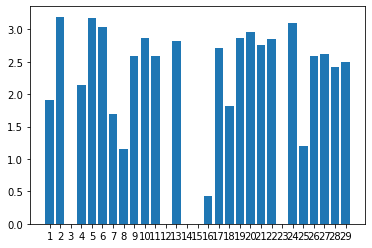

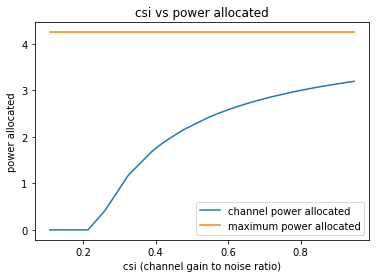

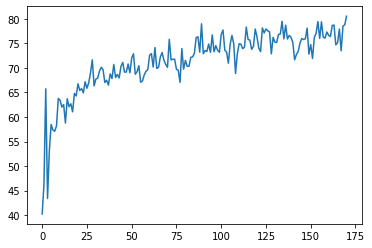

171
Power Allocated= 2.0865924807090566
CSI= 0.5191437877755997
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.006363958762725219
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7528652793038386
CSI= 0.793666029399666
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4178376601536
CSI= 0.6269578988680214
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.506250
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.488112


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 2.4815188461386404
CSI= 0.6530304140970801
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.71988771951594
CSI= 0.7734230960476884
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.092633790280701
CSI= 0.5207771053513468
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.527813126662394
CSI= 0.40240995841994875
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7279252433227215
CSI= 0.3044218014159866
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.371275
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 1.227890

Power Allocated= 0
CSI= 0.152063167428779
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allo

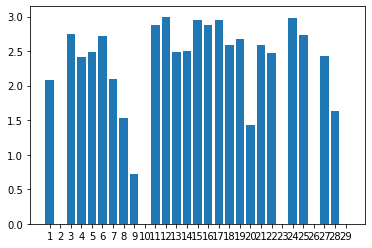

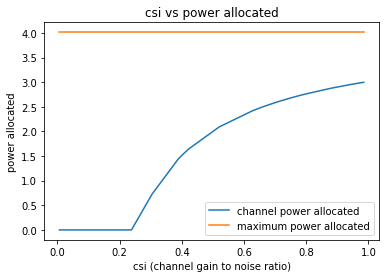

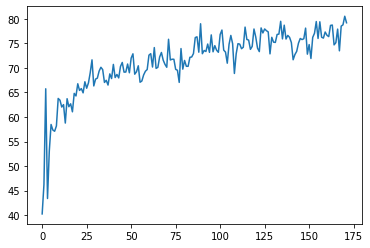

172
Power Allocated= 3.712120691871836
CSI= 0.8864066639735358
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4582522240399767
CSI= 0.7235791419538975
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19984269155518164
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.905839171520613
CSI= 0.516947641551789
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17542119253501076
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8432905427677744
CSI= 0.33366916997245044
SNR= 5.481605188045396
Client: client6


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.876540
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.308305

Power Allocated= 3.1702121183506558
CSI= 0.5987812633121092
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.030574423566473996
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0864592670139506
CSI= 0.5701866110992617
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.801583
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.537133

Power Allocated= 3.809839286525054
CSI= 0.9704669735735171
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16088863537784026
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05317735258755785
SNR= 7.17942113154772

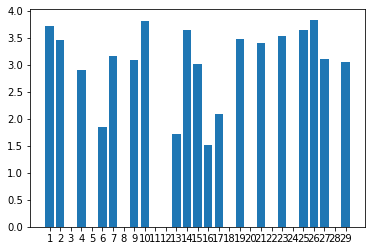

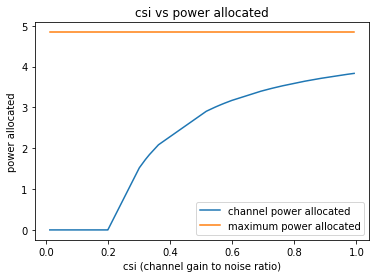

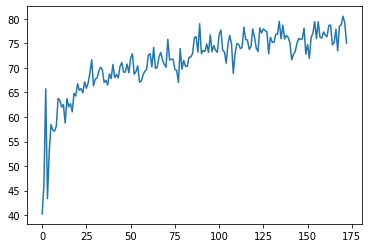

173
Power Allocated= 0
CSI= 0.10365413345050256
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.392076734068433
CSI= 0.2149938299206926
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 8.743388
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 1.643348


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 1.1729549531991386
CSI= 0.2583700225337996
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05122636021452531
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.9896849217034243
CSI= 0.9490474582853713
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.834360
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.504296

Power Allocated= 3.125646747923084
CSI= 0.5214508560928612
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3120878144272736
CSI= 0.36612800538060253
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.527920746587657
CSI= 0.39754282575453737
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 1.220271
Model cli

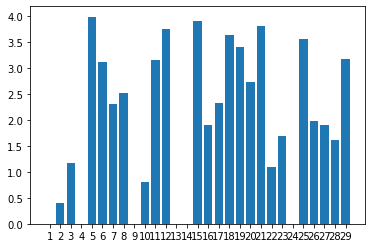

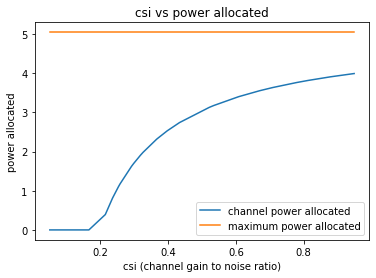

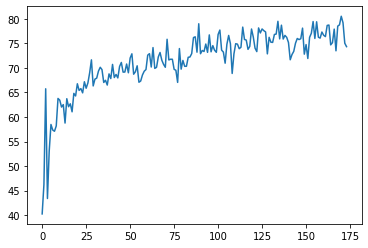

174
Power Allocated= 2.7555336559165484
CSI= 0.5919591050126325
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5172725615362772
CSI= 0.2546105528318573
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 2.144067
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 0.767247


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_


Power Allocated= 0
CSI= 0.019590492617862054
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.321756438547811
CSI= 0.8904060594943441
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.816548607141856
CSI= 0.6141408632980782
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.26928033609005464
CSI= 0.23948888061602847
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.004024033238835045
CSI= 0.22518386503252352
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 33.869843
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 7.596639

Power Allocated= 1.1258737784005537
CSI= 0.3012986789982788
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.860273
Mode

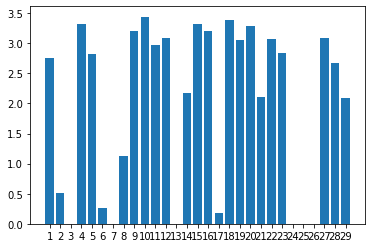

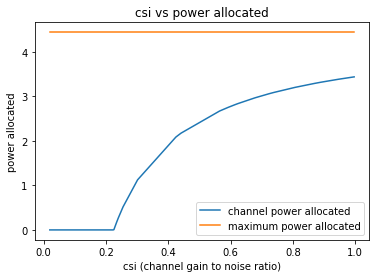

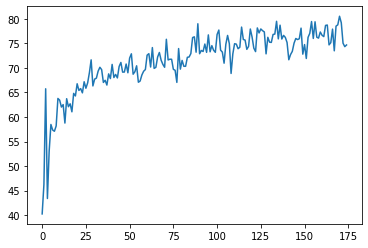

175
Power Allocated= 2.0000667287329743
CSI= 0.43760653752049705
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03459332694535533
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.745725016545808
CSI= 0.6495617445924895
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1608446836072535
CSI= 0.8893791445886327
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.014177703313441259
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.066647359330223
CSI= 0.8206291822386564
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.462519404914786
CSI= 0.35427008847910113
SNR= 5.763716

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1649245195886366
CSI= 0.892618027879177
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2649045408724042
CSI= 0.9800846746150561
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.001950741093342
CSI= 0.7792569258082725
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1507539935879727
CSI= 0.8814684507055502
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4949211606858475
CSI= 0.5585645474020438
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7189574915415546
CSI= 0.6384607256485725
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not ta

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client18 Train Epoch: 2 [0/384 (0%)]	Loss: 0.483561

Power Allocated= 1.1833064544184566
CSI= 0.3223811753086526
SNR= 14.92795654834405
Client: client19
Model client19 Train Epoch: 1 [0/384 (0%)]	Loss: 2.393113
Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.512055

Power Allocated= 2.971274254914817
CSI= 0.7610637989597827
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5294666118089686
CSI= 0.5695545955733715
SNR= 15.73789526637954
Client: client21
Model client21 Train Epoch: 1 [0/384 (0%)]	Loss: 1.405491
Model client21 Train Epoch: 2 [0/384 (0%)]	Loss: 0.185650

Power Allocated= 3.2198218004391195
CSI= 0.9386121862231405
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 [0/384 (0%)]	Loss: 0.772351
Model client23 Train Epoch: 2 [0/384 (0%)]	Loss: 0.140700

Power Allocated= 2.352148650632887
CSI= 0.5173102631497084
SNR= 16.727271644180114
Client: client24
Model client24 Train Epoch: 1

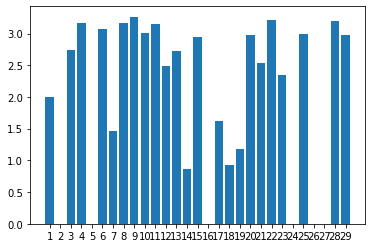

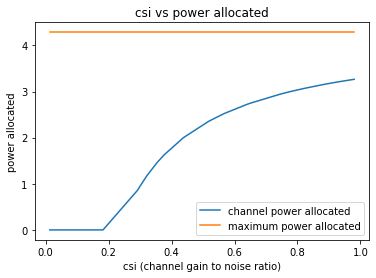

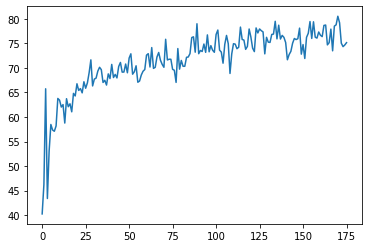

176
Power Allocated= 1.0664028519571627
CSI= 0.3513752562707507
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8816254730345685
CSI= 0.9701790305993728
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3437590634962482
CSI= 0.28022162137801243
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 75.770683
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 10.950145


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.88876843881343
CSI= 0.9769492455087981
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.727837
Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.430166

Power Allocated= 1.9288292245225962
CSI= 0.5041507124492949
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 1.015442
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.449471

Power Allocated= 2.2459019364824764
CSI= 0.600074002034245
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6313984715720276
CSI= 0.7806617008311179
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02839021830220334
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1810975413778637
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken 

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.602631101342685
CSI= 0.7635149984862745
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.356772124522742
CSI= 0.642842518881695
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3982301378994304
CSI= 0.6604439944387815
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.642383089071077
CSI= 0.7874139885260726
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8291344445033473
CSI= 0.9231661525197356
SNR= 13.12832021207836
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8416576959581672
CSI= 0.4829272255933543
SNR= 13.376246860649108
Client: client17
Model client17 Train Epoch: 1 [0/384 (0%)]	Loss: 2.693853
Model client17 Train Epoch: 2 [0/384 (0%)]	

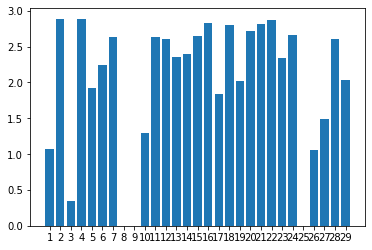

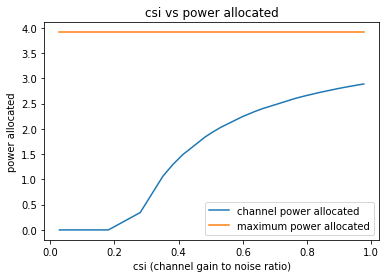

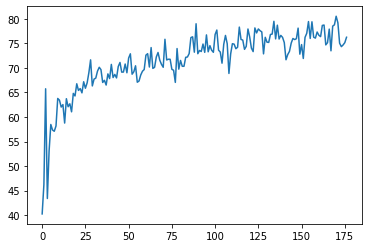

177
Power Allocated= 0.6280922028564468
CSI= 0.23256039697266473
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8231768774831436
CSI= 0.9050809186624381
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.333470724933371
CSI= 0.38541887352199755
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0546850242321405
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7411923801394025
CSI= 0.8425607191300002
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15050620474359566
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6094887364013513
CSI= 0.23155857511216427
SNR= 5.76371

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.712725
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.769782

Power Allocated= 0
CSI= 0.11451143218874871
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2354742308979056
CSI= 0.37139152755993277
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.502702374916327
CSI= 0.41231195011368016
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.618405
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 2.965700

Power Allocated= 3.8425473937532386
CSI= 0.9212318491881718
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2467069295836506
CSI= 0.5947624503762776
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.720449
Model client12 Train Epoch: 2 [

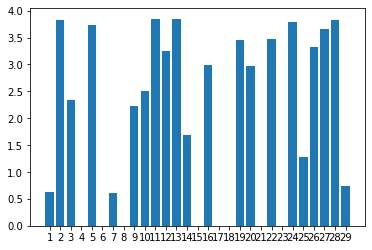

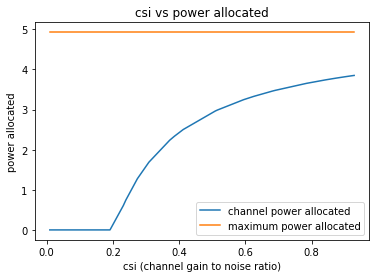

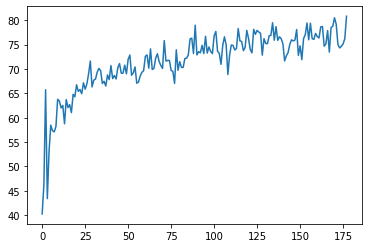

178
Power Allocated= 2.9286294594045246
CSI= 0.7677172497515632
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.083628459061939
CSI= 0.8714111762252142
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1671101538770126
CSI= 0.9397770244057522
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3801334303908175
CSI= 0.3507468727217449
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.863053


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.397985

Power Allocated= 3.1186576079334394
CSI= 0.8988483345142696
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7952496332578267
CSI= 0.4105186846657364
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9259294691041506
CSI= 0.3025477960553461
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.21085785083532926
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.078756045110725
CSI= 0.46458982211288524
SNR= 5.808528005279032


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15820227206178794
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10985460669442193
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8015164565258694
CSI= 0.41157752879055753
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.474940
Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 2.944863

Power Allocated= 2.097049064433494
CSI= 0.46857209952159173
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9689904842815977
CSI= 0.44204719974464446
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.107597124111814
CSI= 0.8900002215703136
SNR= 8.858041469455715
Client: client

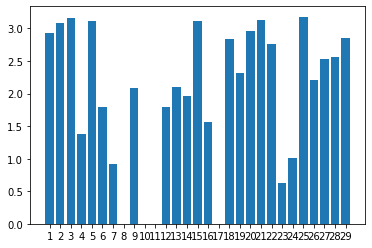

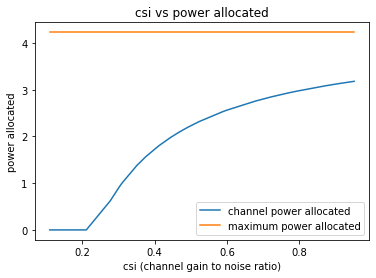

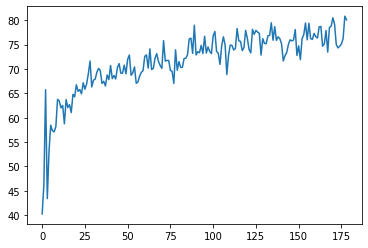

179
Power Allocated= 2.8552444945308633
CSI= 0.5837536010290961
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4222007260946157
CSI= 0.8725277910541429
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0114285851685927
CSI= 0.6423154432042848
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3326522980552076
CSI= 0.23609162250851168
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0261241691183907
CSI= 0.39336443657698206
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1288998520677036
CSI= 0.6947357637876073
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.412150626807918
CSI=

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20660836703654561
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4982141454710534
CSI= 0.9345079274639536
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.1881377529755328
CSI= 0.22830225251306846
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 34.783134
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 10.066656

Power Allocated= 0
CSI= 0.18467456488558343
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0587645063655717
CSI= 0.6624571844107794
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.023356748477102007
SNR= 7.593315553337266
Client: client14
Poor Channel, client not ta

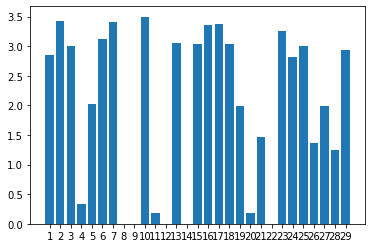

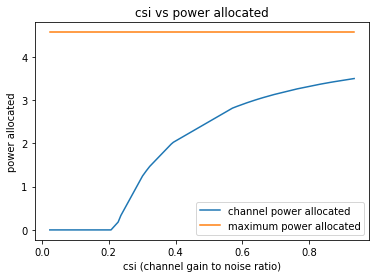

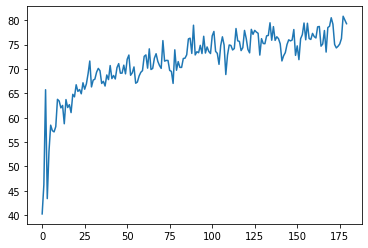

180
Power Allocated= 2.839823891800255
CSI= 0.5725768183156056
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7121781591155054
CSI= 0.533579127311679
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4889267844656233
CSI= 0.24405794243221657
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3019694210399266
CSI= 0.43776224374990114
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0030247431588207307
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05463473838133026
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.367990703639094
CSI= 0.8207999007388984
SNR= 5.76371

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.591745
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.567655

Power Allocated= 2.2710529641438026
CSI= 0.431916658836872
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.630742
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.482205

Power Allocated= 2.429592052816165
CSI= 0.4636665372420701
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.591251
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.453757

Power Allocated= 3.4561336419900806
CSI= 0.8848141852876928
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09230535024459419
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4255874989845614
CSI= 0.8615290699559194
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for aver

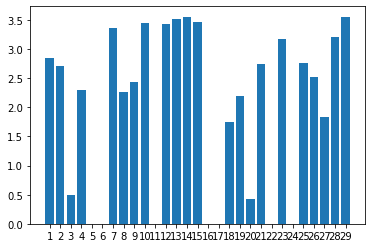

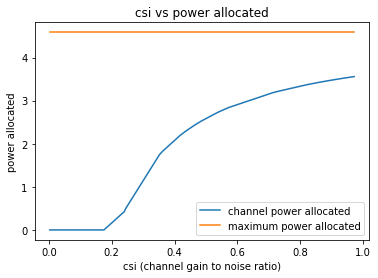

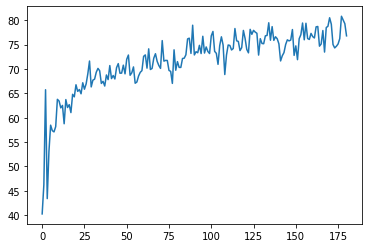

181
Power Allocated= 3.8615176005082645
CSI= 0.8468560807599711
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.788698
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.558000

Power Allocated= 3.233020536809594
CSI= 0.5526891707862344
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 0.4020733371429017
CSI= 0.21550412296145116
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.713506
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 0.819888

Power Allocated= 3.0790786035628193
CSI= 0.5093524274660558
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.049241270429894346
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8707457361298196
CSI= 0.853526305847704
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9627041246035999
CSI= 0.245118966606661
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.910431
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.760229


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 0
CSI= 0.035549667377580585
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07114638743154444
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.024821541178236317
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.328656758634687
CSI= 0.5835330373069191
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.210298321958288
CSI= 0.5458344065044971
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.916593
Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.925590

Power Allocated= 3.551404039111209
CSI= 0.670712516569567
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.78018128066172

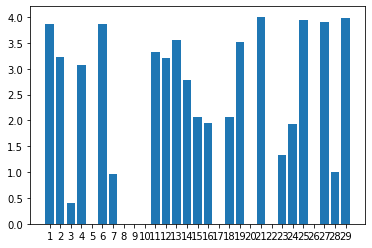

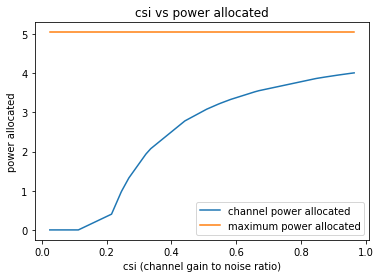

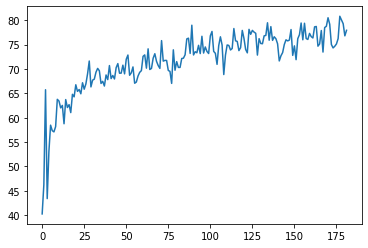

182
Power Allocated= 3.306407760946083
CSI= 0.8498408134661205
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1253413430568733
CSI= 0.7365086123461656
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.613336721964888
CSI= 0.5348274284156063
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10953568140141179
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4583696421800125
CSI= 0.9758676939674304
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.112297735463744
CSI= 0.7295004985120249
SNR= 5.481605188045396
Client: client6


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.269470
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.545383

Power Allocated= 0
CSI= 0.07560948664934064
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2945960498163913
CSI= 0.8413948297380183
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2210406361341226
CSI= 0.7923565598922006
SNR= 5.808528005279032
Client: client9
Model client9 Train Epoch: 1 [0/384 (0%)]	Loss: 0.597683
Model client9 Train Epoch: 2 [0/384 (0%)]	Loss: 0.863839

Power Allocated= 0
CSI= 0.12839110367053774
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1283413377940006
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.35639393467177
CSI= 0.8875439378123791
SNR= 7.179421131547728
C

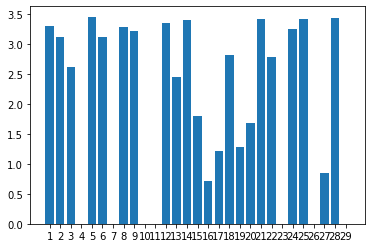

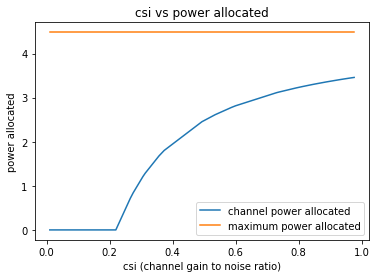

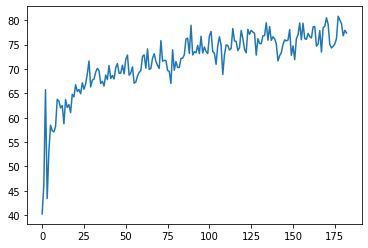

183
Power Allocated= 0.43986142532368966
CSI= 0.23389950503941426
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 22.418085
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 6.389818

Power Allocated= 3.4256960325461785
CSI= 0.7754909027859447
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.495573855420338
CSI= 0.8199221702995971
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.069044019260997
CSI= 0.607475179620295
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20693123380072953
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17190796813049924
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.476150334814517
CSI= 0.8070689713157527
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.477814291486996
CSI= 0.8081542641437366
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.423672928042003
CSI= 0.7742761416145024
SNR= 5.808528005279032


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.667584934048105
CSI= 0.9545474326981567
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1117976580117372
CSI= 0.2775153598219656
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.793355539890485
CSI= 0.5203329814778176
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4256292491045723
CSI= 0.7754507422296741
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.48415679495701
CSI= 0.3094973902086854
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4724808708502737
CSI= 0.8046858856107603
SNR= 8.858041469455715
Client: client15
Poor Channel, client not ta

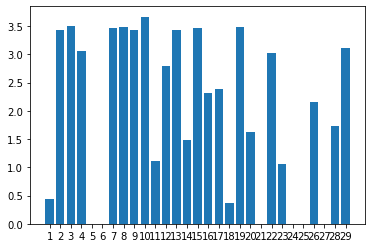

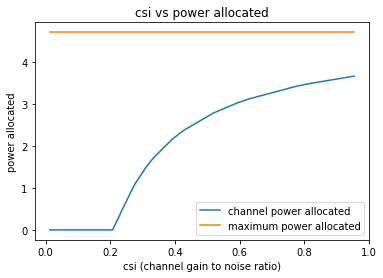

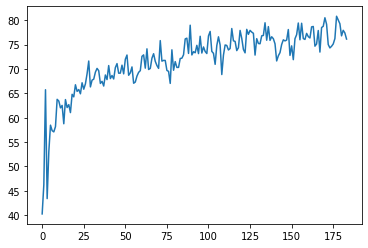

184
Power Allocated= 0.284986373482663
CSI= 0.25186805654739186
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8416223453295713
CSI= 0.2929375564178285
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3276825039475031
CSI= 0.25460603675643
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 54.039776
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 8.597694


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.248569025838432
CSI= 0.498318145587612
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.754168509981336
CSI= 0.6661556635621492
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18543161152084464
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.792166119790079
CSI= 0.6834555101753798
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.662002
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.629454


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.536211218501945
CSI= 0.5816970431560701
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8467251566445384
CSI= 0.7099277758332544
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.226807497756085
CSI= 0.9722787280554316
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3753056911598538
CSI= 0.2577310648229032
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.071826852278047
CSI= 0.8449569150752934
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.679839
Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.849618

Power Allocated= 0.798637445986337
CSI= 0.2892947878731499
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in

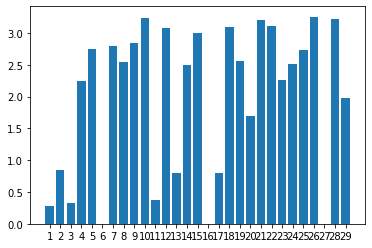

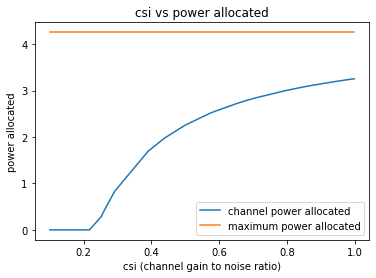

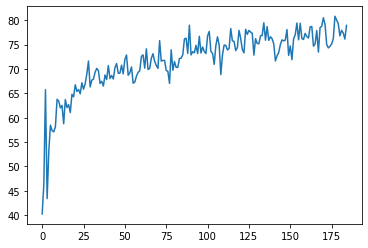

185
Power Allocated= 3.2218107053458778
CSI= 0.8356231212158761
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7643770454475733
CSI= 0.6045417770462865
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1573407225553756
CSI= 0.3066373127207367
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.777558
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 1.605538


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.742945620576816
CSI= 0.5968094000650048
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20591496833613776
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4144997670546227
CSI= 0.9959934380728663
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4997989780367122
CSI= 0.3426155341346715
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 0.908790


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 0.292425

Power Allocated= 0
CSI= 0.11065055714070626
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16472151118894152
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07152433994173912
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.162550897848865
CSI= 0.7961963799234664
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 0.648273
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 0.695793

Power Allocated= 2.6954792564430154
CSI= 0.5803685049835
SNR= 7.179421131547728
Client: client12
Model client12 Train Epoch: 1 [0/384 (0%)]	Loss: 0.955088
Model client12 Train Epoch: 2 [0/384 (0%)]	Loss: 0.906075

Power Allocated= 3.312086129102563
CSI= 0.9038025818953116
SNR= 7.5725046557150355

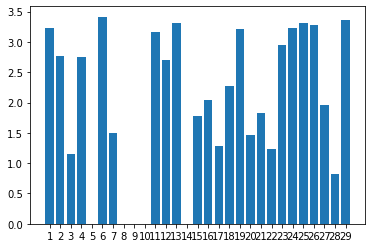

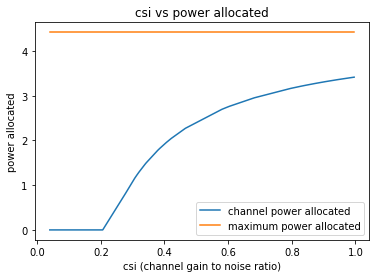

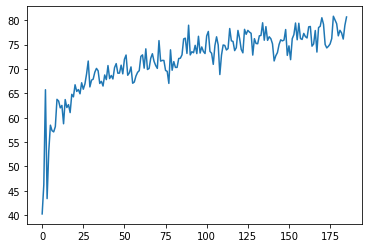

186
Power Allocated= 3.0967144225610155
CSI= 0.5583874765259208
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8863722232936144
CSI= 0.9987881608823399
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.044836353652222605
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4352877152712575
CSI= 0.4077808139262995
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.609846


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.407240

Power Allocated= 3.069191003947216
CSI= 0.5499356625649159
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7398883635392526
CSI= 0.8713099821359517
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.402031130887642
CSI= 0.4023247285401925
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05470457246657312
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6082008689278013
CSI= 0.43871489348550874
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.465663727150664
CSI= 0.7032735527819827
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power

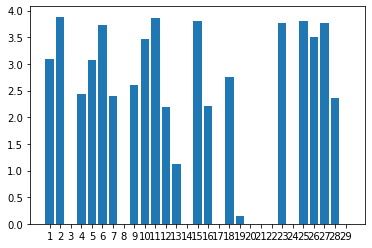

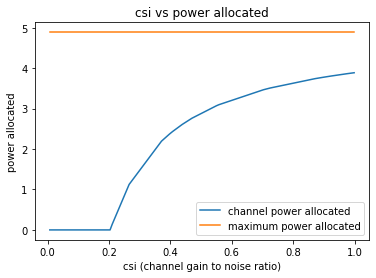

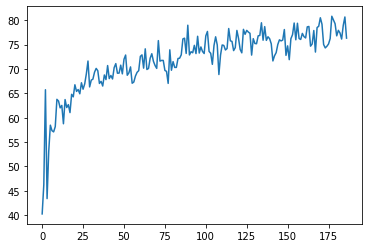

187
Power Allocated= 2.5505046418838986
CSI= 0.4176907728632864
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.894026
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.531817

Power Allocated= 2.720968076592064
CSI= 0.44971062045380417
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.047733158003301
CSI= 0.5271795050695068
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.719002473712556
CSI= 0.4493134487117961
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.270790836945886
CSI= 0.5974324446148839
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.440269293825641
CSI= 0.664738499877218
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1601383107577583
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8703697301423943
CSI= 0.4821018430034518
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.802107


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.319571

Power Allocated= 0
CSI= 0.01614661605861545
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7562606901705955
CSI= 0.8414961524610833
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.771442
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 1.967661

Power Allocated= 0.1715225786232928
CSI= 0.20950755006203536
SNR= 7.027128190861585
Client: client11
Model client11 Train Epoch: 1 [0/384 (0%)]	Loss: 123.231812
Model client11 Train Epoch: 2 [0/384 (0%)]	Loss: 56.277328

Power Allocated= 2.9046147489186187
CSI= 0.4901947558075307
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.800221818783701
CSI= 0.8738215379862563
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6841463784566186
CSI= 

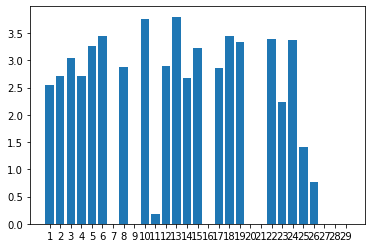

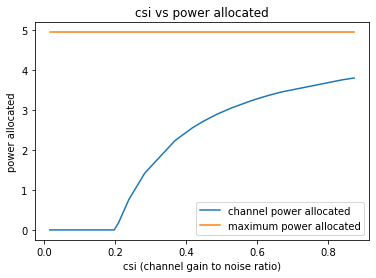

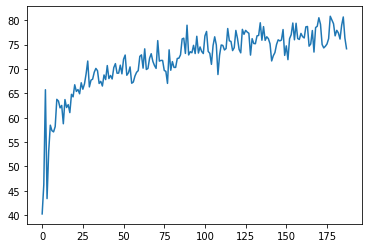

188
Power Allocated= 2.916703733615506
CSI= 0.7299321392582818
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9766502748210097
CSI= 0.43289221981281123
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2251153784152073
CSI= 0.9419932580085358
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1046429902674815
CSI= 0.45828440720202346
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2739021545701323
CSI= 0.9873696202088843
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.916697


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.364745

Power Allocated= 2.75542340024549
CSI= 0.653052395748595
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.020131628623845765
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.979086589414081
CSI= 0.7647554719211008
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1971558185588678
CSI= 0.9178199753495407
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.804259594385618
CSI= 0.6745660568440405
SNR= 6.445983530041328


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11011741910913508
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9114852352599052
CSI= 0.29627796075067925
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8146253873515961
CSI= 0.28801273313583464
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.874145
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.477573

Power Allocated= 3.187097871483738
CSI= 0.9094247258165848
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.284460682376803
CSI= 0.9977715579126386
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.198641279076395
CSI= 0.9190730260355646
SNR= 13.12832021207836

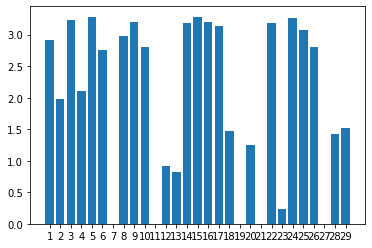

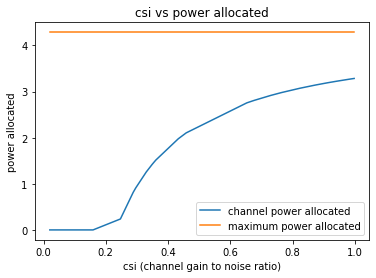

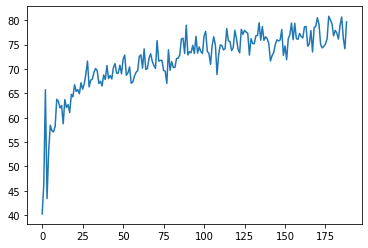

189
Power Allocated= 0
CSI= 0.2260602310055969
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.2215558568157281
CSI= 0.23828949186095394
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 47.114021
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 7.985197


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 2.8273324630678642
CSI= 0.6286147111049942
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7229103209626873
CSI= 0.5898933480111047
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3450639974295227
CSI= 0.9319073765672073
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.858215
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.443380

Power Allocated= 3.2035139884985497
CSI= 0.8233040998746691
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.784169
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.702189

Power Allocated= 0
CSI= 0.06933222659441263
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.24585602183161
CSI= 0.8530414397838916
SNR= 5.793773047542457
Client: client8
Poor Channel,

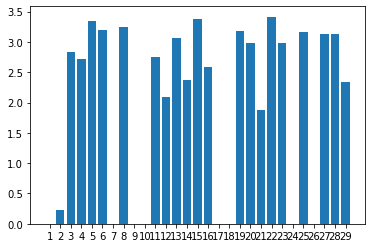

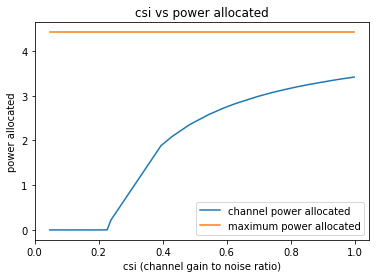

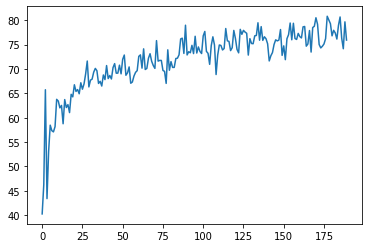

190
Power Allocated= 1.540156632960421
CSI= 0.3727426231477152
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 3.363439
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 1.117631

Power Allocated= 2.69964763253299
CSI= 0.6564585866541629
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 3.1449095661766497
CSI= 0.9275892249893504
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.21764424308555375
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1226613269900847
CSI= 0.9088334233764352
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8103510544507406
CSI= 0.707903499788391
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1616517493543403
CSI= 0.9422218059392223
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14447800203417815
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.328001938524017
CSI= 0.5277125517069203
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1178508956497115
CSI= 0.9048774072288109
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1107604503534603
CSI= 0.8991087401572914
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.216836829143055
CSI= 0.9939012788000932
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.099310100329588
CSI= 0.8899466417779966
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.195814723356107
CSI= 0.9735598194071489
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14569230934612964

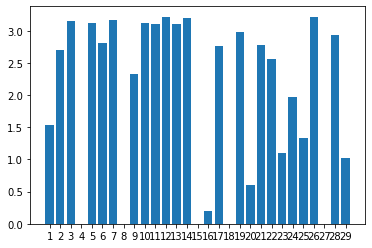

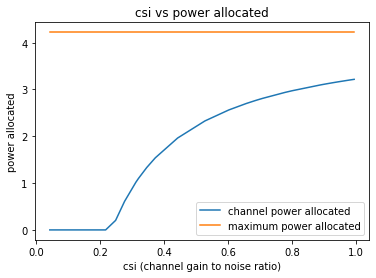

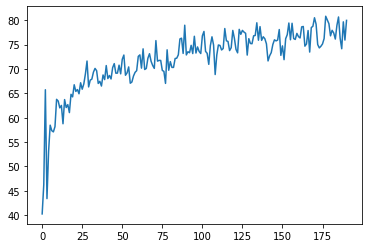

191
Power Allocated= 3.748309878351778
CSI= 0.6498658788507262
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1977405947548183
CSI= 0.47861813355300287
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.1471441729212577
CSI= 0.19455462023191283
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.510328
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 2.591754


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_


Power Allocated= 0
CSI= 0.08608065204762627
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6434580446440417
CSI= 0.3782676341011445
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.685023
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.562600

Power Allocated= 3.317711861587734
CSI= 0.5077747764156069
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 0.900416
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.648519

Power Allocated= 3.8921299894278705
CSI= 0.7168669784820397
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07544227478100418
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7126717423327533
CSI= 0.3884374316807133
SNR= 5.808528005279032
Client: client9
Poor Channel, client not tak

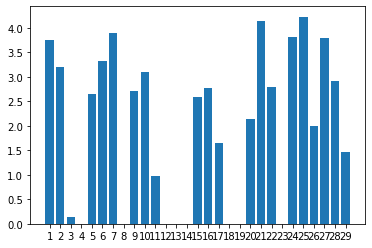

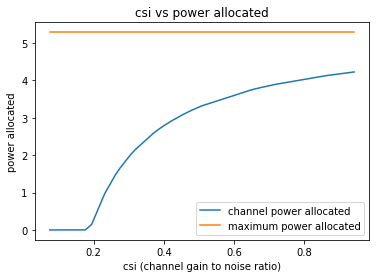

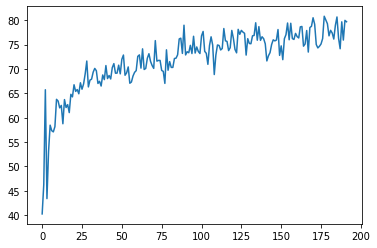

192
Power Allocated= 1.830431669837079
CSI= 0.31440682003134923
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19378578760224208
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9498058309507416
CSI= 0.24623152364391676
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8100365470324826
CSI= 0.8326479902611429
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1557658509698675
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.9227075096351727
CSI= 0.9188501470441318
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.27613166243711085
CSI=

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform

 0.21119803264757508
SNR= 5.763716831196649
Client: client7
Model client7 Train Epoch: 1 [0/384 (0%)]	Loss: 12.955582
Model client7 Train Epoch: 2 [0/384 (0%)]	Loss: 3.155680

Power Allocated= 3.4776045375141202
CSI= 0.6521371739699429
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1434156668564044
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11760398658132676
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.128498833835909
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0001257680988120402
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.9927967522933465
CSI= 0.9820987932016539
SNR= 7.5725046557150355
Client:

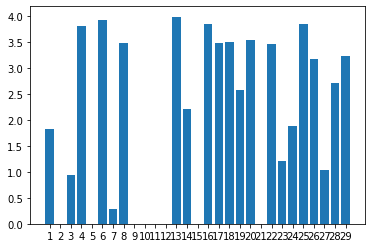

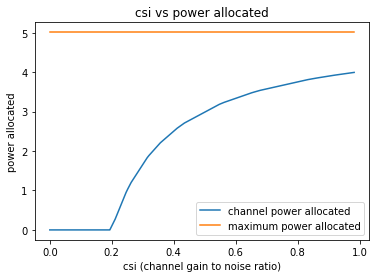

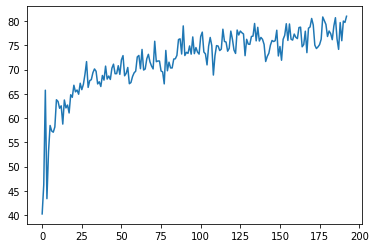

193
Power Allocated= 0
CSI= 0.12659451196678595
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.591524880550799
CSI= 0.8864244296151668
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2826211730353596
CSI= 0.6958789890587201
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10057822243743464
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.219197109135818
CSI= 0.3999271293688288
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3095503007752853
CSI= 0.7091683892335279
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1605804217273423
CSI= 0.6414071089243124
SNR= 5.76371683

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.168206937224647
CSI= 0.6445601043967459
SNR= 5.793773047542457
Client: client8
Model client8 Train Epoch: 1 [0/384 (0%)]	Loss: 0.501009
Model client8 Train Epoch: 2 [0/384 (0%)]	Loss: 0.492947

Power Allocated= 2.4657770709698466
CSI= 0.4436802175750587
SNR= 5.808528005279032


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5565074495366815
CSI= 0.8597379017943358
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6718723577439967
CSI= 0.9543985729402902
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04116529880495301
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.057093661573941024
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3314086134456575
CSI= 0.7203344552587655
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19903880192336165
SNR= 8.858041469455715
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allo

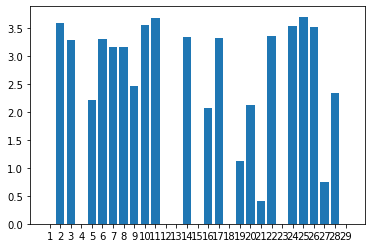

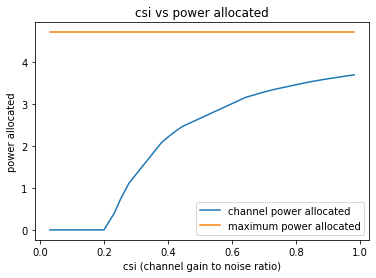

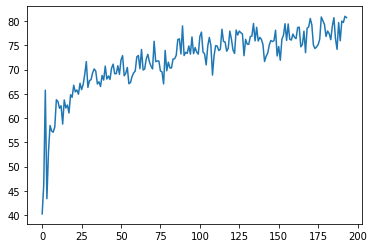

194
Power Allocated= 3.6327102806164824
CSI= 0.911030004848929
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3277774183121234
CSI= 0.2938936352388577
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.40667121206669
CSI= 0.4303485671107501
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6601280255186106
CSI= 0.9343690374550048
SNR= 4.988821639600507
Client: client4
Model client4 Train Epoch: 1 [0/384 (0%)]	Loss: 0.520245


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client4 Train Epoch: 2 [0/384 (0%)]	Loss: 0.409741

Power Allocated= 1.824232956847525
CSI= 0.34409951767366387
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.567917
Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.289999

Power Allocated= 3.1056020886492064
CSI= 0.6154729101319157
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6889173612455273
CSI= 0.48984751649723146
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.299938720223311
CSI= 0.4114497836726174
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5321868163279273
CSI= 0.8345976427320153
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.376535087352595
CSI= 0.22968262621727997
SNR= 6.445983530041328
Client: c

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Model client19 Train Epoch: 2 [0/384 (0%)]	Loss: 0.395471

Power Allocated= 0
CSI= 0.16595206398648832
SNR= 15.719034446696819
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8134679951623403
CSI= 0.5216753571327168
SNR= 15.73789526637954
Client: client21
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6630788961052776
CSI= 0.9369524046016783
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 [0/384 (0%)]	Loss: 0.419285
Model client23 Train Epoch: 2 [0/384 (0%)]	Loss: 0.272847

Power Allocated= 0
CSI= 0.09705212192729751
SNR= 16.727271644180114
Client: client24
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05723602288003715
SNR= 19.824374113130002
Client: client25
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11488655175586016
SNR= 20.183965356389123
Client: client26
Poor Channel, client not taken for averagin

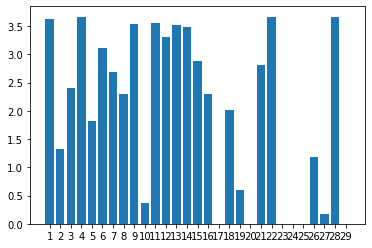

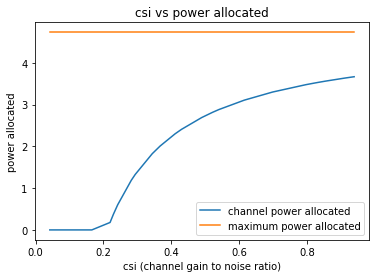

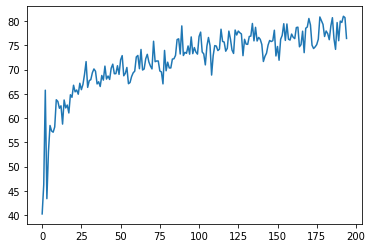

195
Power Allocated= 0
CSI= 0.13519445622165438
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07036928329852388
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.261140081172516
CSI= 0.7589473262739564
SNR= 4.644858008883832
Client: client3
Model client3 Train Epoch: 1 [0/384 (0%)]	Loss: 0.983294
Model client3 Train Epoch: 2 [0/384 (0%)]	Loss: 1.465181


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more inform


Power Allocated= 3.446661685640572
CSI= 0.8833197399985419
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.40061765209383093
CSI= 0.23934112681154485
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07721896758353974
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0025049383784946366
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.517416501279503
CSI= 0.9422068436276587
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6046150530283767
CSI= 0.2516267970780849
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.679283079814249
CSI= 0.5264622293925834
SNR= 6.445983530

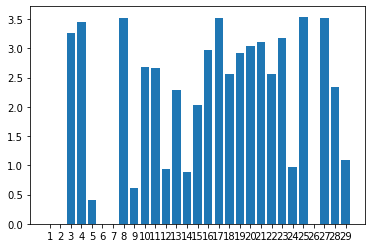

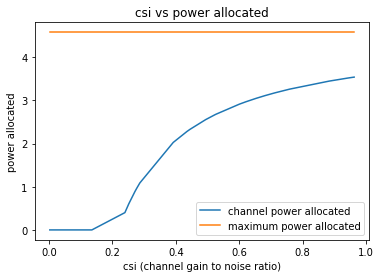

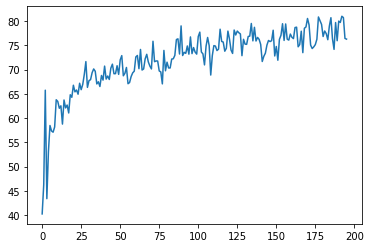

196
Power Allocated= 1.4495045958594588
CSI= 0.3423786625945847
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.319679177382915
CSI= 0.9518658763447522
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.952925233249567
CSI= 0.7055559099429484
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.776324836324795
CSI= 0.385516526578795
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2035501122536849
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.004921368368157597
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3702738276820927
CSI= 0.3333362746572114
SNR= 5.7637168311

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real


Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9731375556766295
CSI= 0.7157633564434148
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.142935551887175
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3136826675481146
CSI= 0.9464635823335152
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.038407906155536686
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.761443110024126
CSI= 0.6215796623491223
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.729181492066064
CSI= 0.609360064075883
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 

/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client17 Train Epoch: 2 [0/384 (0%)]	Loss: 0.197792

Power Allocated= 0
CSI= 0.07897764938764462
SNR= 13.545407086100507
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.294245206004259
CSI= 0.9293661727378865
SNR= 14.92795654834405
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.218593103027394
CSI= 0.8683161612247468
SNR= 15.719034446696819
Client: client20
Model client20 Train Epoch: 1 [0/384 (0%)]	Loss: 1.024935
Model client20 Train Epoch: 2 [0/384 (0%)]	Loss: 0.146144

Power Allocated= 2.6130720688873375
CSI= 0.5690951877901312
SNR= 15.73789526637954
Client: client21
Model client21 Train Epoch: 1 [0/384 (0%)]	Loss: 0.525866
Model client21 Train Epoch: 2 [0/384 (0%)]	Loss: 0.185006

Power Allocated= 3.2092225010053594
CSI= 0.8613080036119882
SNR= 15.814617278939222
Client: client23
Model client23 Train Epoch: 1 [0/384 (0%)]	Loss: 0.712762
Model client23 Train Epoch: 2 [0/384 (0%)]	L

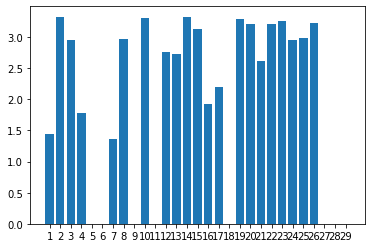

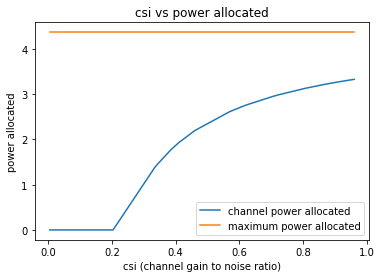

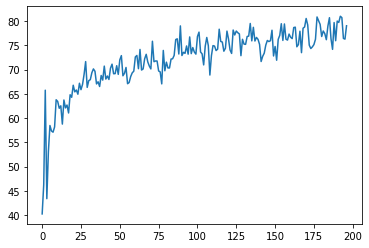

197
Power Allocated= 2.49377203803145
CSI= 0.6103294473973543
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9357506135663893
CSI= 0.8357844164267404
SNR= 4.5296012076772785
Client: client2
Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 0.966336
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 2.292727


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad



Power Allocated= 2.5182113518640934
CSI= 0.6195709886518417
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12823687018459007
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0510995355543775
CSI= 0.9249565462819658
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0391511970312486
CSI= 0.914845948858277
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0912343465812318
CSI= 0.32883951572561065
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10268970045637915
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round


/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.6406111874425537
CSI= 0.6704119374735388
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.29639376405761286
CSI= 0.260699251015476
SNR= 6.445983530041328
Client: client10
Model client10 Train Epoch: 1 [0/384 (0%)]	Loss: 0.984551
Model client10 Train Epoch: 2 [0/384 (0%)]	Loss: 1.216447

Power Allocated= 2.764258548660274
CSI= 0.7310086566377907
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0260988777920845
CSI= 0.9040508035335697
SNR= 7.179421131547728
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1117473156817033
CSI= 0.9799270860832856
SNR= 7.5725046557150355
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7108400533801507
CSI= 0.703536009902635
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging

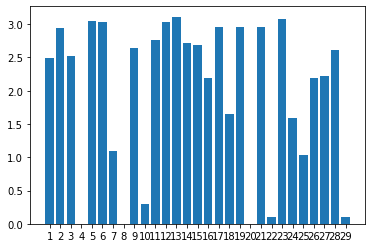

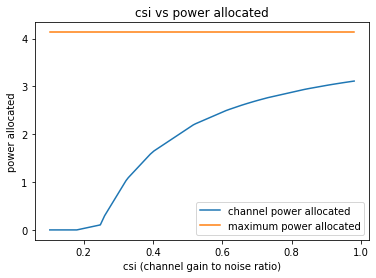

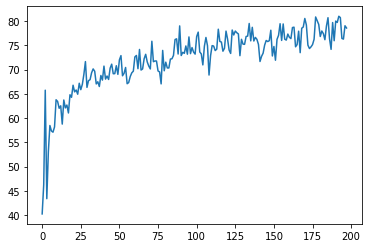

198
Power Allocated= 2.6208113344061466
CSI= 0.8453683360323637
SNR= 3.404789905045086
Client: client1
Model client1 Train Epoch: 1 [0/384 (0%)]	Loss: 0.548540
Model client1 Train Epoch: 2 [0/384 (0%)]	Loss: 0.681824

Power Allocated= 2.460619163326939
CSI= 0.7445414928236713
SNR= 4.5296012076772785
Client: client2


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad


Model client2 Train Epoch: 1 [0/384 (0%)]	Loss: 0.671157
Model client2 Train Epoch: 2 [0/384 (0%)]	Loss: 1.457919

Power Allocated= 2.712521328534502
CSI= 0.9164169758619355
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.560970502937944
CSI= 0.8046624393747112
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3410802638700563
CSI= 0.6836917820133538
SNR= 5.159259245317989
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3170493656733955
CSI= 0.6726404821118176
SNR= 5.481605188045396
Client: client6
Model client6 Train Epoch: 1 [0/384 (0%)]	Loss: 1.198970
Model client6 Train Epoch: 2 [0/384 (0%)]	Loss: 0.263286

Power Allocated= 2.7977540247689645
CSI= 0.9940618440055554
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06937341832

/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_np_received=(key_np_received/(h)).real



Power Allocated= 2.0392003264679444
CSI= 0.5667240086944579
SNR= 7.5725046557150355
Client: client13
Model client13 Train Epoch: 1 [0/384 (0%)]	Loss: 0.740207
Model client13 Train Epoch: 2 [0/384 (0%)]	Loss: 0.355296

Power Allocated= 1.2550953647068512
CSI= 0.39236731189274887
SNR= 7.593315553337266
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7917614829651587
CSI= 0.4970262496674258
SNR= 8.858041469455715
Client: client15
Model client15 Train Epoch: 1 [0/384 (0%)]	Loss: 0.786783
Model client15 Train Epoch: 2 [0/384 (0%)]	Loss: 0.324147

Power Allocated= 1.850017277389461
CSI= 0.51184659324756
SNR= 13.12832021207836
Client: client16
Model client16 Train Epoch: 1 [0/384 (0%)]	Loss: 1.841330
Model client16 Train Epoch: 2 [0/384 (0%)]	Loss: 0.452927

Power Allocated= 1.3908091476299909
CSI= 0.41443587826646877
SNR= 13.376246860649108
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.84647490

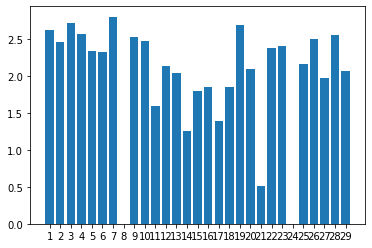

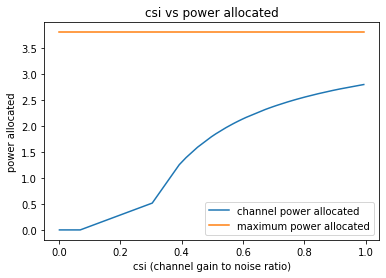

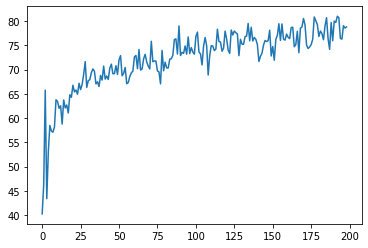

199
Power Allocated= 1.527352834555872
CSI= 0.30411673074718215
SNR= 3.404789905045086
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.342942182648464
CSI= 0.6790610151249121
SNR= 4.5296012076772785
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.563615410107257
CSI= 0.44405989007443303
SNR= 4.644858008883832
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7333095156206273
CSI= 0.9239971785678491
SNR= 4.988821639600507
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8079180655717346
CSI= 0.9924121782861381
SNR= 5.159259245317989
Client: client5
Model client5 Train Epoch: 1 [0/384 (0%)]	Loss: 0.855095


/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/iiitd/.local/lib/python3.8/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  to_return = self.native_grad
/tmp/ipykernel_449329/1844779813.py:57: RuntimeWarning: invalid value encountered in true_divide
  key_

Model client5 Train Epoch: 2 [0/384 (0%)]	Loss: 0.378227

Power Allocated= 0
CSI= 0.1944771606783925
SNR= 5.481605188045396
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6930268243193796
CSI= 0.8908391708460067
SNR= 5.763716831196649
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06334042311986066
SNR= 5.793773047542457
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.009674003579500323
SNR= 5.808528005279032
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.208729962784589
CSI= 0.3836070970045721
SNR= 6.445983530041328
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04147069709799445
SNR= 7.027128190861585
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16301953110772793
SNR= 7.

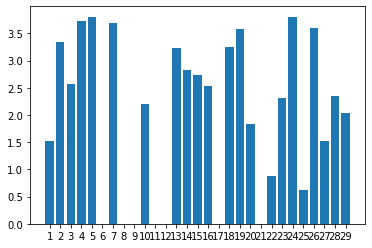

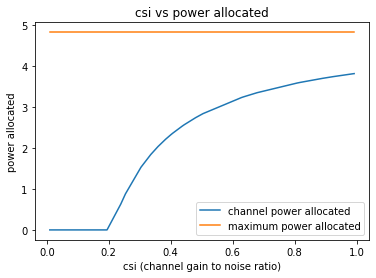

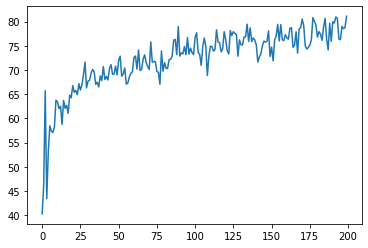

200


In [11]:
for fed_round in range(args.rounds):
    
    client_good_channel=[] #to check which clients have a good channel, only those will be taken for averaging per round

    # Training 
    #even slot
    
    snr=[] #snr of the channel
    csi=[] #csi of the channel
    for ii in range (int(args.clients)-1):
        #snr.append(random.uniform(args.snr_low, args.snr_high))
        csi.append(random.uniform(args.csi_low,args.csi_high))
    
    # if(fed_round==0):
    #     snr,cluster_head=get_cluster()
    if(fed_round==0): #fed_round==0 or True                                        %%%static or moving
        snr,cluster_head=get_cluster()
        temp=copy.deepcopy(cluster_head)
        temp1=copy.deepcopy(snr)
    else:
        #print(temp)
        cluster_head=copy.deepcopy(temp)
        snr=copy.deepcopy(temp1)
    #print(cluster_head)
    smallmu1=0
    gsmall1=3.402823466E+38 
    
    #water filling algorithm
    mu=1e-15
    while(mu<=1):
        #print("yay")
        #pn=max(1/mu-1/csi,0)
        g1=0
        pn1=0
        for jj in csi:
            pn=max(1/mu-1/jj,0)
            g1+=math.log(1+pn*jj) #capacity of a channel (shannon's law)
            pn1+=pn
        g=g1-mu*(pn1-P*(int(args.clients)-1))
        if(g<gsmall1):
            smallmu1=mu
            gsmall1=g
        mu+=0.00002

    #print(smallmu1)
    # poptim=max(1/smallmu1-1/csi1,0)
    # print(poptim)
    index=0
    members=[]
    for i in clients:
        if(i['hook'].id!=cluster_head):
            members.append(i)
        else:
            head=i
    for client in members:
        goodchannel=ClientUpdate(args, device, client,key_np,key,snr[index],csi[index],smallmu1)
        if(goodchannel):
            client_good_channel.append(client)
        index+=1
        
    po=[]    
    for jj in csi:
        po.append(max(1/smallmu1-1/jj,0))
    
    plt.bar([str(i) for i in range (1,len(po)+1)],po,)
    csi.sort()
    po=[]
    for jj in csi:
        po.append(max(1/smallmu1-1/jj,0))
    fig,ax=plt.subplots()
    line1=ax.plot(csi,po,label="channel power allocated")
    line2=ax.plot(csi,[1/smallmu1]*len(csi),label="maximum power allocated")
    ax.set_title("csi vs power allocated")
    ax.set_xlabel("csi (channel gain to noise ratio)")
    ax.set_ylabel("power allocated")
    ax.legend()
    #plt.show()
    

#     # Testing 
#     for client in active_clients:
#         test(args, client['model'], device, client['testset'], client['hook'].id)
    
    
    
    print()
    print("Clients having a good channel and considered for training")
    for no in range (len(client_good_channel)):
        print(client_good_channel[no]['hook'].id)
        
        
        
    # Averaging 
        #odd slot

    head['model'] = averageModels(head['model'],client_good_channel)
    # Testing the average model
    #test(args, global_model, device, global_test_loader, 'Global')
    ac=test(args, head['model'], device, global_test_loader, 'Final')
    accuracy.append(ac)
    
    print("Power in training Round=",sum(po))
    #print("Power cap=",P*len(active_clients))
    
    #print("Total Power =",power_odd+power_even)
    print()
            
    # Share the global model with the clients
    index=0
    for client in members:
        client['model'].load_state_dict(head['model'].state_dict())
        #client=CLientReturn(client,snr[index],csi[index],smallmu1) #CHANGE:Commented
        index+=1
        #client['model']=torch.quantization.quantize_dynamic(client['model'],{torch.nn.Conv2d},dtype=torch.qint8)
        #print(client['model'].conv1.weight.data)
    fig1,ax1=plt.subplots()
    ax1.plot([i for i in range(len(accuracy))],accuracy)
    plt.show()
    print(rc)
    rc+=1

In [12]:
print(accuracy)

[40.26, 46.26, 65.74, 43.4, 53.04, 58.47, 57.34, 57.09, 58.17, 63.77, 63.42, 62.02, 62.52, 58.76, 63.72, 62.09, 62.68, 61.05, 64.8, 64.28, 66.76, 65.4, 65.78, 64.91, 67.17, 65.85, 66.94, 69.01, 71.63, 66.32, 67.71, 67.91, 69.34, 70.12, 69.64, 67.03, 67.47, 66.5, 68.77, 67.82, 70.7, 68.03, 68.66, 67.95, 70.28, 71.1, 69.13, 69.15, 70.78, 69.0, 71.99, 72.86, 68.71, 69.21, 70.42, 67.07, 67.32, 68.55, 69.31, 69.66, 72.59, 72.89, 70.17, 74.13, 69.89, 70.11, 72.21, 73.13, 71.57, 70.71, 70.12, 75.82, 71.61, 71.76, 71.75, 69.7, 69.51, 67.04, 73.93, 69.74, 71.51, 70.32, 70.32, 72.15, 72.21, 72.91, 76.17, 76.32, 73.19, 78.98, 72.88, 73.54, 73.33, 74.85, 73.16, 76.71, 73.27, 74.52, 73.59, 73.17, 76.79, 77.7, 73.61, 73.21, 70.95, 74.8, 76.6, 74.92, 68.86, 72.85, 74.92, 74.83, 73.9, 74.2, 78.3, 75.78, 75.66, 73.77, 74.37, 77.91, 76.28, 74.01, 73.31, 78.13, 77.11, 77.92, 77.57, 77.32, 72.85, 76.22, 75.23, 75.18, 76.8, 76.88, 79.48, 75.9, 78.69, 75.87, 76.61, 76.21, 75.16, 71.65, 72.71, 73.36, 75.03, 